In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
%matplotlib inline
import torch
import pickle
import os
from rdflib import Graph
import rdflib as rdf
import os
from scipy import sparse
import matplotlib.colors as mcolors
import re
from collections import defaultdict
from matplotlib.colors import Normalize
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

c:\Users\luisa\anaconda3\envs\aifb\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [29]:
def read_all_pickle_without_ending(path):
    """
    Read all pickle files in a directory and return a list of the dataframes.
    """
    files = os.listdir(path)
    files = [file for file in files[:5] if file.endswith(".pkl")]
    files.sort()
    dfs = []
    for file in files:
        dfs.append(pd.read_pickle(path + file))
    return dfs

def readallcsvinpath(path):
    """
    Read all csv files in a directory and return a list of the dataframes.
    """
    fil = os.listdir(path)
    fil = [file for file in fil if file.endswith(".csv")]
    fil.sort()
    dfs = []
    for file in fil:
        dfs.append(pd.read_csv(path + file))
    return dfs
def get_nameincolfor_index(df,id_list):
    """
    # df: dataframe
    # id_list: list of ids
    # return: list of names of ids
    """
    name_list=[]
    for i in id_list:
        name_list.append(df[df.index==i][0].values[0])
    return name_list
def cut_string(list):
    for i in range(len(list)):
        list[i] = list[i].split('mov')[1]
    return list
def parse_tensor_string(tensor_str):
    values_str = re.search(r'\[(.*?)\]', tensor_str).group(1)
    values = [float(val) for val in values_str.split(', ')]
    return torch.tensor(values)

In [30]:
files = read_all_pickle_without_ending('out/MUTAG/RGAT_no_emb/')
csv = readallcsvinpath('out/MUTAG/RGAT_no_emb/')
pred_before = torch.load('out/MUTAG/RGAT_no_emb/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/MUTAG/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/MUTAG/RGAT_no_emb/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/MUTAG/RGAT_no_emb/i2r.pkl')

test_list = pd.read_pickle('out/MUTAG/RGAT_no_emb/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
pred_before[2534]

http://dl-learner.org/carcinogenesis#d329_66


array([0.3688593 , 0.63114077], dtype=float32)

In [31]:
i2n[902]

'http://dl-learner.org/carcinogenesis#d121_9'

In [32]:
path = 'out/MUTAG/RGAT_no_emb/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)

12


## Pred Änderung RGAT no emb before/after

#### Relevance that prediction changes, if relevance is changed

In [33]:
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[1])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before



0
0
0
0
0
0
0
0
0
0
0
0
12 816 0
[]
0.0


(array([0, 1], dtype=int64), array([50, 18], dtype=int64))

In [34]:
triples = files[2]
#print(triples[:20])
num_rels = triples[:, 1].max() + 1
print(num_rels)
inverse_relations = torch.cat([triples[:, 2, None], triples[:, 1, None] + num_rels, triples[:, 0, None]], dim=1)
#inverse_relations[:20]
files[2][:,1].max()

tensor(9.)


tensor(8.)

12
0
pred_after15715adapt_tensor([    0, 12877])_1.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


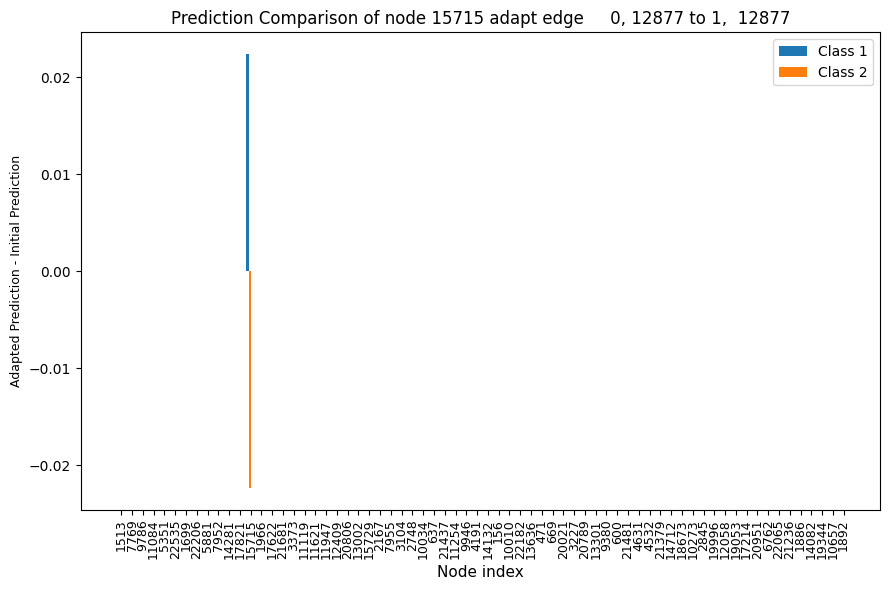

1
pred_after15715adapt_tensor([    1, 12877])_4.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


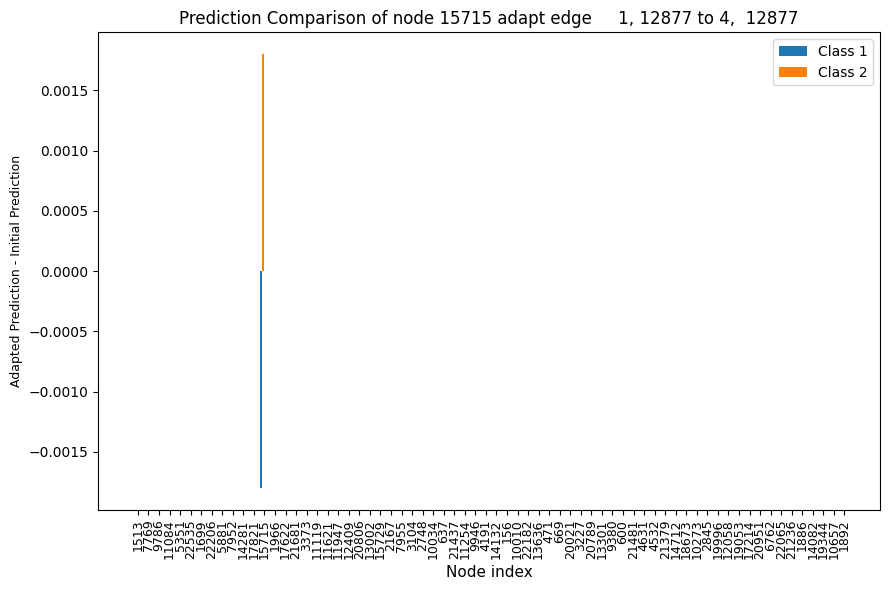

2
pred_after1892adapt_tensor([   0, 7346])_2.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


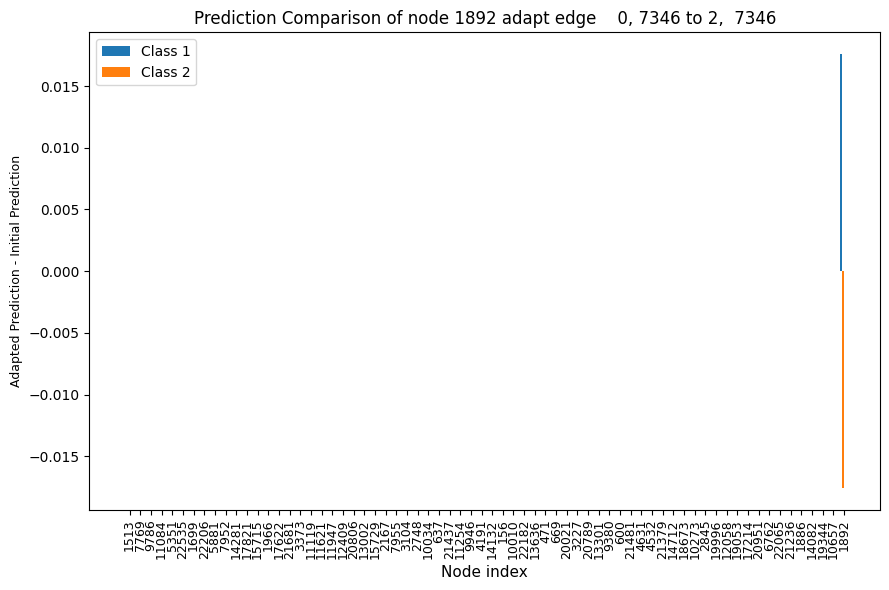

3
pred_after1892adapt_tensor([   5, 7346])_1.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


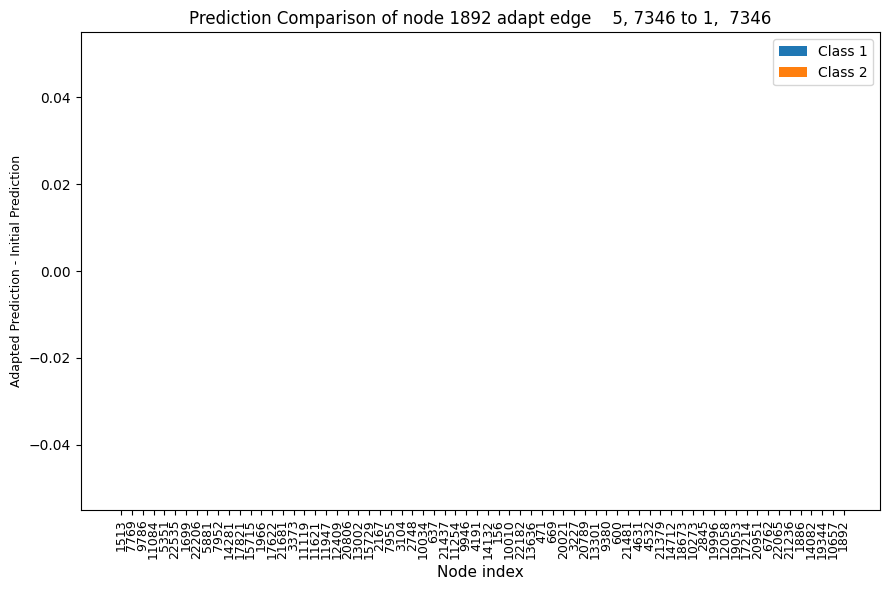

4
pred_after19053adapt_21647_3.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


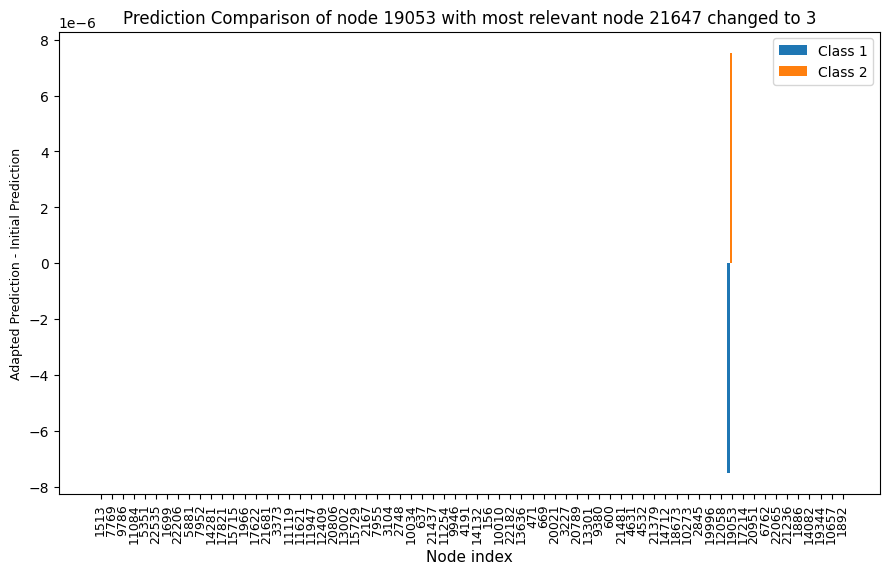

5
pred_after19053adapt_9108_6.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


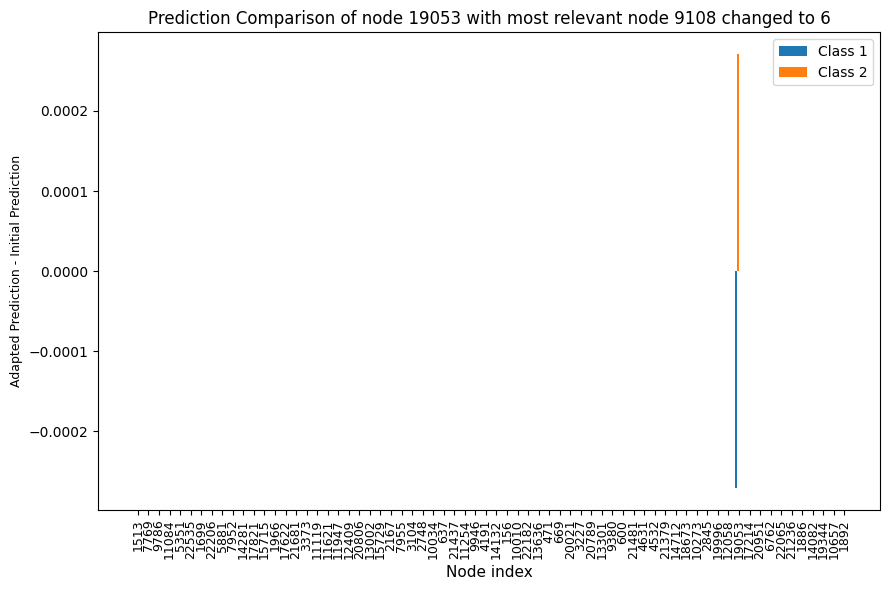

6
pred_after19344adapt_14220_5.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


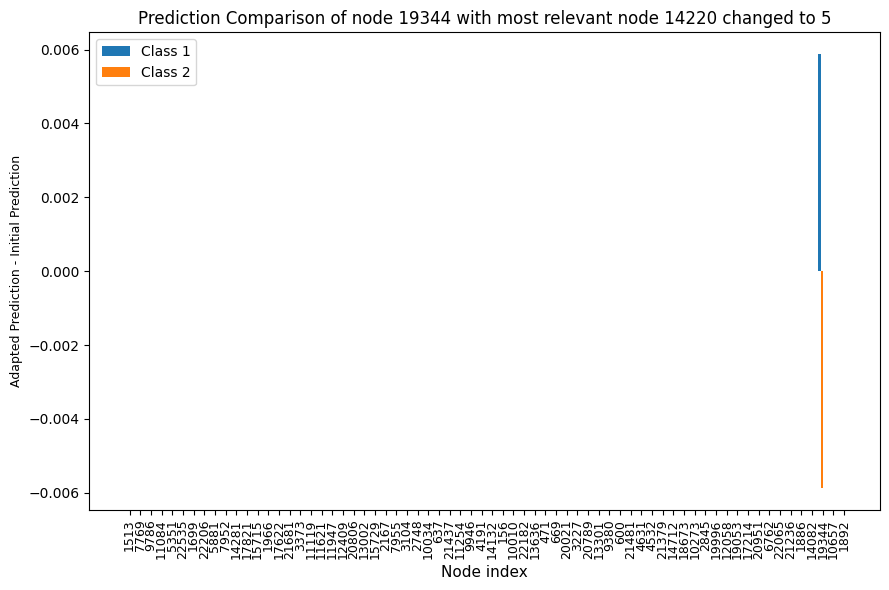

7
pred_after19344adapt_7994_2.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


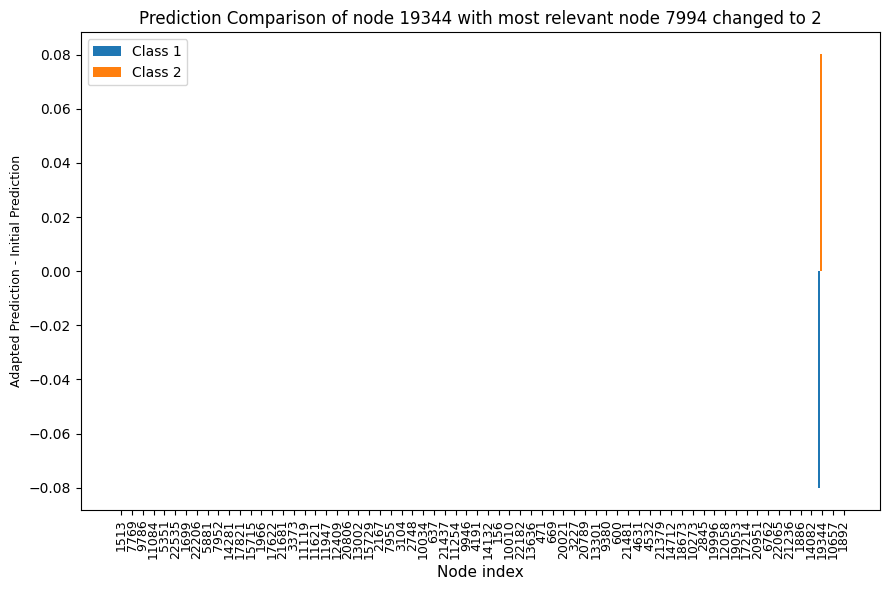

8
pred_after20806adapt_tensor([    0, 17339])_7.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


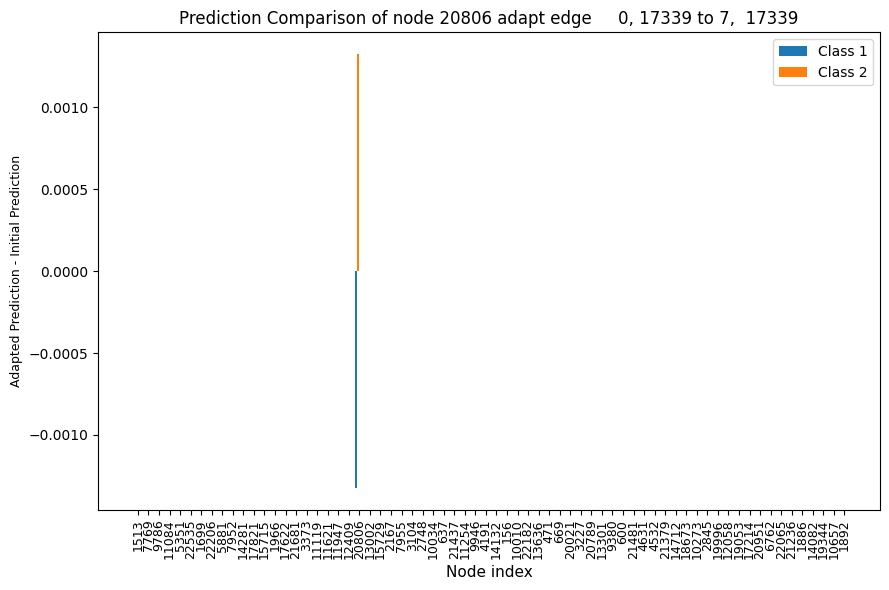

9
pred_after20806adapt_tensor([    1, 16247])_5.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


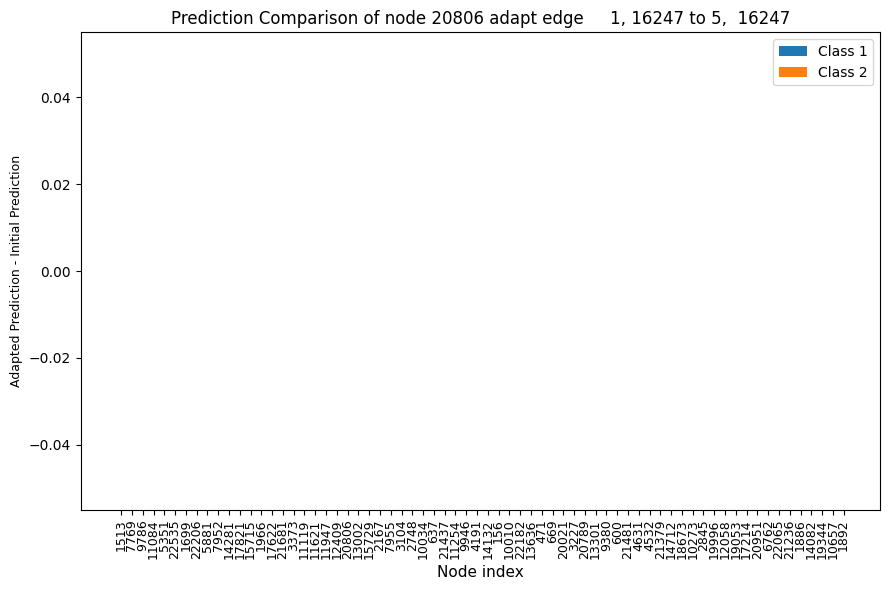

10
pred_after4532adapt_17195_6.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


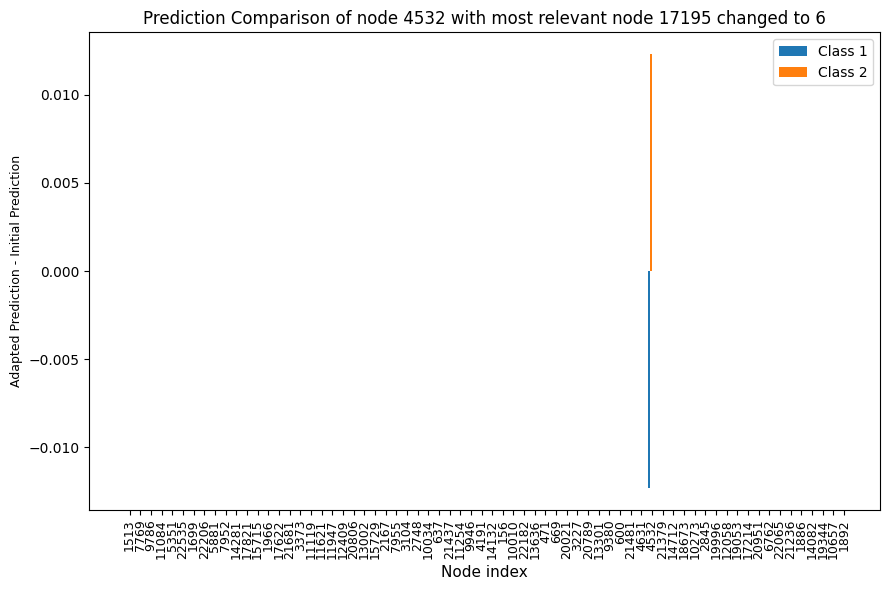

11
pred_after4532adapt_21194_1.pt
(array([0, 1], dtype=int64), array([50, 18], dtype=int64)) (array([0, 1], dtype=int64), array([50, 18], dtype=int64))


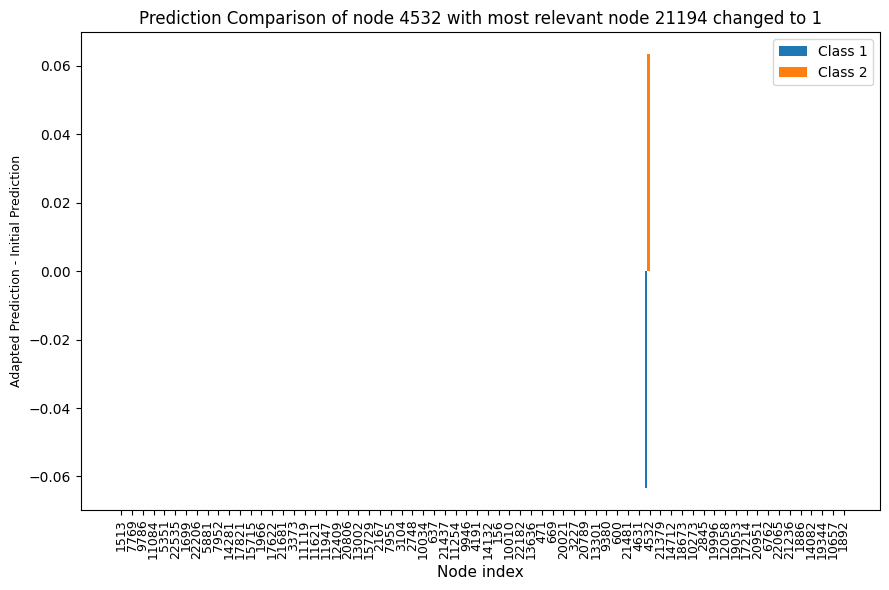

In [37]:
path = 'out/MUTAG/RGAT_no_emb/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(68)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    #plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    #plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=9)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=9)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()

In [10]:
csv[2]

,Unnamed: 0,Unnamed: 1,rel_nodes_new,rel_edges_new,max_nodes_new,pos_max_nodes_new,min_nodes_new,pos_min_nodes_new,max_edges_new,pos_max_edges_new,min_edges_new,pos_min_edges_new
0,67,"tensor(1892, device='cuda:7')","tensor([0., 0., 0., ..., 0., 0., 0.])","tensor([[0., 0., 0., ..., 0., 0., 0.],\r\n ...",1.394902,80,-1.743360,14713,214.210083,"tensor([[ 5, 7346]])",-303.783081,"tensor([[ 0, 7346]])"
1,21,"tensor(20806, device='cuda:7')","tensor([0., 0., 0., ..., 0., 0., 0.])","tensor([[0., 0., 0., ..., 0., 0., 0.],\r\n ...",2.666625,20806,-1.017555,8705,1192.578369,"tensor([[ 1, 16247]])",-1762.065430,"tensor([[ 0, 17339]])"
2,12,"tensor(15715, device='cuda:7')","tensor([0., 0., 0., ..., 0., 0., 0.])","tensor([[0., 0., 0., ..., 0., 0., 0.],\r\n ...",1.023807,15715,-0.392724,8705,148.091614,"tensor([[ 1, 19024]])",-375.180664,"tensor([[ 0, 19024]])"


#### Prediction changed from working group 0 to working group 2.

In [11]:
edge_index_plus = files[0]
edge_type_plus = files[1]
edges_list = files[2]
i2n = files[3]
i2r = files[4]
test_idx = files[5]

IndexError: list index out of range

In [12]:
large_after_nodes = csv[0]
large_after_edges = csv[1]
edges = csv[2]
nodes = csv[3]
small_after_nodes = csv[4]
small_after_edges = csv[5]

# Auswertung Relevanzen
#### Average relevance nodes

In [36]:
path = 'out/MUTAG/RGAT_no_emb/relevances/'
dist = 'out/MUTAG/RGAT_emb/DistMult/relevances/'
transe = 'out/MUTAG/RGAT_emb/TransE/relevances/'
transh = 'out/MUTAG/RGAT_emb/TransH/relevances/'
list_paths = [path,dist,transe,transh]
fil = os.listdir(path)
dist2 = os.listdir(dist)
transe2 = os.listdir(transe)
transh2 = os.listdir(transh)
rel_before = [file for file in fil if file.startswith("relevances_node_")]
rel_bef_dist = [file for file in dist2 if file.startswith("relevances_node_")]
rel_bef_transe = [file for file in transe2 if file.startswith("relevances_node_")]
rel_bef_transh = [file for file in transh2 if file.startswith("relevances_node_")]
count_path= 0
for l in [rel_before,rel_bef_dist,rel_bef_transe,rel_bef_transh]:
    path2 = list_paths[count_path]
    count_path += 1
    print('######',path2,'######')
    mean_rel_ges = 0 
    count_zero_ges = 0
    count_positive_ges = 0
    count_negative_ges = 0 
    mean_positive = 0
    mean_negative = 0
    max_positive = 0
    max_negative = 0
    count = 0
    #print(path2)
    for rel in l:
        #print(rel)
        #print(path2)
        rb = torch.load(path2 + rel)
        rb_non_zero = rb[rb != 0]
        rb_count_zero = rb[rb == 0]
        mean_rel= rb_non_zero.mean(axis=0)
        rb_count_positive = rb[rb > 0]
        rb_count_negative = rb[rb < 0]
        mean_rel_ges += mean_rel
        count_zero_ges += len(rb_count_zero)
        count_positive_ges += len(rb_count_positive)
        count_negative_ges += len(rb_count_negative)
        count += 1
        mean_positive += rb_count_positive.mean(axis=0)
        if len(rb_count_negative) != 0:
            mean_negative += rb_count_negative.mean(axis=0)
        if int(rb_count_positive.max(axis=0)[0]) > max_positive:
            max_positive =int( rb_count_positive.max(axis=0)[0])
        if len(rb_count_negative) != 0:
            if int(rb_count_negative.min(axis=0)[0]) < max_negative:
                max_negative = int(rb_count_negative.min(axis=0)[0])
        else:
            max_negative = 0
    mean_positive_ges = mean_positive / count
    mean_negative_ges = mean_negative / count
    percentage_zero =   count_zero_ges / (len(rb)* len(l))
    percentage_positive = count_positive_ges / (len(rb)* len(l))
    percentage_negative = count_negative_ges / (len(rb)* len(l))
    mean_rel_ges = mean_rel_ges / count
    print('Average_relevance without zero: ',mean_rel_ges, '\n',
            'Proportion 0 relevance: ', percentage_zero, '\n',
            'Proportion positive relevance: ', percentage_positive, '\n',
            'Proportion negative relevance: ',percentage_negative, '\n',
            'Average positive relevance: ', mean_positive_ges, '\n',
            'Average negative relevance: ',mean_negative_ges, '\n',
            'Max positive relevance: ', max_positive, '\n',
            'Max negative relevance: ', max_negative, '\n',)

###### out/MUTAG/RGAT_no_emb/relevances/ ######


Average_relevance without zero:  tensor(0.0145) 
 Proportion 0 relevance:  0.9960586408476434 
 Proportion positive relevance:  0.002253510099692051 
 Proportion negative relevance:  0.0016878490526645441 
 Average positive relevance:  tensor(0.1026) 
 Average negative relevance:  tensor(-0.0988) 
 Max positive relevance:  7 
 Max negative relevance:  -5 

###### out/MUTAG/RGAT_emb/DistMult/relevances/ ######
Average_relevance without zero:  tensor(0.0145) 
 Proportion 0 relevance:  0.9960586408476434 
 Proportion positive relevance:  0.0023265828070358576 
 Proportion negative relevance:  0.001614776345320737 
 Average positive relevance:  tensor(0.1148) 
 Average negative relevance:  tensor(-0.1112) 
 Max positive relevance:  15 
 Max negative relevance:  -7 

###### out/MUTAG/RGAT_emb/TransE/relevances/ ######
Average_relevance without zero:  tensor(0.0145) 
 Proportion 0 relevance:  0.9960586408476434 
 Proportion positive relevance:  0.0020134140612766845 
 Proportion negative rel

## Relevanzverteilung vor/nach Tausch Kante

relevances_after_node_node_19053adapt_21647_3.pt 19053 21647 relevances_node_19053.pt


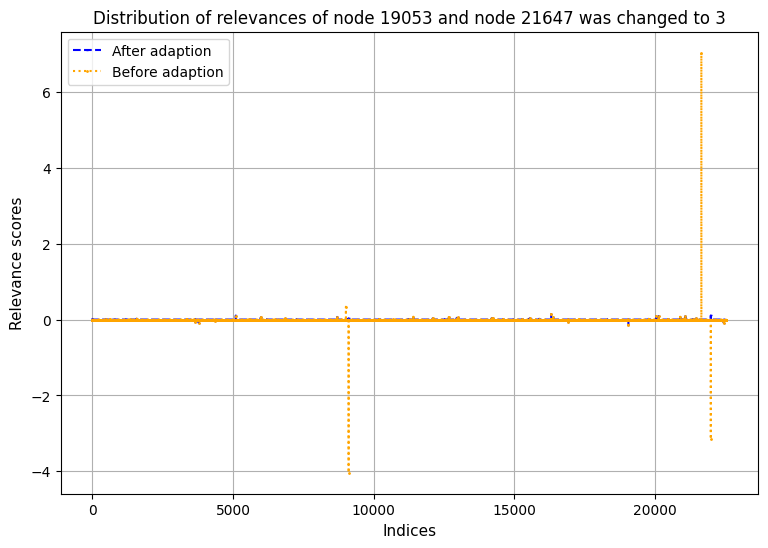

relevances_after_node_node_19053adapt_9108_6.pt 19053 9108 relevances_node_19053.pt


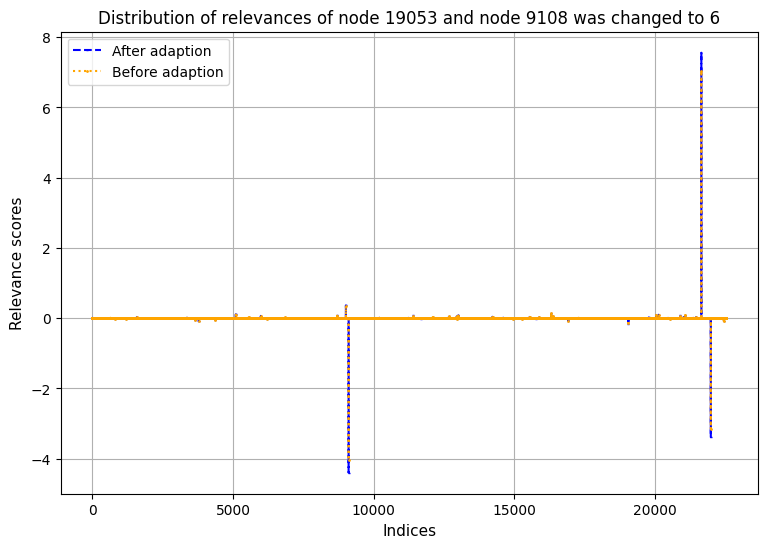

relevances_after_node_node_19344adapt_14220_5.pt 19344 14220 relevances_node_19344.pt


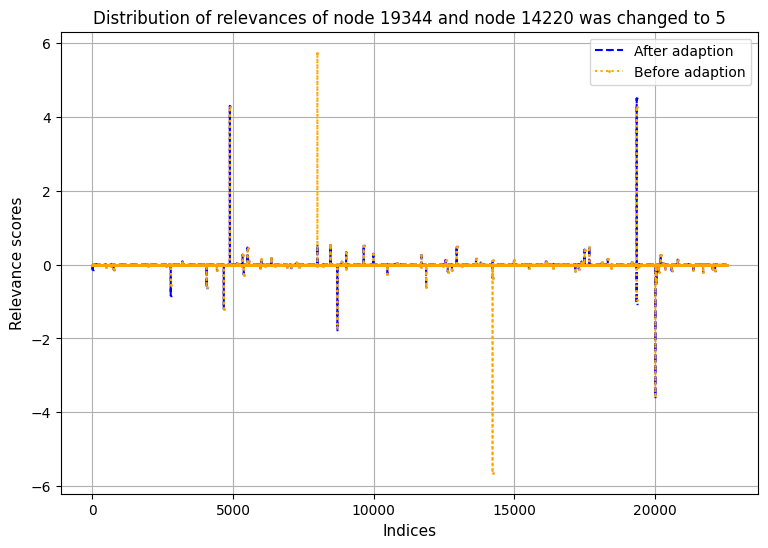

relevances_after_node_node_19344adapt_7994_2.pt 19344 7994 relevances_node_19344.pt


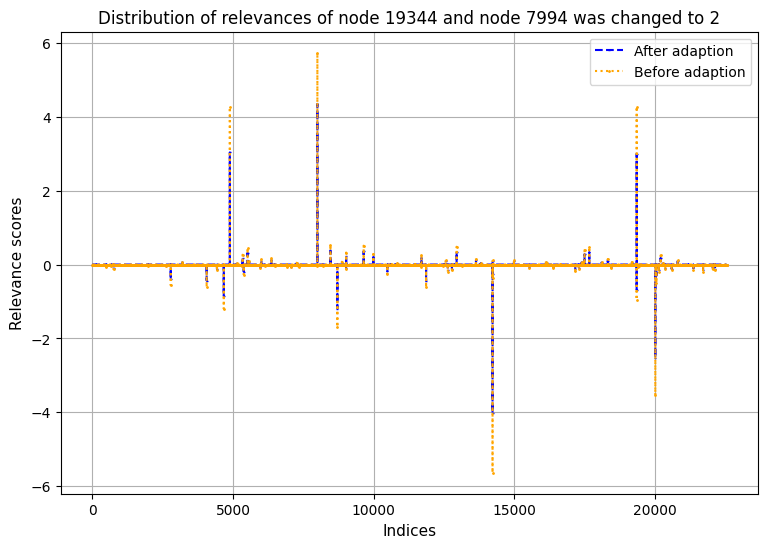

relevances_after_node_node_4532adapt_17195_6.pt 4532 17195 relevances_node_4532.pt


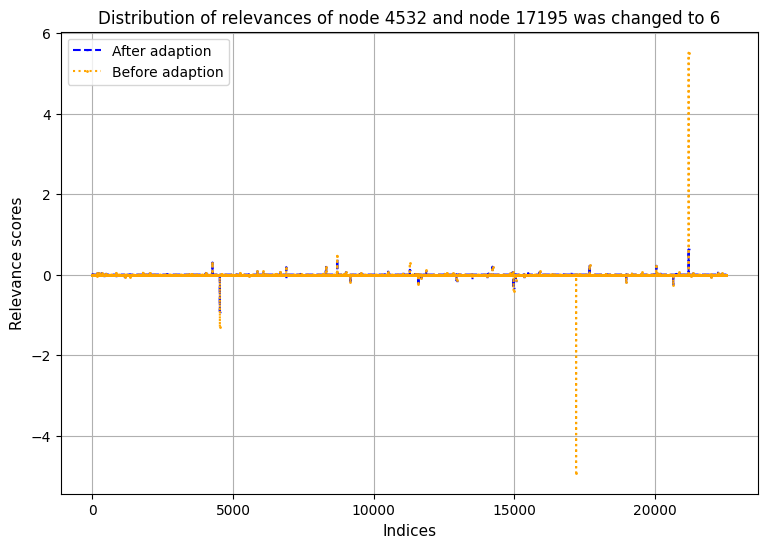

relevances_after_node_node_4532adapt_21194_1.pt 4532 21194 relevances_node_4532.pt


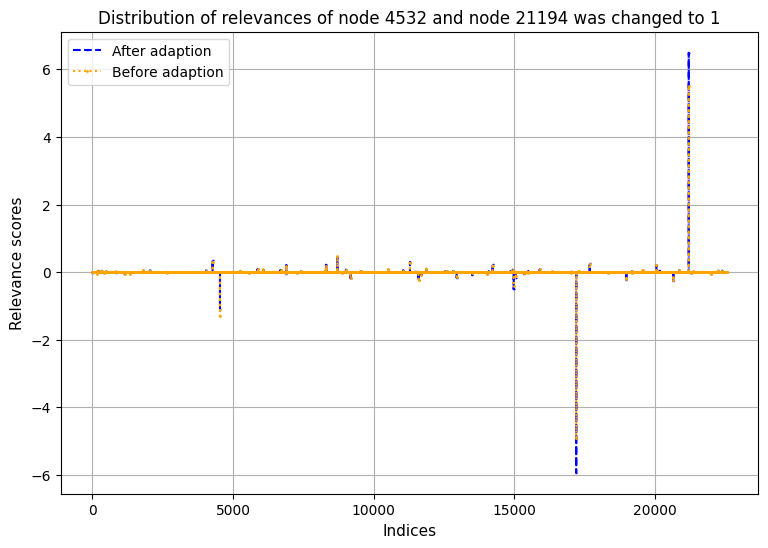

In [38]:
path = 'out/MUTAG/RGAT_no_emb/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_node_node_")]
rel_before = [file for file in fil if file.startswith("relevances_node_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('node_node_')[1].split('adapt')[0]
    adapt_node = rel.split('adapt_')[1].split('_')[0]
    to_node = rel.split('adapt_')[1].split('_')[1].split('.')[0]
    for rel2 in rel_before:
        

        if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            #ra = np.sort(ra)
            #rb = np.sort(rb)
            #Create an array of indices for the sorted data
            indices = np.arange(1, len(ra) + 1)

            # Create a line plot with different line styles and markers
            plt.figure(figsize=(9, 6))
            plt.plot(indices, ra, color='blue', linestyle='--', marker='_', markersize=2, label='After adaption')
            plt.plot(indices, rb, color='orange', linestyle='dotted', marker='.', markersize=2, label='Before adaption')

            plt.xlabel('Indices', fontsize=11)
            plt.ylabel('Relevance scores', fontsize=11)
            plt.title('Distribution of relevances of node {} and node {} was changed to {}'.format(node_name,adapt_node,to_node))
            plt.legend()
            plt.grid(True)
            plt.show()



In [15]:
path = 'out/MUTAG/RGAT_no_emb/relevances/'

fil = os.listdir(path)
rel_after = [file for file in fil if file.startswith("relevances_after_node_node_")]
rel_before = [file for file in fil if file.startswith("relevances_node_")]

In [16]:
path = 'out/MUTAG/RGAT_no_emb/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_node_node_")]
rel_before = [file for file in fil if file.startswith("relevances_node_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('node_node_')[1].split('adapt')[0]
    adapt_node = rel.split('adapt_')[1].split('_')[0]
    to_node = rel.split('adapt_')[1].split('_')[1].split('.')[0]
    for rel2 in rel_before:
        

        if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            #nonzero_indices =  np.where((ra <= -0.05) | (ra >= 0.05) )
            change = ra - rb
            if change.sum() == 0:
                continue
            print(change.max(), change.min())
            # Set a threshold for significant change
            threshold = 10

            # Filter out points with insignificant change
            nonzero_indices = np.where(np.abs(change) > threshold)
            #nonzero_indices = np.where((change<= -0.00001))#|(change>= 0.000001))
            print(nonzero_indices)
            plt.figure(figsize=(8, 6))
            if change[nonzero_indices].sum() == 0:
                continue
            max_abs_change = np.max(np.abs(change[nonzero_indices]))
            scatter = plt.scatter(
                rb,
                ra,
                c=change,
                cmap='coolwarm',
                alpha=0.9,
                norm=Normalize(vmin=-max_abs_change, vmax=max_abs_change)
            )

            # Add index labels for non-zero relevances
            label_offset = 0.01
            for idx in nonzero_indices[0]:
                plt.text(
                    rb[idx] + label_offset,
                    ra[idx] + label_offset,
                    str(idx),
                    fontsize=10
                )

            # Set x-axis label
            plt.xlabel('Relevances Before Adaption', fontsize=11)

            # Set y-axis label
            plt.ylabel('Relevances After Adaption', fontsize=11)
            plt.title(('Change in Relevance of node {} adapting node {} to {}'.format(node_name, adapt_node, to_node)))
            # Add a colorbar to indicate change
            cbar = plt.colorbar(scatter)
            cbar.set_label('Change in Relevance of node ', fontsize=11)

            # Set plot limits and add grid
            # plt.xlim(-2, 4)
            # plt.ylim(-2, 4)
            plt.axhline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.axvline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.grid(True)

            # Show the plot
            plt.show()

relevances_after_node_node_19053adapt_21647_3.pt 19053 21647 relevances_node_19053.pt
4.0712223 -7.0363846
(array([], dtype=int64),)
relevances_after_node_node_19053adapt_9108_6.pt 19053 9108 relevances_node_19053.pt
0.5210495 -0.36178446
(array([], dtype=int64),)
relevances_after_node_node_19344adapt_14220_5.pt 19344 14220 relevances_node_19344.pt
5.634215 -5.213328
(array([], dtype=int64),)
relevances_after_node_node_19344adapt_7994_2.pt 19344 7994 relevances_node_19344.pt
1.6161084 -1.3835807
(array([], dtype=int64),)
relevances_after_node_node_4532adapt_17195_6.pt 4532 17195 relevances_node_4532.pt
4.920489 -4.885216
(array([], dtype=int64),)
relevances_after_node_node_4532adapt_21194_1.pt 4532 21194 relevances_node_4532.pt
0.98229265 -1.0181875
(array([], dtype=int64),)


<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

## Edges

relevances_after_edge_edge_15715_12877adapt_tensor([    0, 12877])_1.pt 15715  12877 relevances_edge_15715.pt
[[ 4.07453021e-03  3.86401778e-03  1.32000000e+02  0.00000000e+00]
 [ 1.05578668e-01  8.65589231e-02  2.38000000e+02  0.00000000e+00]
 [ 1.52711830e+01  1.15312519e+01  3.51000000e+02  0.00000000e+00]
 ...
 [-1.22345975e-02 -1.00271394e-02  2.13570000e+04  8.00000000e+00]
 [ 1.08991843e-02  8.94367788e-03  2.15240000e+04  8.00000000e+00]
 [-5.58527093e-03 -5.28621487e-03  2.22530000e+04  8.00000000e+00]]
-8.686829460202716e-05
1831.6836476325989 -772.0286606550217
non : 1


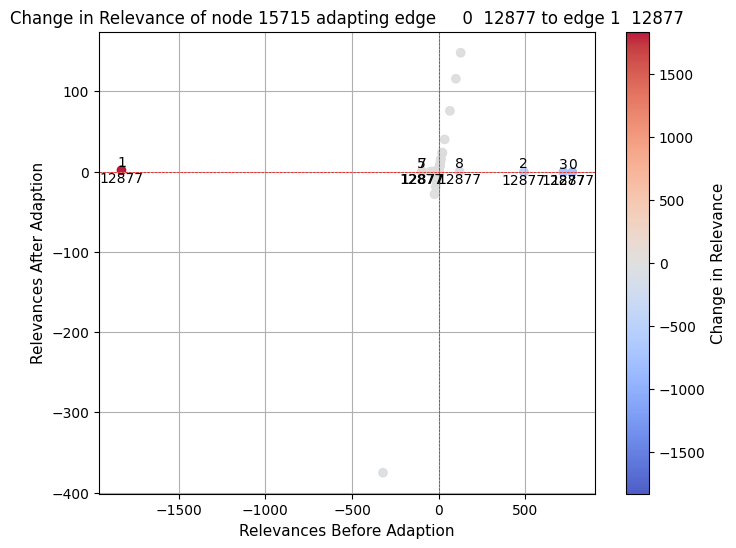

relevances_after_edge_edge_15715_12877adapt_tensor([    1, 12877])_4.pt 15715  12877 relevances_edge_15715.pt
[[ 3.83010739e-03  3.86401778e-03  1.32000000e+02  0.00000000e+00]
 [ 8.56703222e-02  8.65589231e-02  2.38000000e+02  0.00000000e+00]
 [ 1.14336491e+01  1.15312519e+01  3.51000000e+02  0.00000000e+00]
 ...
 [-9.93913319e-03 -1.00271394e-02  2.13570000e+04  8.00000000e+00]
 [ 8.08239542e-03  8.94367788e-03  2.15240000e+04  8.00000000e+00]
 [-5.23974746e-03 -5.28621487e-03  2.22530000e+04  8.00000000e+00]]
0.00034144851815653965
264.0123291015625 -111.28558349609375
non : 1


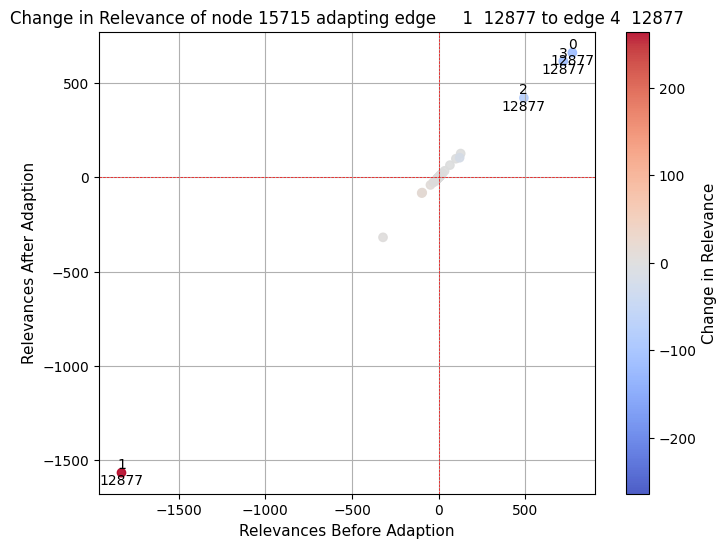

relevances_after_edge_edge_1892_7346adapt_tensor([   0, 7346])_2.pt 1892  7346 relevances_edge_1892.pt
[[ 9.35001314e-01  1.00402212e+00  8.00000000e+01  0.00000000e+00]
 [ 3.70759517e-04  3.96557152e-04  1.32000000e+02  0.00000000e+00]
 [-7.59998932e-02 -8.12883526e-02  6.99000000e+02  0.00000000e+00]
 ...
 [ 1.13640152e-01  1.21548086e-01  2.15420000e+04  8.00000000e+00]
 [-5.77237606e-01 -6.17406130e-01  2.17190000e+04  8.00000000e+00]
 [-2.80229777e-01 -3.00958365e-01  2.17330000e+04  8.00000000e+00]]
0.006934787175850943
6125.2530517578125 -8716.380737304688
non : 1


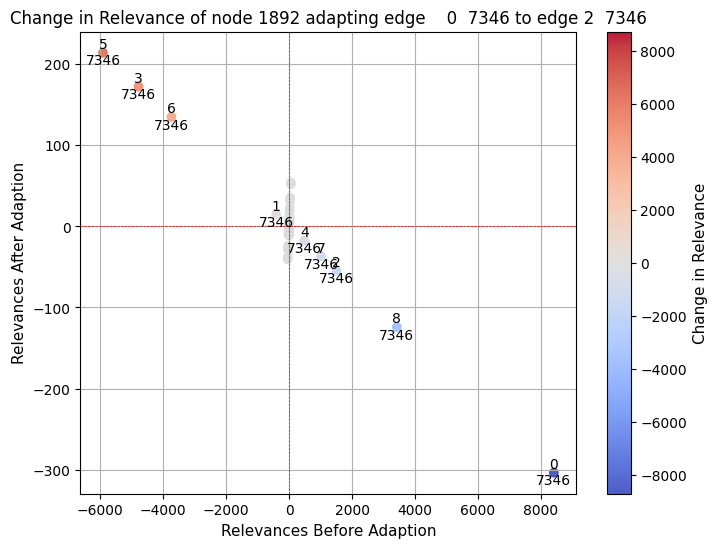

relevances_after_edge_edge_1892_7346adapt_tensor([   5, 7346])_1.pt 1892  7346 relevances_edge_1892.pt
[[ 1.00402212e+00  1.00402212e+00  8.00000000e+01  0.00000000e+00]
 [ 3.96557152e-04  3.96557152e-04  1.32000000e+02  0.00000000e+00]
 [-8.12883526e-02 -8.12883526e-02  6.99000000e+02  0.00000000e+00]
 ...
 [ 1.21548086e-01  1.21548086e-01  2.15420000e+04  8.00000000e+00]
 [-6.17406130e-01 -6.17406130e-01  2.17190000e+04  8.00000000e+00]
 [-3.00958365e-01 -3.00958365e-01  2.17330000e+04  8.00000000e+00]]
0.0
relevances_after_edge_edge_20806_16247adapt_tensor([    1, 16247])_5.pt 20806  16247 relevances_edge_20806.pt
[[ 1.13876611e-02  1.13876611e-02  1.32000000e+02  0.00000000e+00]
 [ 1.20931506e-01  1.20931506e-01  4.17000000e+02  0.00000000e+00]
 [-8.67915821e+00 -8.67915821e+00  4.88000000e+02  0.00000000e+00]
 ...
 [ 1.13704413e-01  1.13704413e-01  2.14030000e+04  8.00000000e+00]
 [ 2.25557953e+02  2.25557953e+02  2.19910000e+04  8.00000000e+00]
 [-1.17152870e-01 -1.17152870e-01  

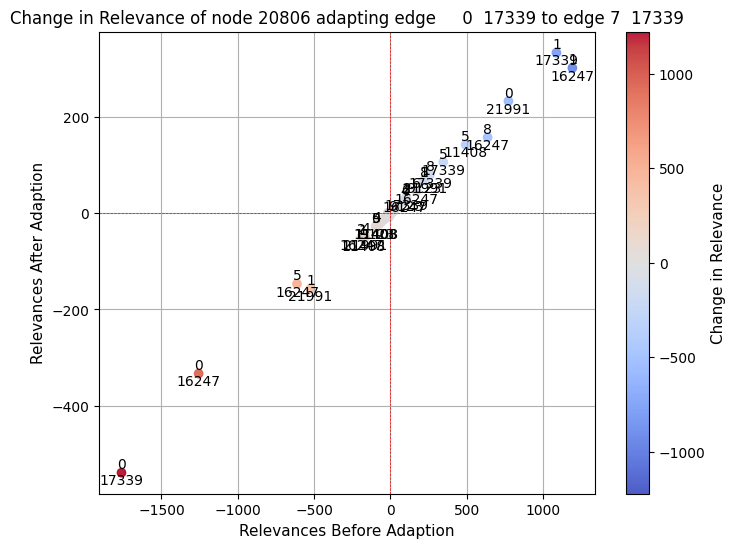

In [40]:
path = 'out/MUTAG/RGAT_no_emb/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_edge_edge_")]
rel_before = [file for file in fil if file.startswith("relevances_edge_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('edge_edge_')[1].split('_')[0]
    adapt_edge_name = rel.split('[')[1].split(',')[0]
    to_edge = rel.split('_')[-1].split('.')[0]
    adapt_node = rel.split(',')[-1].split(']')[0]
    XX,YY = np.meshgrid(np.arange(ra.shape[1]),np.arange(ra.shape[0]))
    
    for rel2 in rel_before:
        

         if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            table = np.vstack((ra.ravel(),rb.ravel(),XX.ravel(),YY.ravel())).T
            table = table[table[:,0] != 0]
            print(table)
            #nonzero_indices =  np.where((ra <= -0.05) | (ra >= 0.05) )
            change = table[:,0] - table[:,1]
            print(change.sum())
            if change.sum() == 0:
                continue
            print(change.max(), change.min())
            # Set a threshold for significant change
            threshold = 60

            # Filter out points with insignificant change
            nonzero_indices = np.where(np.abs(change) > threshold)
            print('non :',len(nonzero_indices))
            #nonzero_indices = np.where((change<= -0.00001))#|(change>= 0.000001))
            plt.figure(figsize=(8, 6))
            if change[nonzero_indices].sum() == 0:
                continue
            max_abs_change = np.max(np.abs(change[nonzero_indices]))
            scatter = plt.scatter(
                table[:,1],
                table[:,0],
                c=change,
                cmap='coolwarm',
                alpha=0.9,
                norm=Normalize(vmin=-max_abs_change, vmax=max_abs_change)
            )

            

            # Add index labels for each point
            for i, (idx1, idx2) in enumerate(zip(table[:,3][nonzero_indices], table[:,2][nonzero_indices])):
                label = f'{int(idx1)}\n{int(idx2)}'  # Combine the two indices into one label
                plt.text(table[:,1][nonzero_indices][i], table[:,0][nonzero_indices][i], label, fontsize=10, ha='center', va='center')



            # Set x-axis label
            plt.xlabel('Relevances Before Adaption', fontsize=11)

            # Set y-axis label
            plt.ylabel('Relevances After Adaption', fontsize=11)
            plt.title(('Change in Relevance of node {} adapting edge {} {} to edge {} {}'.format(node_name, adapt_edge_name, adapt_node, to_edge, adapt_node)))
            # Add a colorbar to indicate change
            cbar = plt.colorbar(scatter)
            cbar.set_label('Change in Relevance', fontsize=11)

            # Set plot limits and add grid
            # plt.xlim(-2, 4)
            # plt.ylim(-2, 4)
            plt.axhline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.axvline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.grid(True)

            # Show the plot
            plt.show()

# RGAT

### Auswertung Relevanzen

In [18]:
path = 'out/MUTAG/RGAT_no_emb/relevances/'
dist = 'out/MUTAG/RGAT_emb/DistMult/relevances/'
transe = 'out/MUTAG/RGAT_emb/TransE/relevances/'
transh = 'out/MUTAG/RGAT_emb/TransH/relevances/'
list_paths = [path,dist,transe,transh]
fil = os.listdir(path)
dist2 = os.listdir(dist)
transe2 = os.listdir(transe)
transh2 = os.listdir(transh)
rel_before = [file for file in fil if file.startswith("relevances_edge_")]
rel_bef_dist = [file for file in dist2 if file.startswith("relevances_edge_")]
rel_bef_transe = [file for file in transe2 if file.startswith("relevances_edge_")]
rel_bef_transh = [file for file in transh2 if file.startswith("relevances_edge_")]
count_path= 0
for l in [rel_before,rel_bef_dist,rel_bef_transe,rel_bef_transh]:
    path2 = list_paths[count_path]
    count_path += 1
    print('######',path2,'######')
    mean_rel_ges = 0 
    count_zero_ges = 0
    count_positive_ges = 0
    count_negative_ges = 0 
    mean_positive = 0
    mean_negative = 0
    count = 0
    #print(path2)
    for rel in l:
        rb = torch.load(path2 + rel)
        #print(path2, rel)
        #print(rb.sum())
        rb_non_zero = rb[rb != 0]
        rb_count_zero = rb[rb == 0]
        mean_rel= rb_non_zero.mean(axis=0)
        rb_count_positive = rb[rb > 0]
        rb_count_negative = rb[rb < 0]
        mean_rel_ges += mean_rel
        #print(mean_rel)
        count_zero_ges += len(rb_count_zero)
        count_positive_ges += len(rb_count_positive)
        count_negative_ges += len(rb_count_negative)
        count += 1
        mean_positive += rb_count_positive.mean(axis=0)
        mean_negative += rb_count_negative.mean(axis=0)
    mean_positive_ges = mean_positive / count
    mean_negative_ges = mean_negative / count
    percentage_zero =   count_zero_ges / (len(rb)* len(l))
    percentage_positive = count_positive_ges / (len(rb)* len(l))
    percentage_negative = count_negative_ges / (len(rb)* len(l))
    mean_rel_ges = mean_rel_ges / count
    print('Average_relevance without zero: ',mean_rel_ges, '\n',
            'Proportion 0 relevance: ', percentage_zero, '\n',
            'Proportion positive relevance: ', percentage_positive, '\n',
            'Proportion negative relevance: ',percentage_negative, '\n',
            'Average positive relevance: ', mean_positive_ges, '\n',
            'Average negative relevance: ',mean_negative_ges)

###### out/MUTAG/RGAT_no_emb/relevances/ ######
Average_relevance without zero:  tensor(0.0016) 
 Proportion 0 relevance:  22451.16176470588 
 Proportion positive relevance:  44.5735294117647 
 Proportion negative relevance:  44.26470588235294 
 Average positive relevance:  tensor(1.6296) 
 Average negative relevance:  tensor(-1.5994)
###### out/MUTAG/RGAT_emb/DistMult/relevances/ ######
Average_relevance without zero:  tensor(0.0016) 
 Proportion 0 relevance:  22451.16176470588 
 Proportion positive relevance:  44.88725490196079 
 Proportion negative relevance:  43.950980392156865 
 Average positive relevance:  tensor(1.2849) 
 Average negative relevance:  tensor(-1.2968)
###### out/MUTAG/RGAT_emb/TransE/relevances/ ######
Average_relevance without zero:  tensor(0.0016) 
 Proportion 0 relevance:  22451.16176470588 
 Proportion positive relevance:  44.751633986928105 
 Proportion negative relevance:  44.08660130718954 
 Average positive relevance:  tensor(29.9279) 
 Average negative re

# RGAT TransE

In [41]:
model = 'TransE'
csv = readallcsvinpath('out/MUTAG/RGAT_emb/')
pred_before = torch.load('out/MUTAG/RGAT_emb/'+model+'/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/MUTAG/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/MUTAG/RGAT_emb/'+model+'/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/MUTAG/RGAT_emb/'+model+'/i2r.pkl')

test_list = pd.read_pickle('out/MUTAG/RGAT_emb/'+model+'/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
path = 'out/MUTAG/RGAT_emb/'+model+'/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[1])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before

http://dl-learner.org/carcinogenesis#d329_66
12
22
22
22
22
22
22
22
22
22
22
22
22
12 816 264
[ 4  6  8 12 13 15 18 21 22 25 32 33 35 42 44 46 47 48 52 61 65 67]
0.3235294117647059


(array([0, 1], dtype=int64), array([47, 21], dtype=int64))

12
0
pred_after10034adapt_15672_3.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.39332297]
 [0.872979 

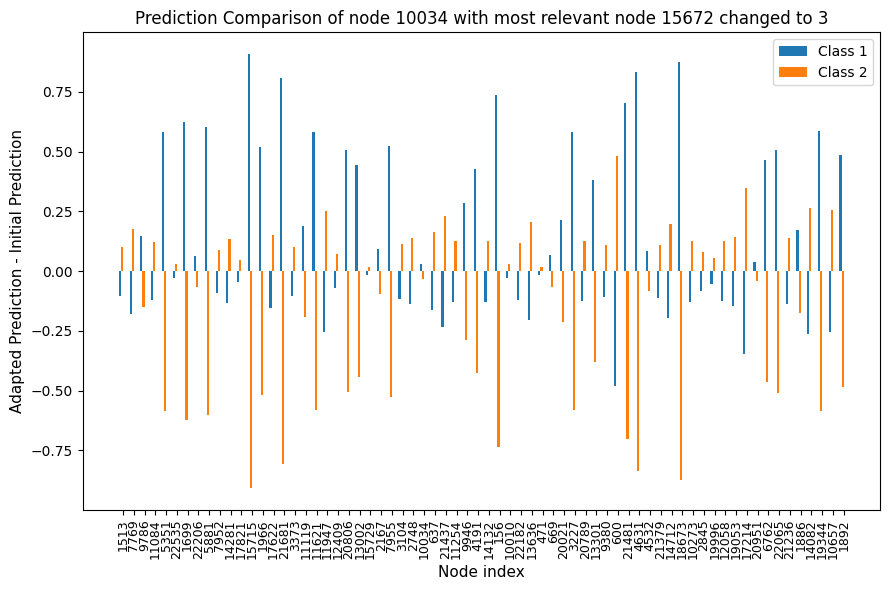

1
pred_after10034adapt_3398_1.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.39332297]
 [0.872979   0.

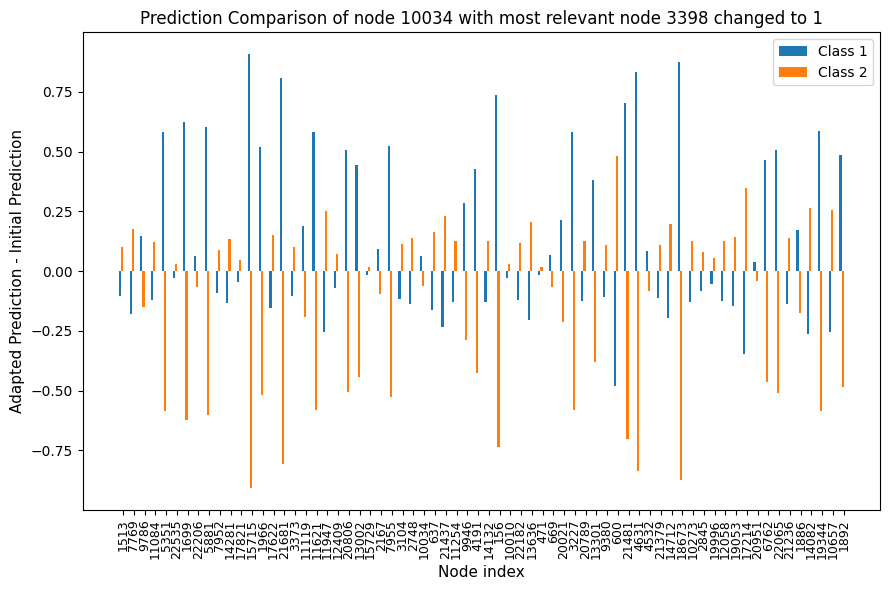

2
pred_after15729adapt_13859_6.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.39332297]
 [0.872979   0

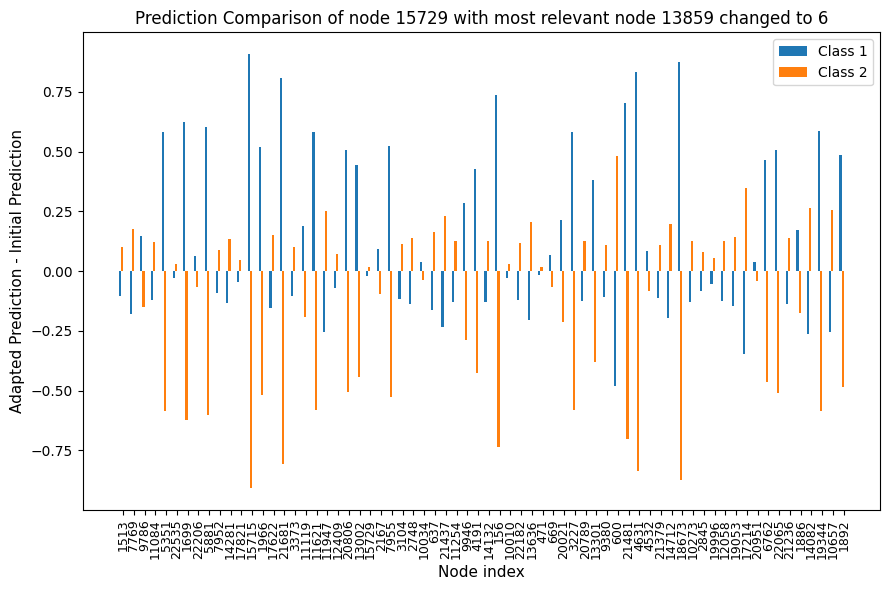

3
pred_after15729adapt_22188_1.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.39332297]
 [0.872979   0

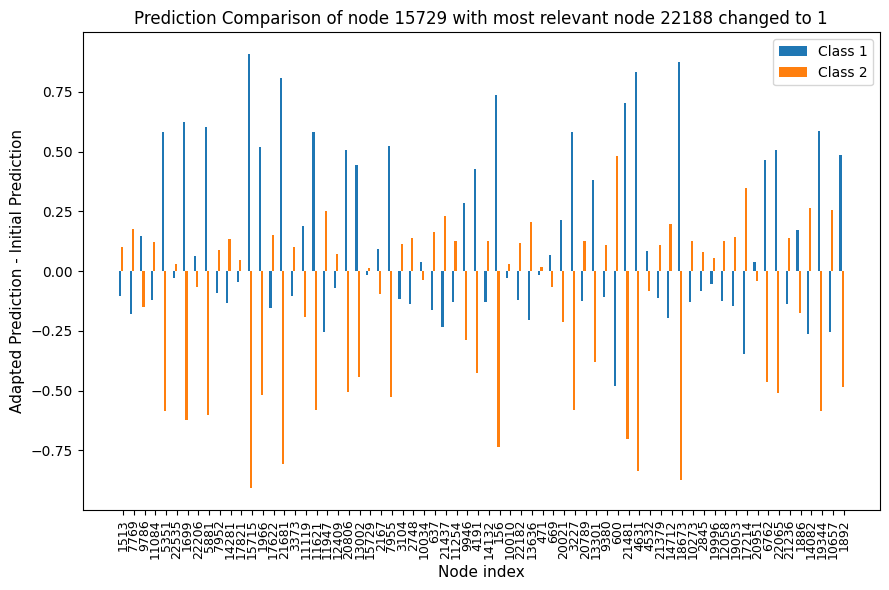

4
pred_after1886adapt_tensor([    0, 10219])_6.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.39332297

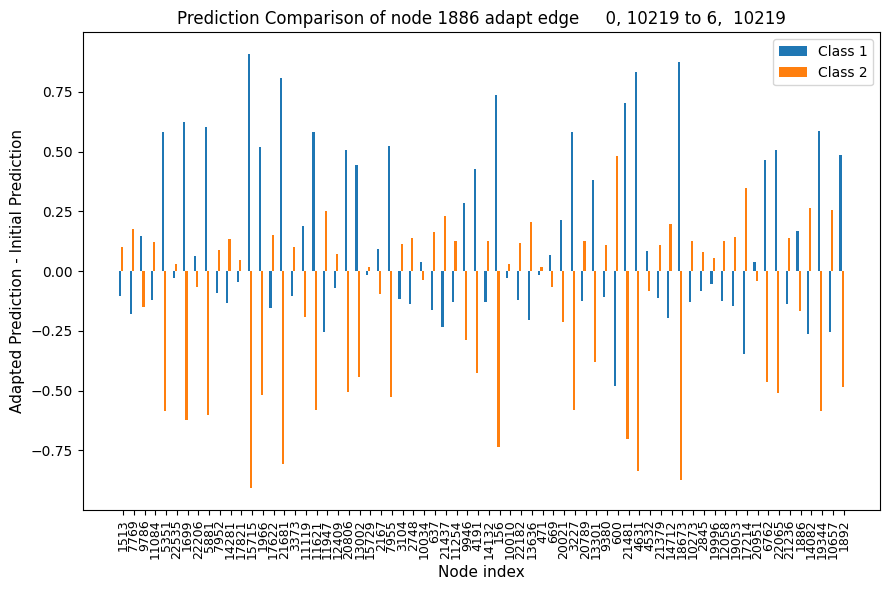

5
pred_after1886adapt_tensor([    6, 10219])_4.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.39332297

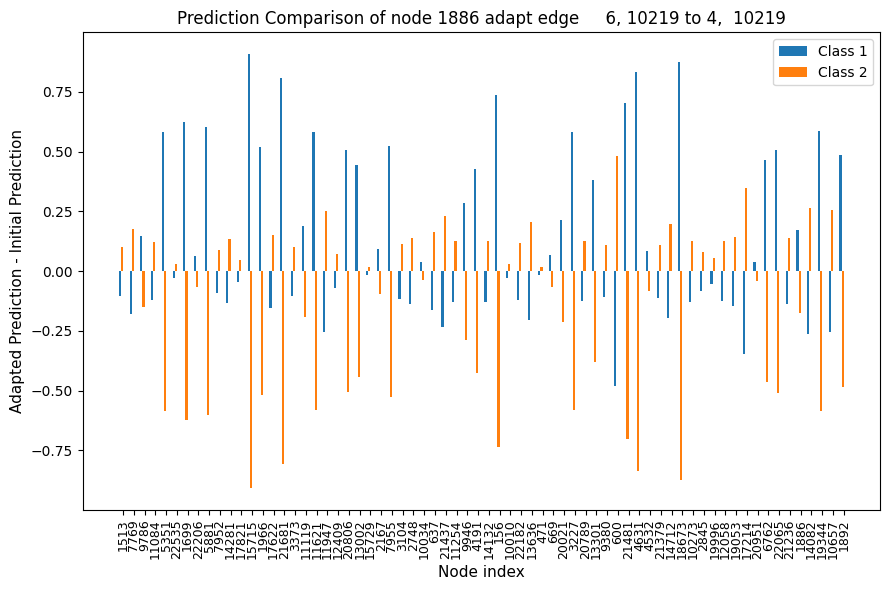

6
pred_after20789adapt_tensor([    0, 14937])_2.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.3933229

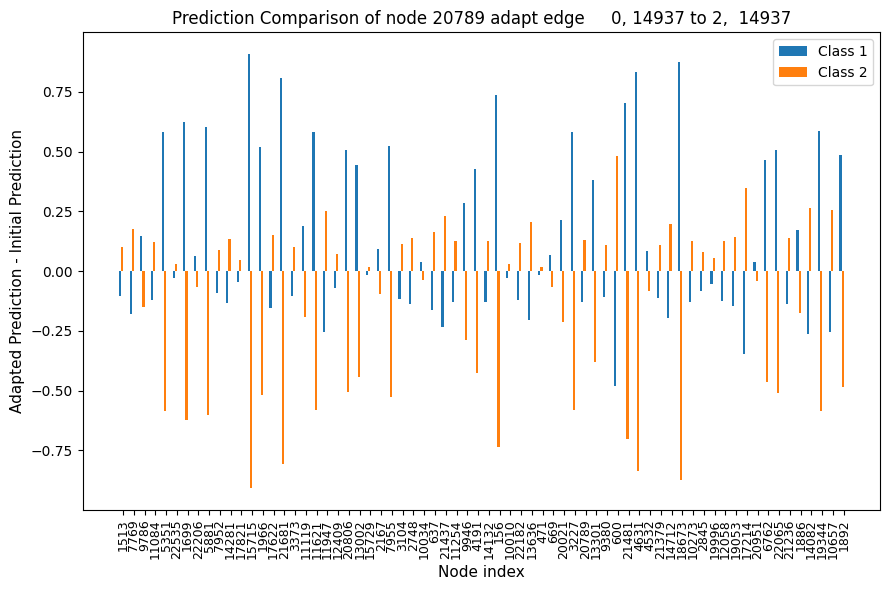

7
pred_after20789adapt_tensor([    1, 14937])_6.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.3933229

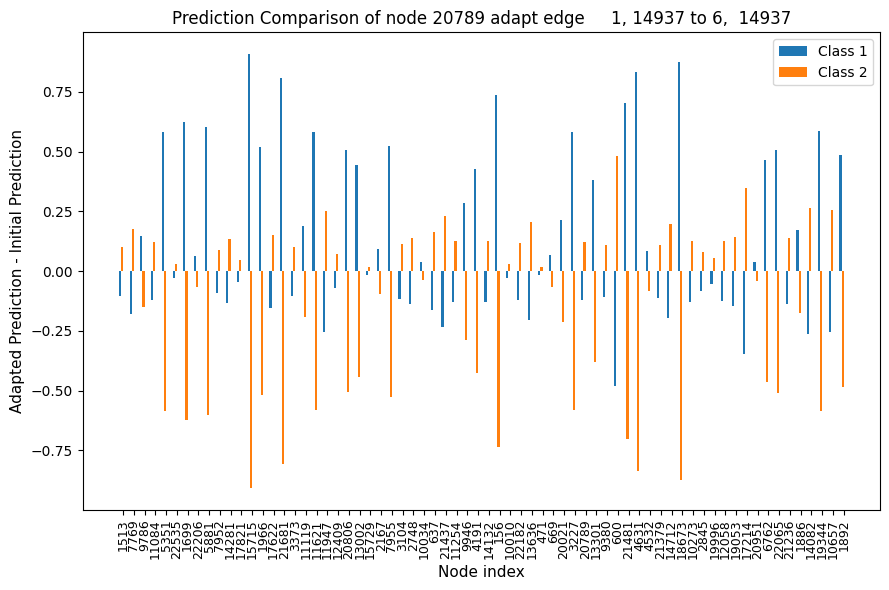

8
pred_after22182adapt_6656_5.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.39332297]
 [0.872979   0.

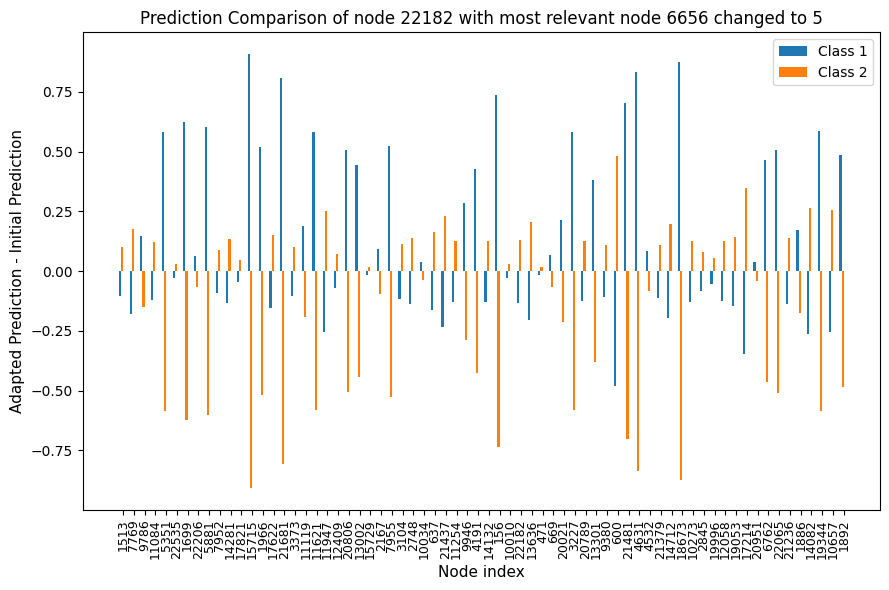

9
pred_after22182adapt_9863_2.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.39332297]
 [0.872979   0.

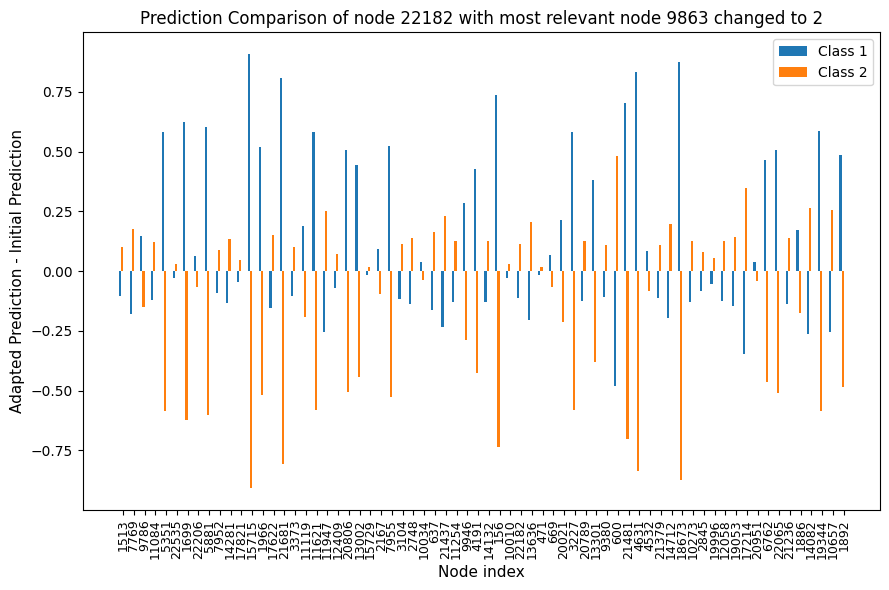

10
pred_after22182adapt_tensor([   0, 9863])_3.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.39332297

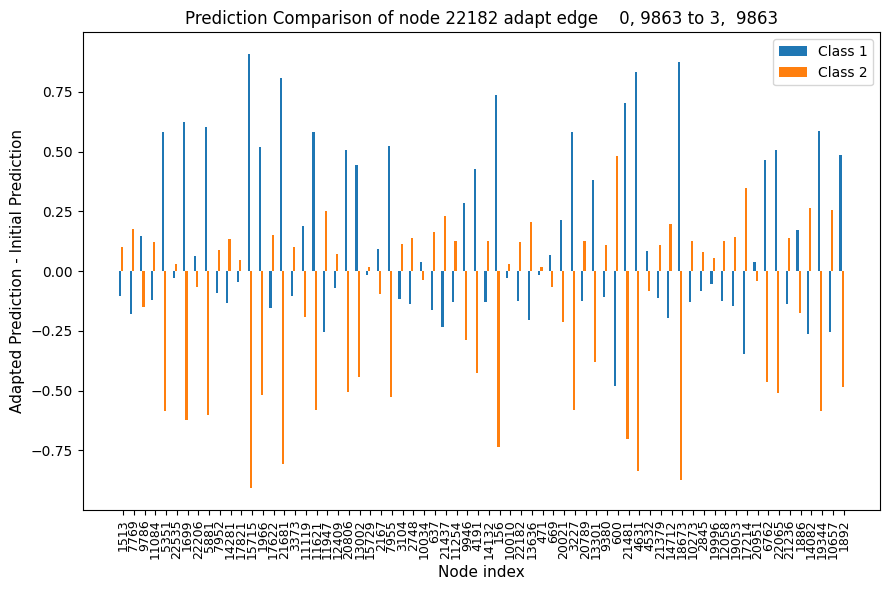

11
pred_after22182adapt_tensor([   1, 9863])_4.pt
Prediction Score before:  [[0.20313028 0.79686975]
 [0.30499482 0.6950052 ]
 [0.11827082 0.8817291 ]
 [0.03039441 0.9696056 ]
 [0.02244121 0.9775588 ]
 [0.00923452 0.99076545]
 [0.03662709 0.9633729 ]
 [0.42718014 0.5728198 ]
 [0.35636932 0.6436306 ]
 [0.39123607 0.60876393]
 [0.41364413 0.5863559 ]
 [0.11767894 0.8823211 ]
 [0.13220498 0.867795  ]
 [0.02525749 0.97474253]
 [0.49108228 0.50891775]
 [0.96121114 0.03878886]
 [0.17094827 0.82905173]
 [0.05469827 0.9453018 ]
 [0.01442665 0.98557335]
 [0.2912553  0.70874476]
 [0.21451846 0.7854815 ]
 [0.37832513 0.62167484]] Prediction Score after:  [[0.78728485 0.21271521]
 [0.92837363 0.07162632]
 [0.72103786 0.2789621 ]
 [0.9386582  0.0613418 ]
 [0.54078454 0.4592154 ]
 [0.8157041  0.18429592]
 [0.6185285  0.38147154]
 [0.9323454  0.06765465]
 [0.8009702  0.19902985]
 [0.9168891  0.08311089]
 [0.70012885 0.29987118]
 [0.5445856  0.45541444]
 [0.86896956 0.13103046]
 [0.606677   0.39332297

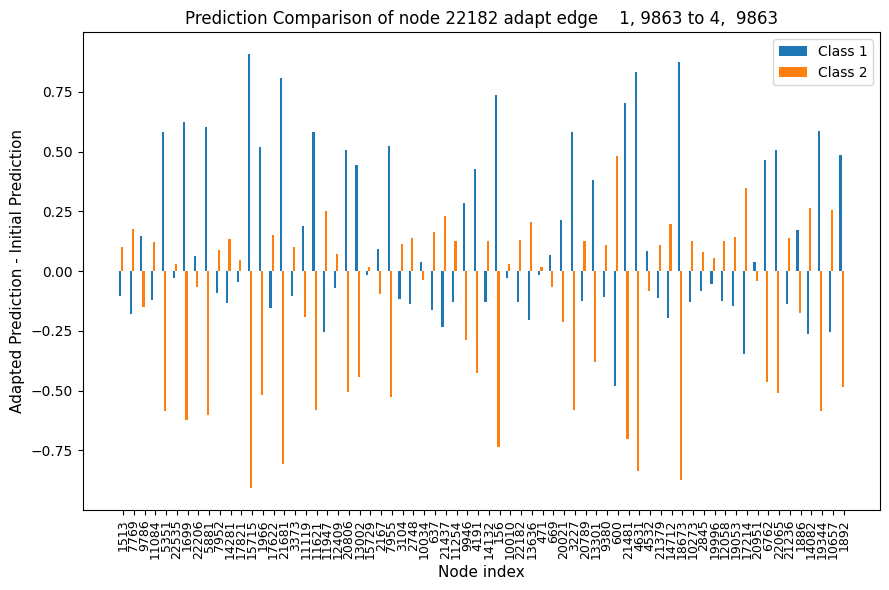

In [42]:
path = 'out/MUTAG/RGAT_emb/'+model+'/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(68)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    #plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    #plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=9)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=11)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()

#### Edges

relevances_after_edge_edge_1886_10219adapt_tensor([    0, 10219])_6.pt 1886  10219 relevances_edge_1886.pt
[[-3.07023674e-02  5.78343048e+01  1.32000000e+02  0.00000000e+00]
 [-3.96533795e-02  4.97651219e-01  1.51000000e+02  0.00000000e+00]
 [-2.81952709e-01 -1.23353939e+01  4.48000000e+02  0.00000000e+00]
 ...
 [-9.02451128e-02 -7.24528170e+00  2.20200000e+04  8.00000000e+00]
 [ 1.44089619e-02 -2.27318645e+00  2.21270000e+04  8.00000000e+00]
 [ 1.16231725e-01 -4.55058098e-01  2.25180000e+04  8.00000000e+00]]
-0.02738168794894591
66340.97014808655 -38232.935654878616
non : 1


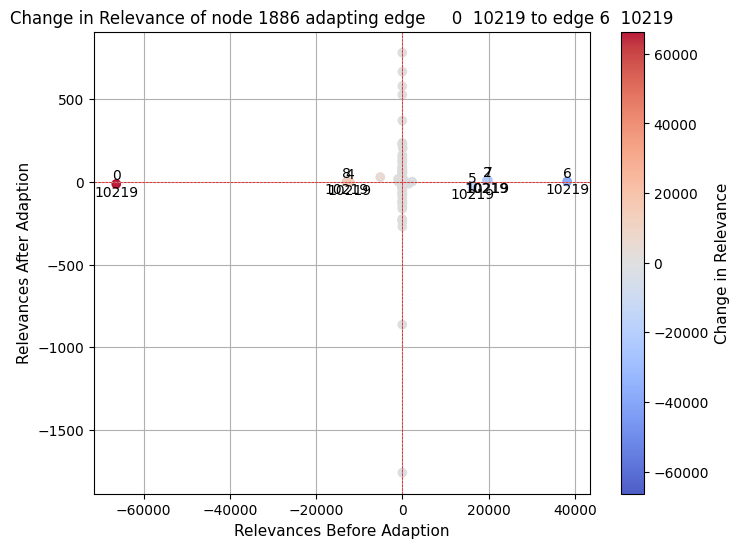

relevances_after_edge_edge_1886_10219adapt_tensor([    6, 10219])_4.pt 1886  10219 relevances_edge_1886.pt
[[-2.97959335e-02  5.78343048e+01  1.32000000e+02  0.00000000e+00]
 [-3.87044027e-02  4.97651219e-01  1.51000000e+02  0.00000000e+00]
 [-2.73519307e-01 -1.23353939e+01  4.48000000e+02  0.00000000e+00]
 ...
 [-8.75509679e-02 -7.24528170e+00  2.20200000e+04  8.00000000e+00]
 [ 1.41464090e-02 -2.27318645e+00  2.21270000e+04  8.00000000e+00]
 [ 1.12810776e-01 -4.55058098e-01  2.25180000e+04  8.00000000e+00]]
-0.027812899585114792
66373.40281105042 -38233.88918244839
non : 1


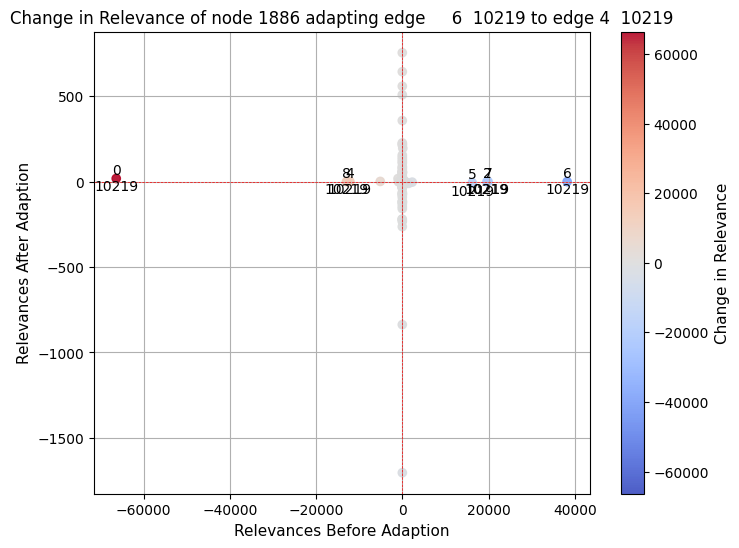

relevances_after_edge_edge_20789_14937adapt_tensor([    0, 14937])_2.pt 20789  14937 relevances_edge_20789.pt
[[-2.49607936e-02  3.85485792e+00  1.32000000e+02  0.00000000e+00]
 [-6.48647726e-01  6.60435736e-01  2.06000000e+02  0.00000000e+00]
 [ 3.18655595e-02  1.84883177e-02  9.14000000e+02  0.00000000e+00]
 ...
 [ 7.93848857e-02 -8.37941095e-02  2.16860000e+04  8.00000000e+00]
 [ 1.98990218e-02  6.46863282e-02  2.19910000e+04  8.00000000e+00]
 [ 7.52346814e-02 -9.05732572e-01  2.23640000e+04  8.00000000e+00]]
-0.004569619632093236
35858.57065228745 -17627.61666582711
non : 1


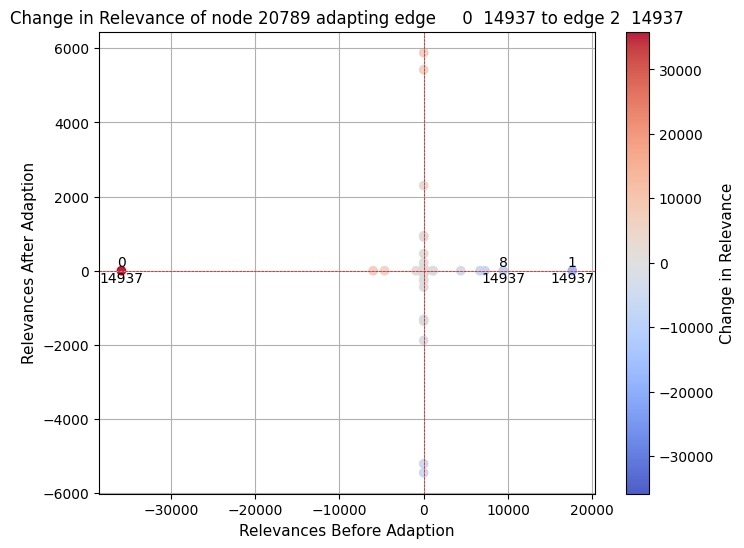

relevances_after_edge_edge_20789_14937adapt_tensor([    1, 14937])_6.pt 20789  14937 relevances_edge_20789.pt
[[-2.40971521e-02  3.85485792e+00  1.32000000e+02  0.00000000e+00]
 [-6.13830626e-01  6.60435736e-01  2.06000000e+02  0.00000000e+00]
 [ 3.11155021e-02  1.84883177e-02  9.14000000e+02  0.00000000e+00]
 ...
 [ 2.09749594e-01 -8.37941095e-02  2.16860000e+04  8.00000000e+00]
 [ 1.92104951e-02  6.46863282e-02  2.19910000e+04  8.00000000e+00]
 [ 7.26856291e-02 -9.05732572e-01  2.23640000e+04  8.00000000e+00]]
0.00043794483644887805
35858.8291079998 -17627.73165859282
non : 1


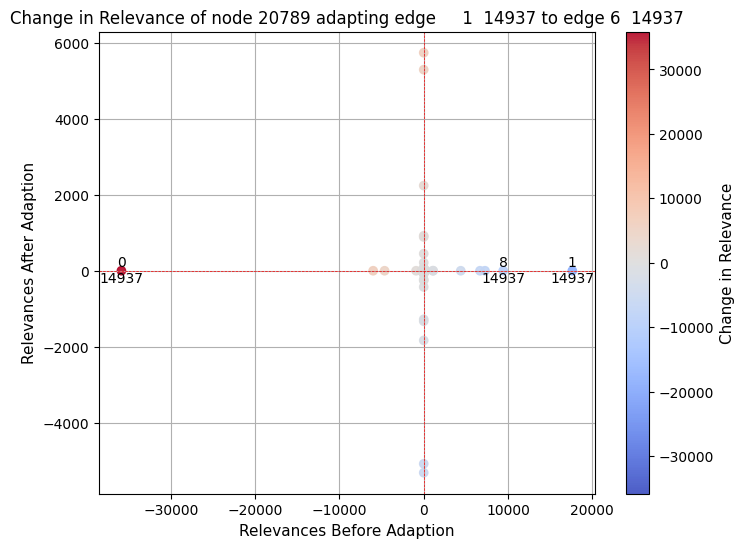

relevances_after_edge_edge_22182_9863adapt_tensor([   0, 9863])_3.pt 22182  9863 relevances_edge_22182.pt
[[ 1.81137228e+00  4.90343012e-02  7.10000000e+01  0.00000000e+00]
 [-1.98016707e-02  2.82119560e+00  1.32000000e+02  0.00000000e+00]
 [-1.68130189e-01  2.55266368e-01  3.01000000e+02  0.00000000e+00]
 ...
 [-3.94950844e-02  3.42113316e-01  2.21820000e+04  8.00000000e+00]
 [-2.75212860e+00  3.23915668e-02  2.23220000e+04  8.00000000e+00]
 [-1.50539982e+00 -4.49388027e-01  2.24190000e+04  8.00000000e+00]]
0.003943268515286036
22779.019777201116 -20030.577922921628
non : 1


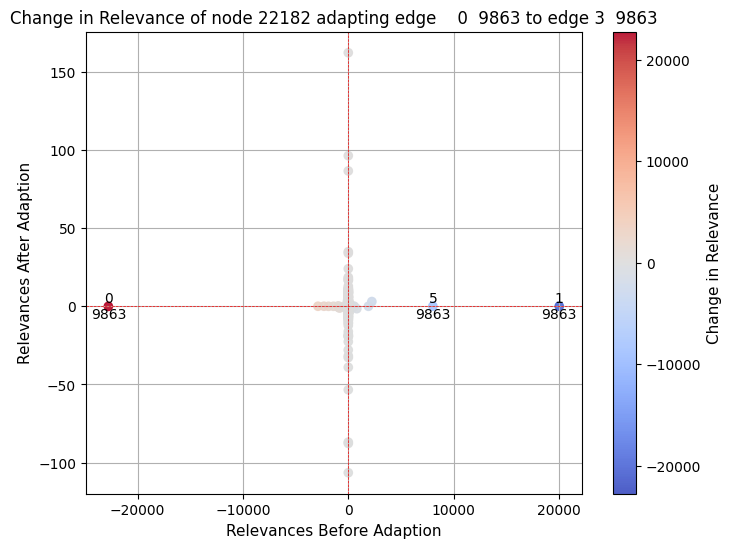

relevances_after_edge_edge_22182_9863adapt_tensor([   1, 9863])_4.pt 22182  9863 relevances_edge_22182.pt
[[ 1.91658401e+00  4.90343012e-02  7.10000000e+01  0.00000000e+00]
 [-2.02505924e-02  2.82119560e+00  1.32000000e+02  0.00000000e+00]
 [-1.61738783e-01  2.55266368e-01  3.01000000e+02  0.00000000e+00]
 ...
 [-4.01063226e-02  3.42113316e-01  2.21820000e+04  8.00000000e+00]
 [-2.91335487e+00  3.23915668e-02  2.23220000e+04  8.00000000e+00]
 [-1.93565011e+00 -4.49388027e-01  2.24190000e+04  8.00000000e+00]]
0.0038188706967048347
22778.266914963722 -20030.4715962708
non : 1


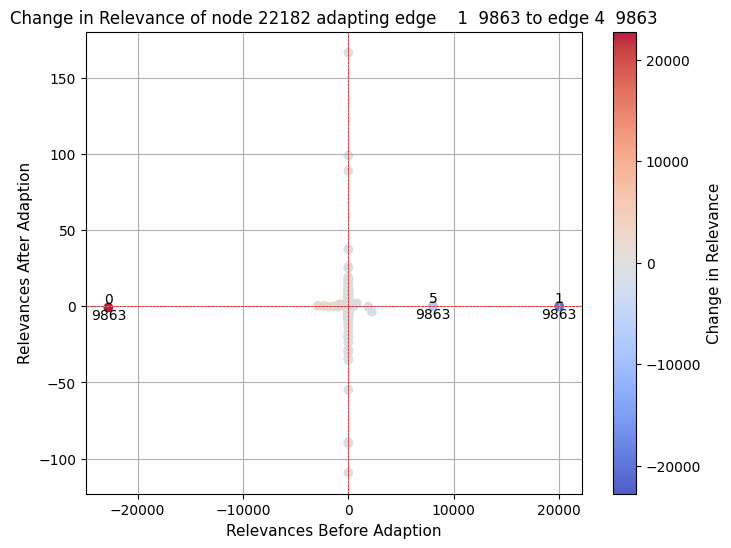

In [44]:
path = 'out/MUTAG/RGAT_emb/'+model+'/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_edge_edge_")]
rel_before = [file for file in fil if file.startswith("relevances_edge_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('edge_edge_')[1].split('_')[0]
    adapt_edge_name = rel.split('[')[1].split(',')[0]
    to_edge = rel.split('_')[-1].split('.')[0]
    adapt_node = rel.split(',')[-1].split(']')[0]
    XX,YY = np.meshgrid(np.arange(ra.shape[1]),np.arange(ra.shape[0]))
    
    for rel2 in rel_before:
        

         if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            table = np.vstack((ra.ravel(),rb.ravel(),XX.ravel(),YY.ravel())).T
            table = table[table[:,0] != 0]
            print(table)
            #nonzero_indices =  np.where((ra <= -0.05) | (ra >= 0.05) )
            change = table[:,0] - table[:,1]
            print(change.sum())
            if change.sum() == 0:
                continue
            print(change.max(), change.min())
            # Set a threshold for significant change
            threshold = 8000

            # Filter out points with insignificant change
            nonzero_indices = np.where(np.abs(change) > threshold)
            print('non :',len(nonzero_indices))
            #nonzero_indices = np.where((change<= -0.00001))#|(change>= 0.000001))
            plt.figure(figsize=(8, 6))
            if change[nonzero_indices].sum() == 0:
                continue
            max_abs_change = np.max(np.abs(change[nonzero_indices]))
            scatter = plt.scatter(
                table[:,1],
                table[:,0],
                c=change,
                cmap='coolwarm',
                alpha=0.9,
                norm=Normalize(vmin=-max_abs_change, vmax=max_abs_change)
            )

            

            # Add index labels for each point
            for i, (idx1, idx2) in enumerate(zip(table[:,3][nonzero_indices], table[:,2][nonzero_indices])):
                label = f'{int(idx1)}\n{int(idx2)}'  # Combine the two indices into one label
                plt.text(table[:,1][nonzero_indices][i], table[:,0][nonzero_indices][i], label, fontsize=10, ha='center', va='center')



            # Set x-axis label
            plt.xlabel('Relevances Before Adaption', fontsize=11)

            # Set y-axis label
            plt.ylabel('Relevances After Adaption', fontsize=11)
            plt.title(('Change in Relevance of node {} adapting edge {} {} to edge {} {}'.format(node_name, adapt_edge_name, adapt_node, to_edge, adapt_node)))
            # Add a colorbar to indicate change
            cbar = plt.colorbar(scatter)
            cbar.set_label('Change in Relevance', fontsize=11)

            # Set plot limits and add grid
            # plt.xlim(-2, 4)
            # plt.ylim(-2, 4)
            plt.axhline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.axvline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.grid(True)

            # Show the plot
            plt.show()

relevances_node_10010.pt 10010  9863 relevances_edge_9946.pt


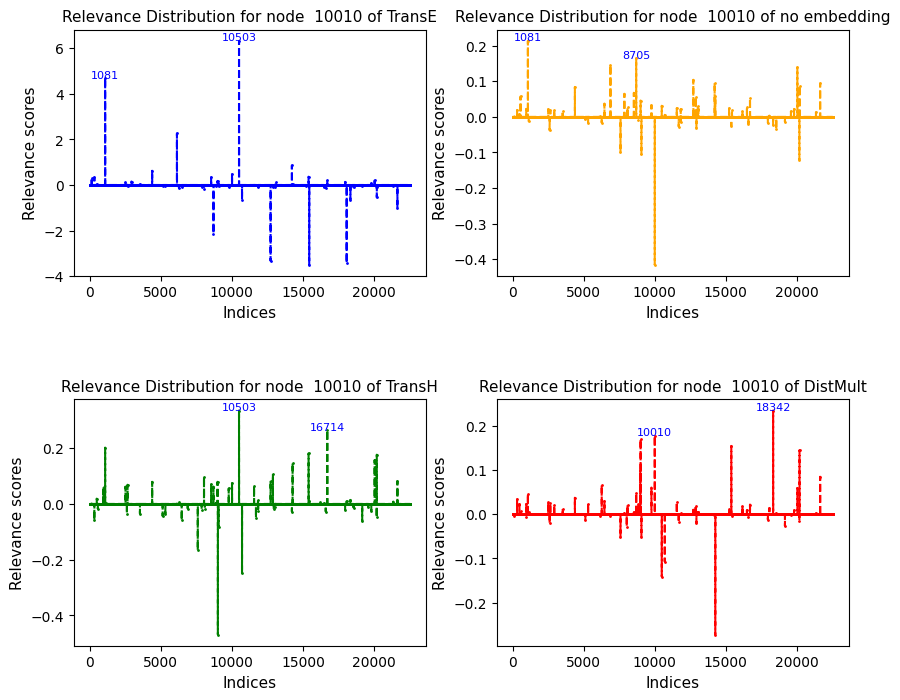

<Figure size 900x600 with 0 Axes>

relevances_node_10034.pt 10034  9863 relevances_edge_9946.pt


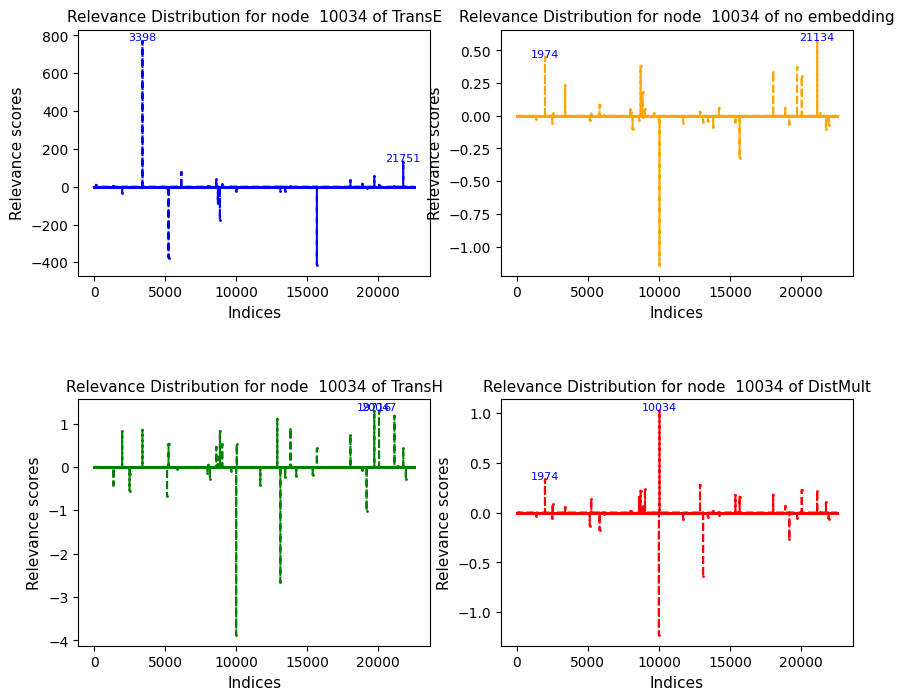

<Figure size 900x600 with 0 Axes>

relevances_node_10273.pt 10273  9863 relevances_edge_9946.pt


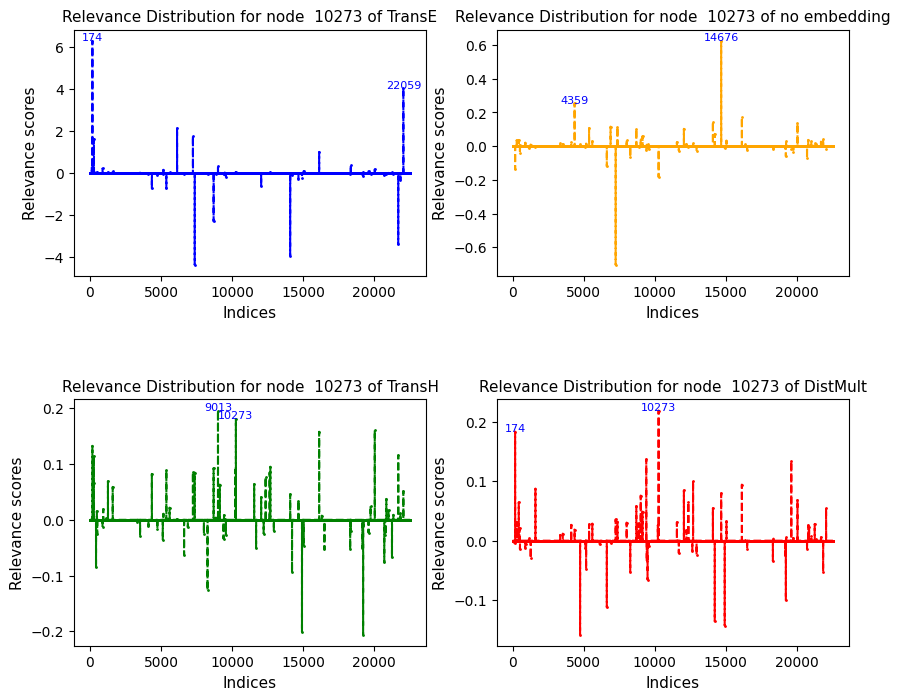

<Figure size 900x600 with 0 Axes>

relevances_node_10657.pt 10657  9863 relevances_edge_9946.pt


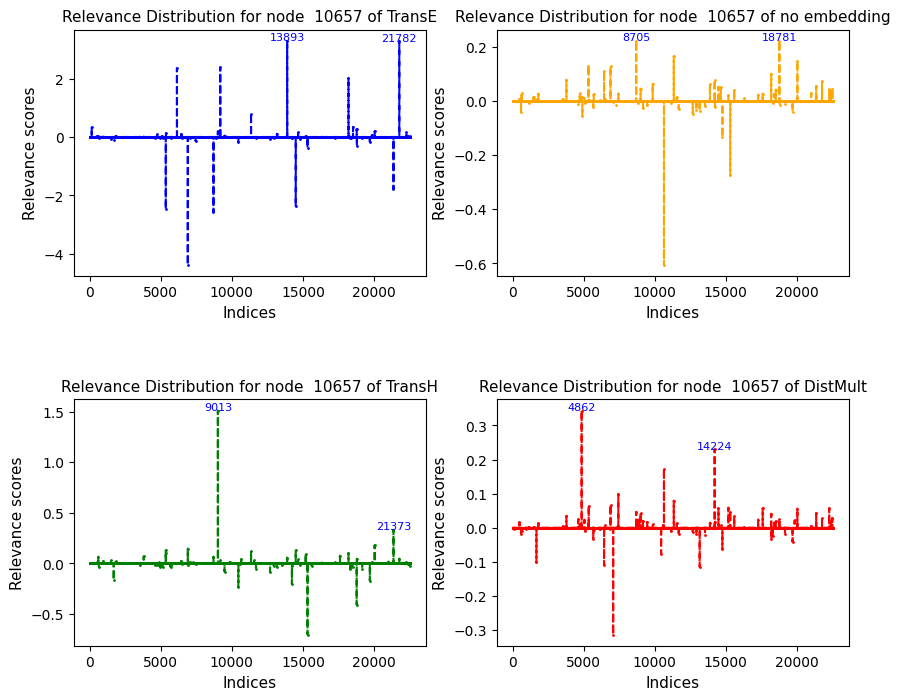

<Figure size 900x600 with 0 Axes>

relevances_node_11084.pt 11084  9863 relevances_edge_9946.pt


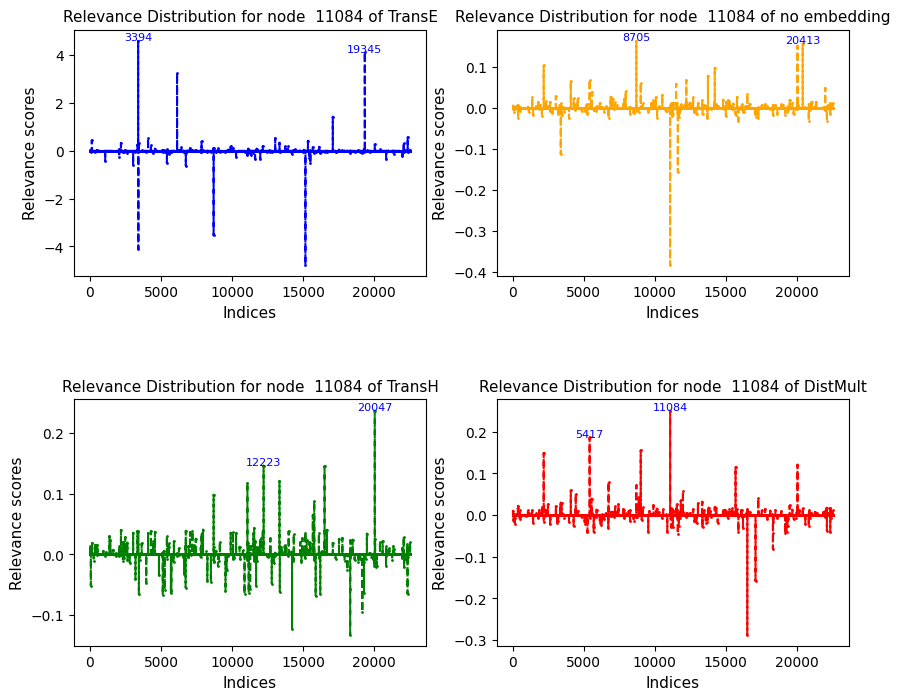

<Figure size 900x600 with 0 Axes>

relevances_node_11119.pt 11119  9863 relevances_edge_9946.pt


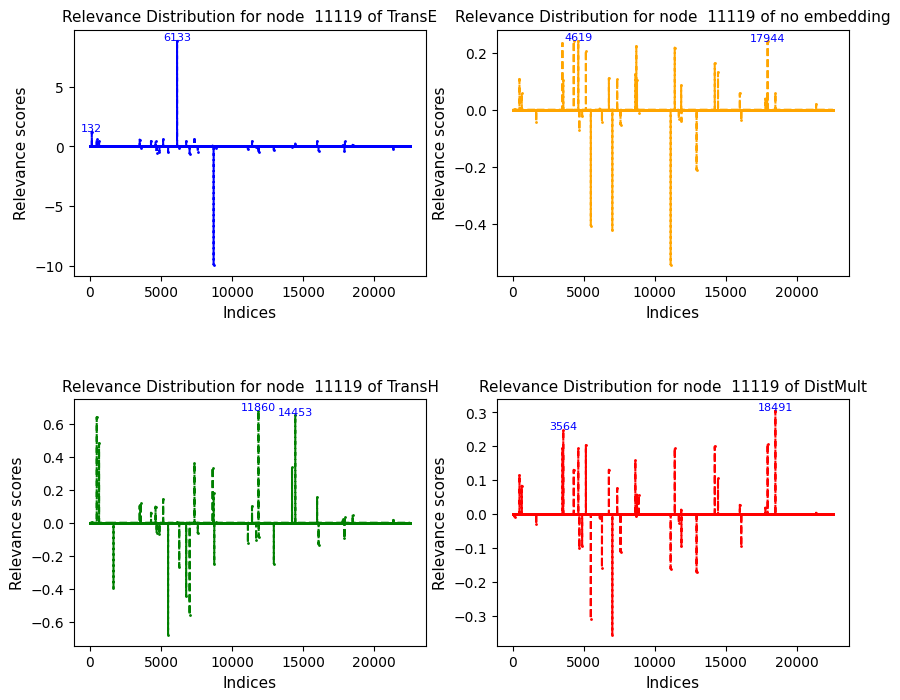

<Figure size 900x600 with 0 Axes>

relevances_node_11254.pt 11254  9863 relevances_edge_9946.pt


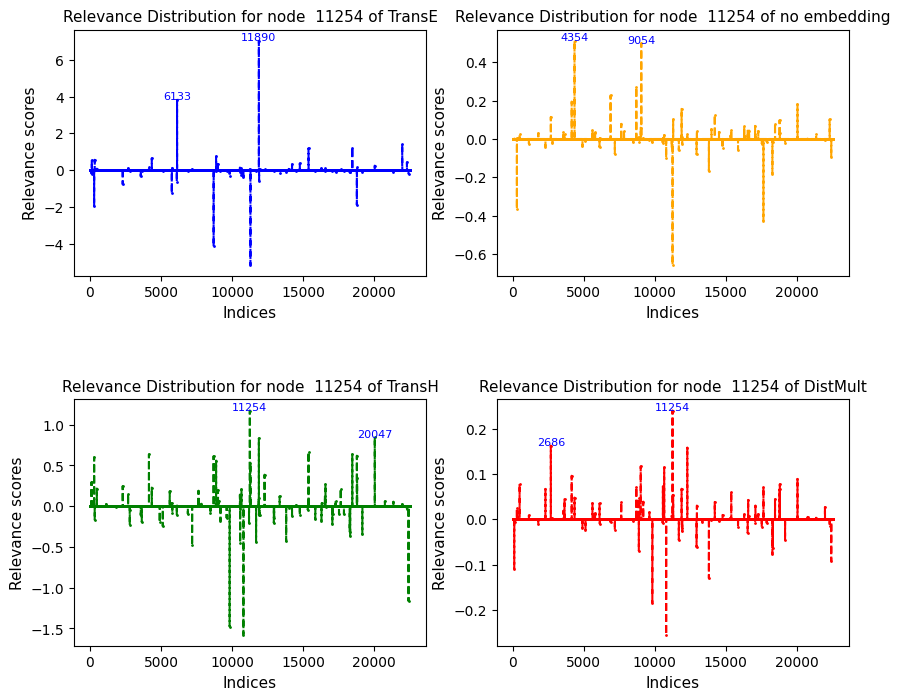

<Figure size 900x600 with 0 Axes>

relevances_node_11621.pt 11621  9863 relevances_edge_9946.pt


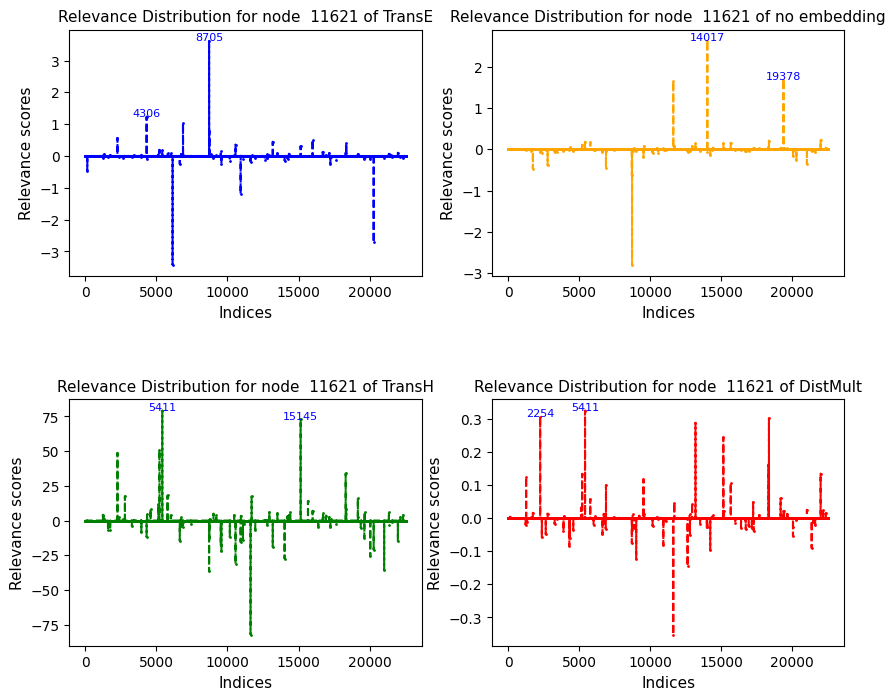

<Figure size 900x600 with 0 Axes>

relevances_node_11947.pt 11947  9863 relevances_edge_9946.pt


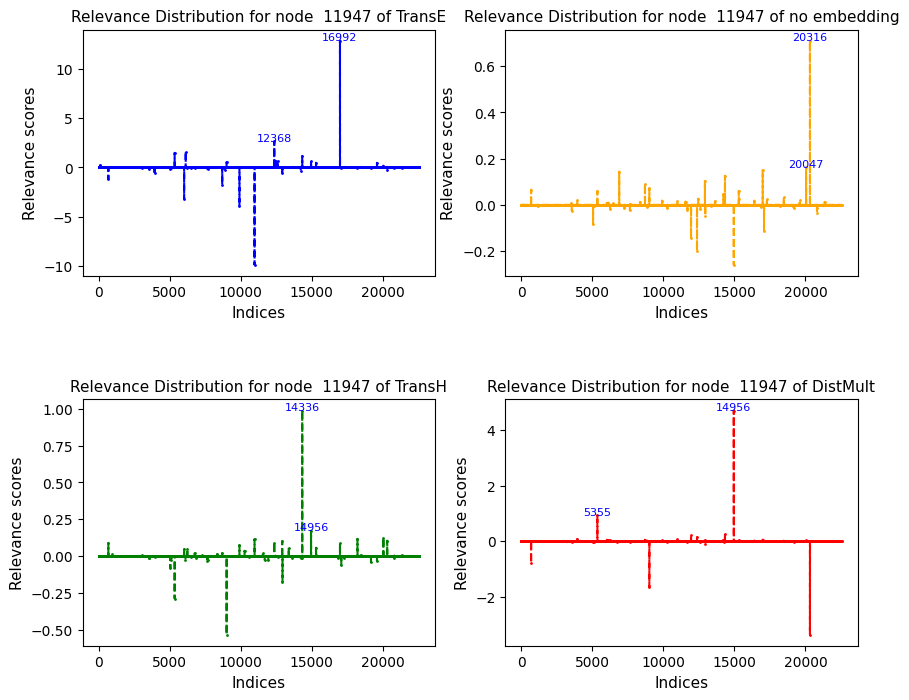

<Figure size 900x600 with 0 Axes>

relevances_node_12058.pt 12058  9863 relevances_edge_9946.pt


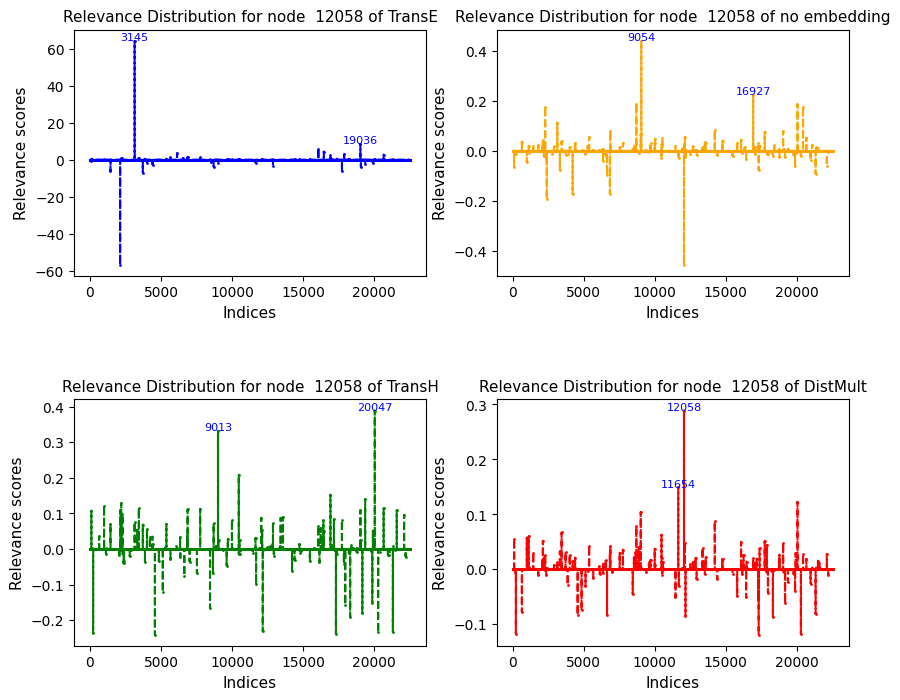

<Figure size 900x600 with 0 Axes>

relevances_node_12409.pt 12409  9863 relevances_edge_9946.pt


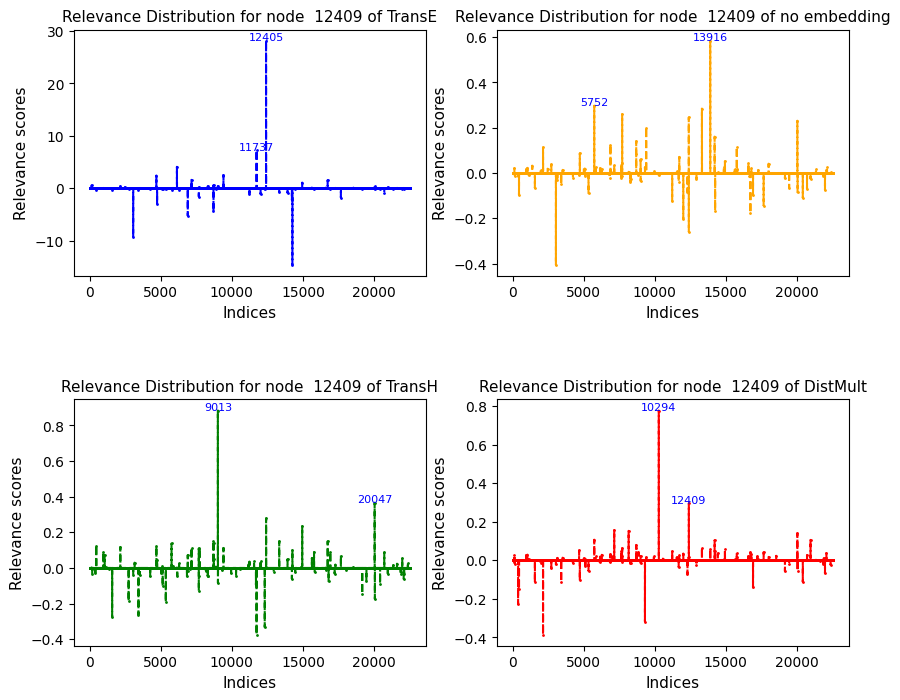

<Figure size 900x600 with 0 Axes>

relevances_node_13002.pt 13002  9863 relevances_edge_9946.pt


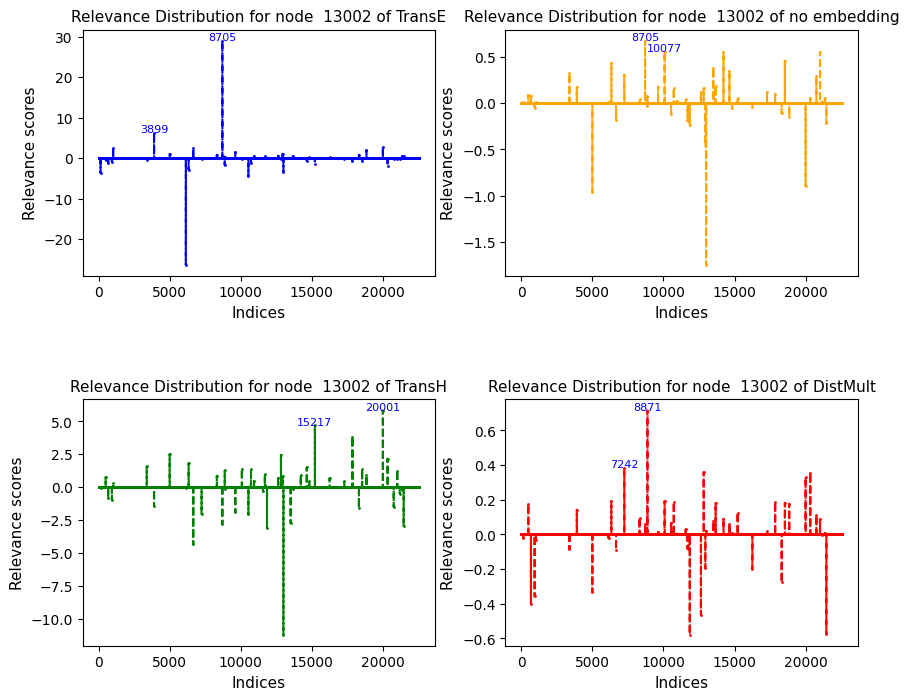

<Figure size 900x600 with 0 Axes>

relevances_node_13301.pt 13301  9863 relevances_edge_9946.pt


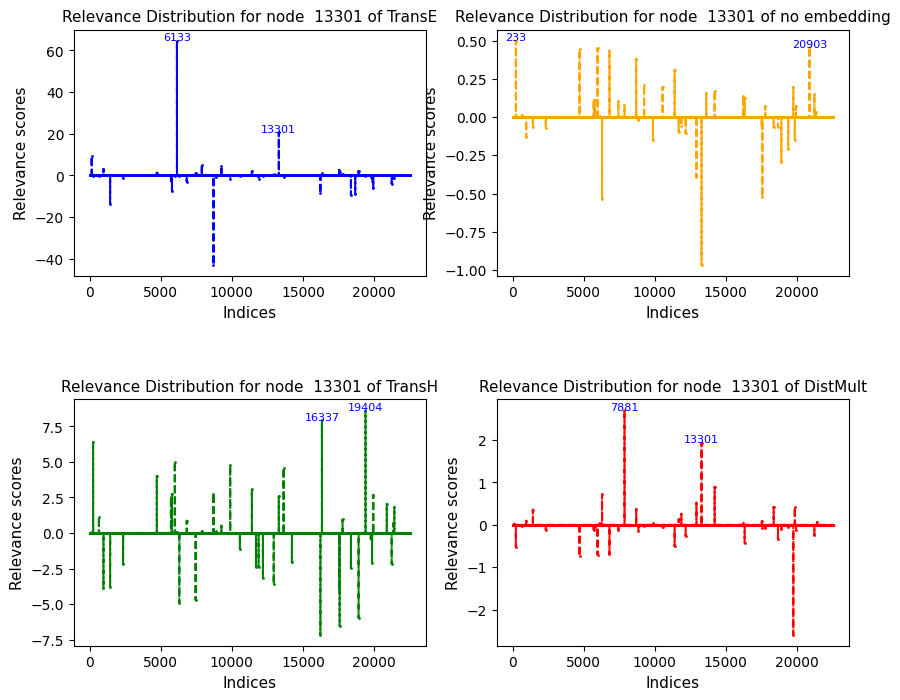

<Figure size 900x600 with 0 Axes>

relevances_node_13636.pt 13636  9863 relevances_edge_9946.pt


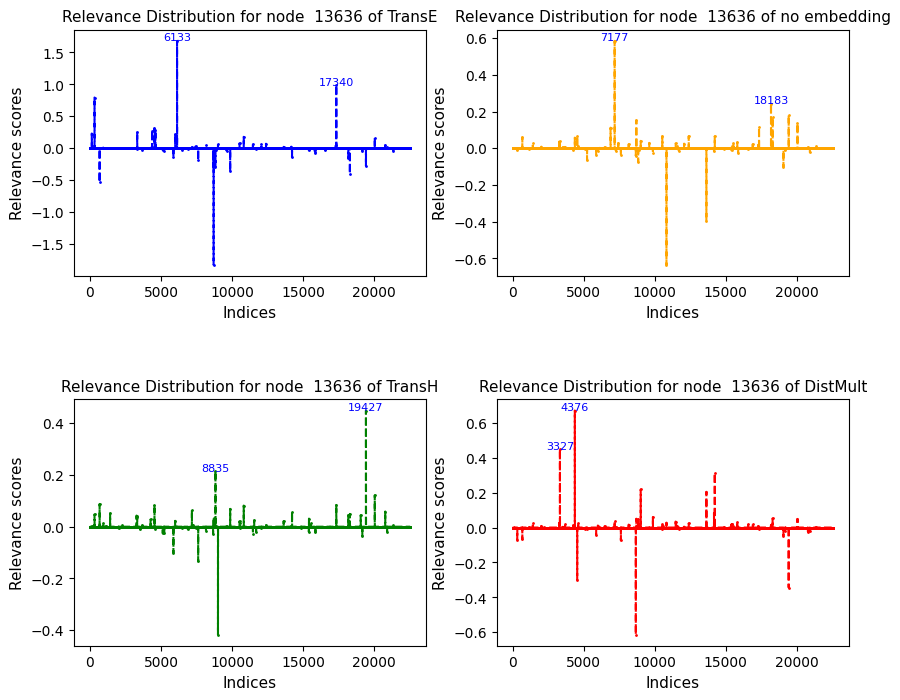

<Figure size 900x600 with 0 Axes>

relevances_node_14082.pt 14082  9863 relevances_edge_9946.pt


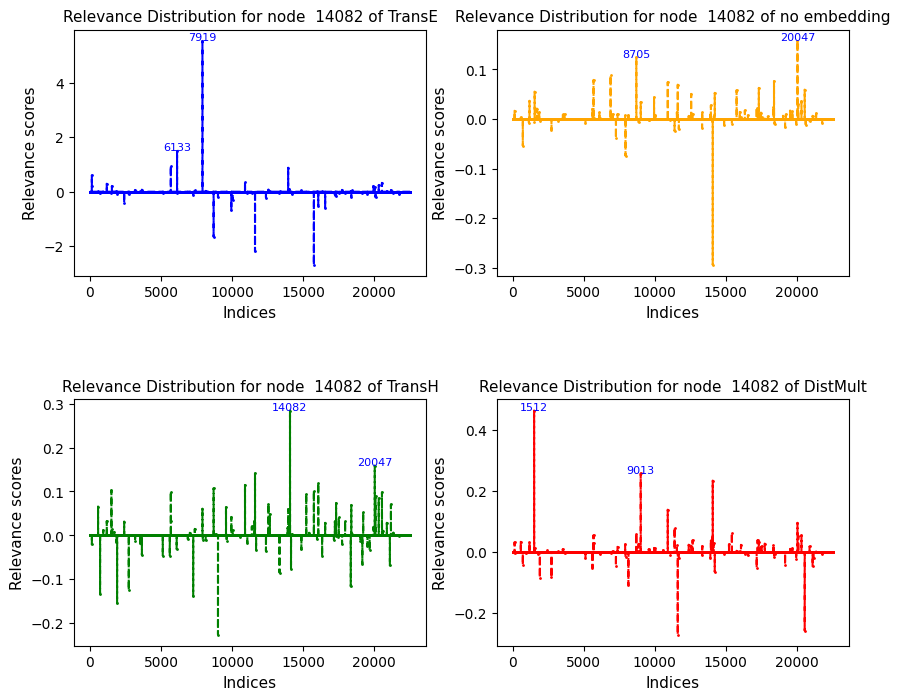

<Figure size 900x600 with 0 Axes>

relevances_node_14132.pt 14132  9863 relevances_edge_9946.pt


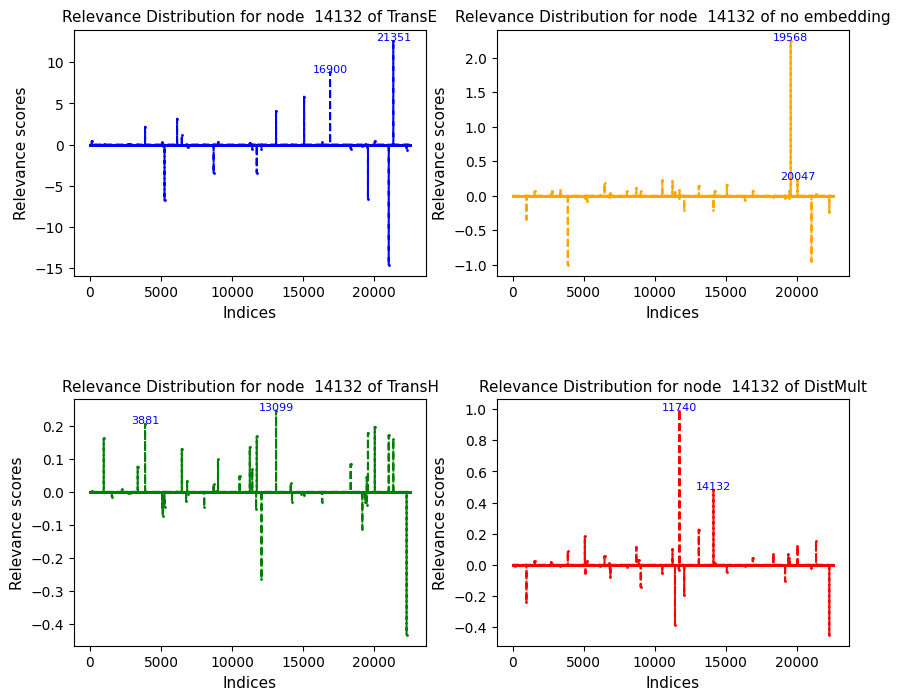

<Figure size 900x600 with 0 Axes>

relevances_node_14281.pt 14281  9863 relevances_edge_9946.pt


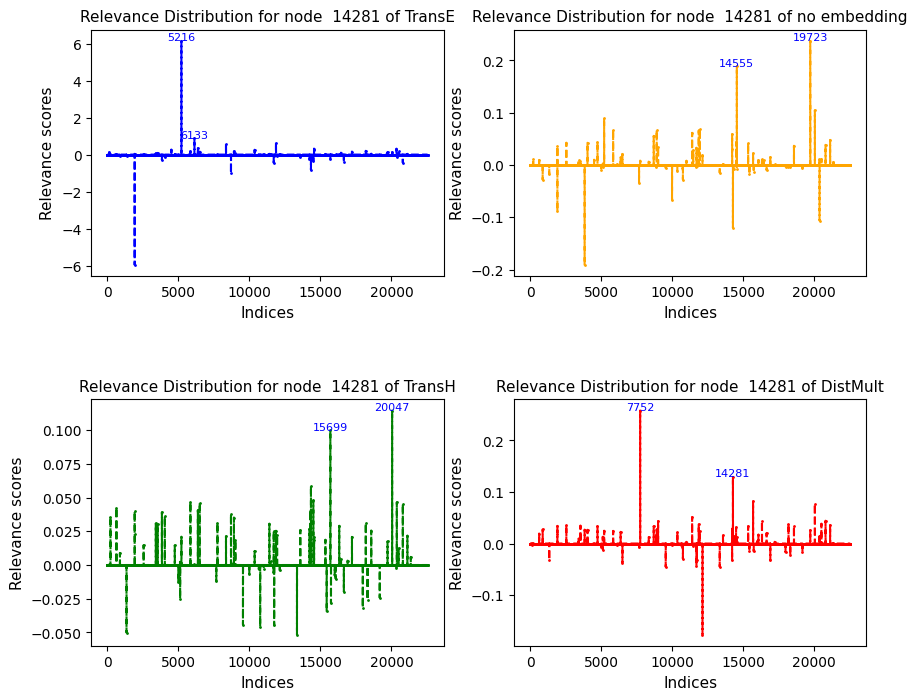

<Figure size 900x600 with 0 Axes>

relevances_node_14712.pt 14712  9863 relevances_edge_9946.pt


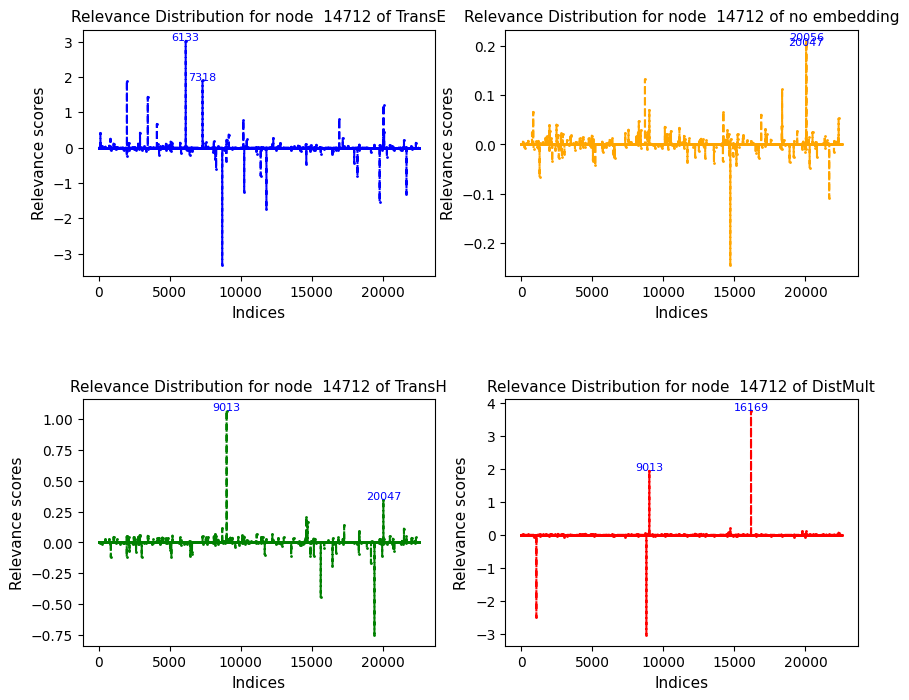

<Figure size 900x600 with 0 Axes>

relevances_node_1513.pt 1513  9863 relevances_edge_9946.pt


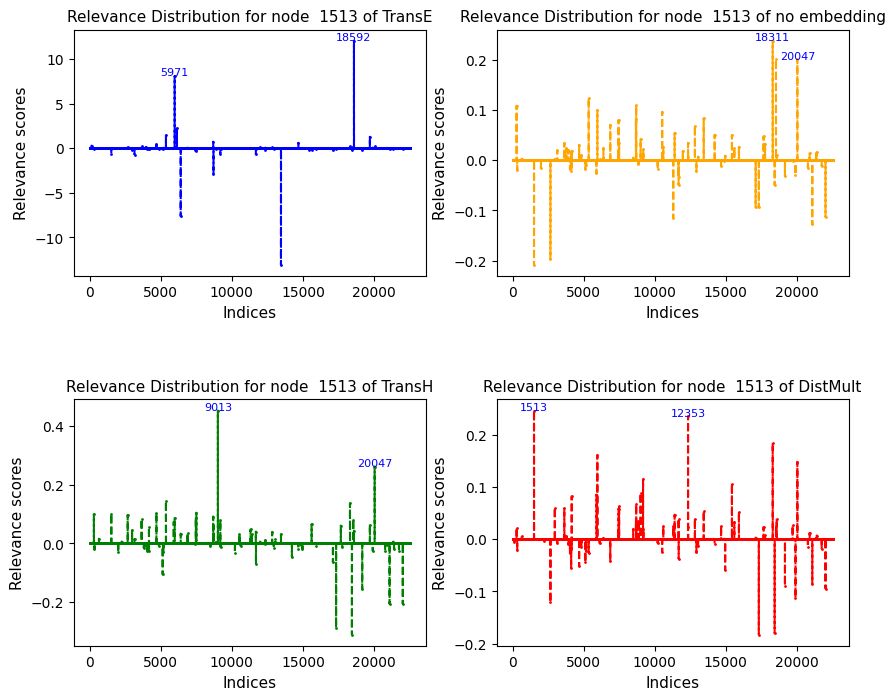

<Figure size 900x600 with 0 Axes>

relevances_node_156.pt 156  9863 relevances_edge_9946.pt


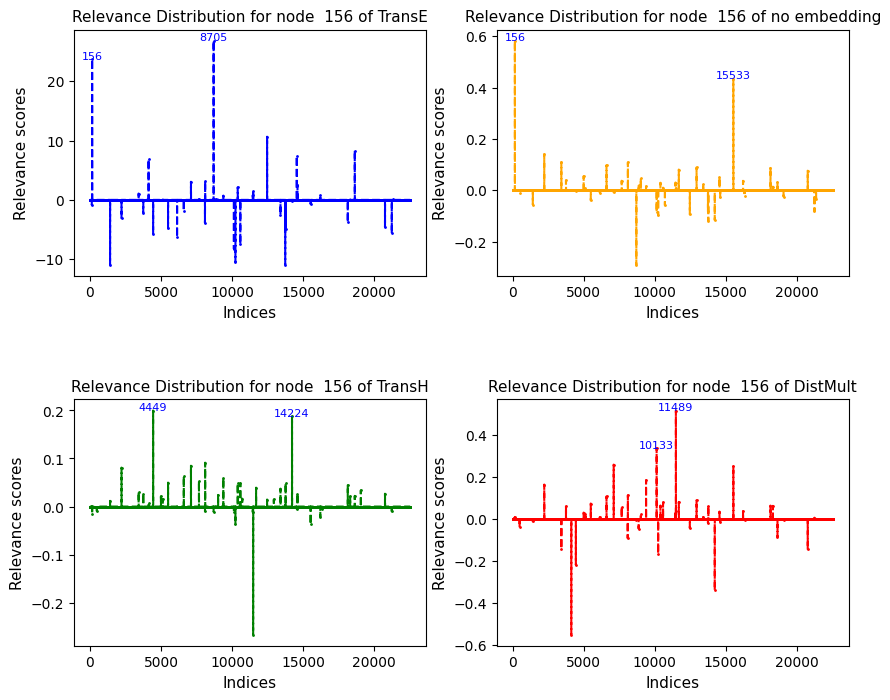

<Figure size 900x600 with 0 Axes>

relevances_node_15715.pt 15715  9863 relevances_edge_9946.pt


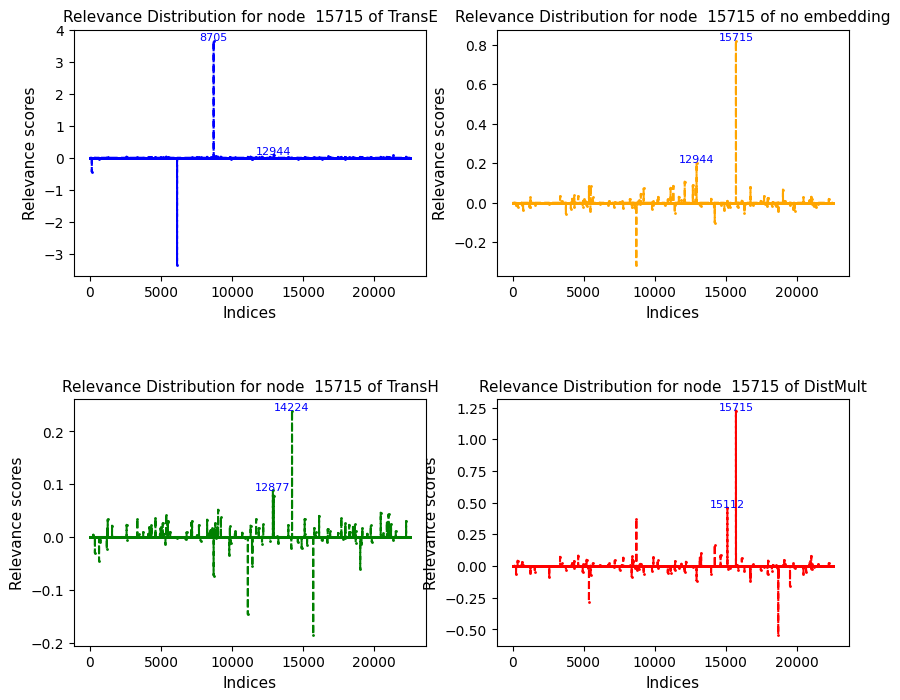

<Figure size 900x600 with 0 Axes>

relevances_node_15729.pt 15729  9863 relevances_edge_9946.pt


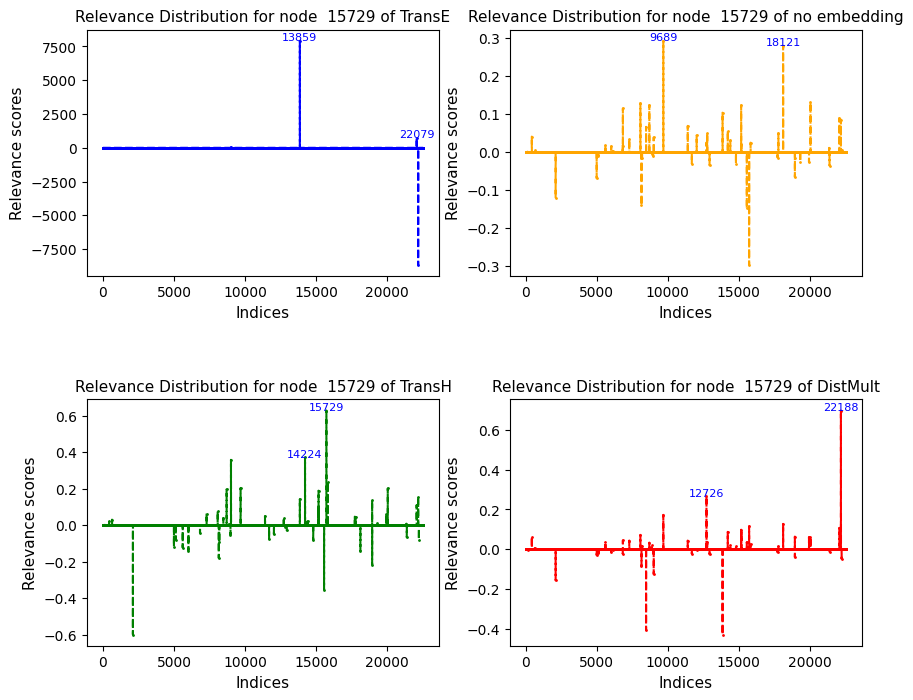

<Figure size 900x600 with 0 Axes>

relevances_node_1699.pt 1699  9863 relevances_edge_9946.pt


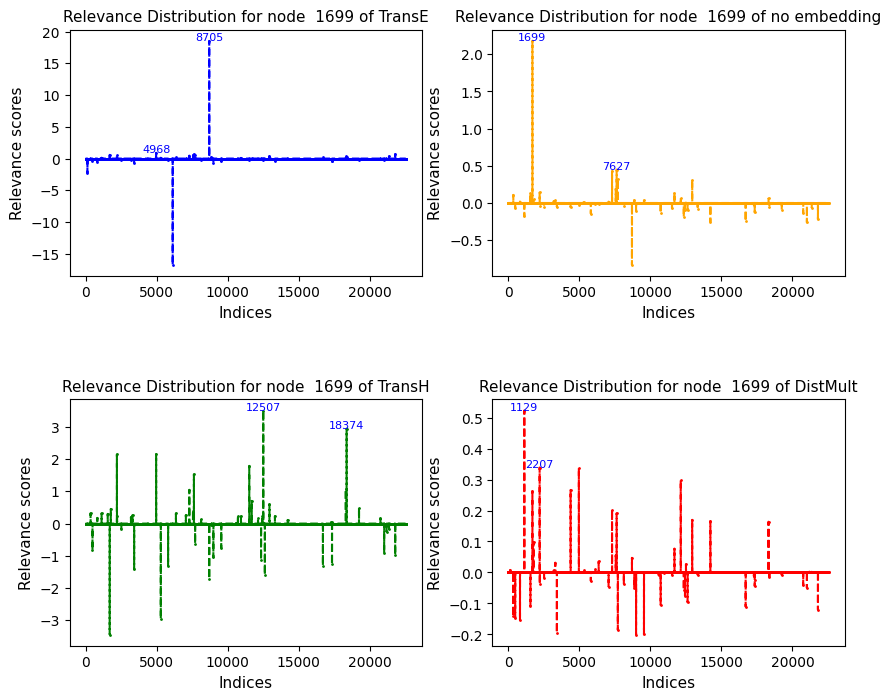

<Figure size 900x600 with 0 Axes>

relevances_node_17214.pt 17214  9863 relevances_edge_9946.pt


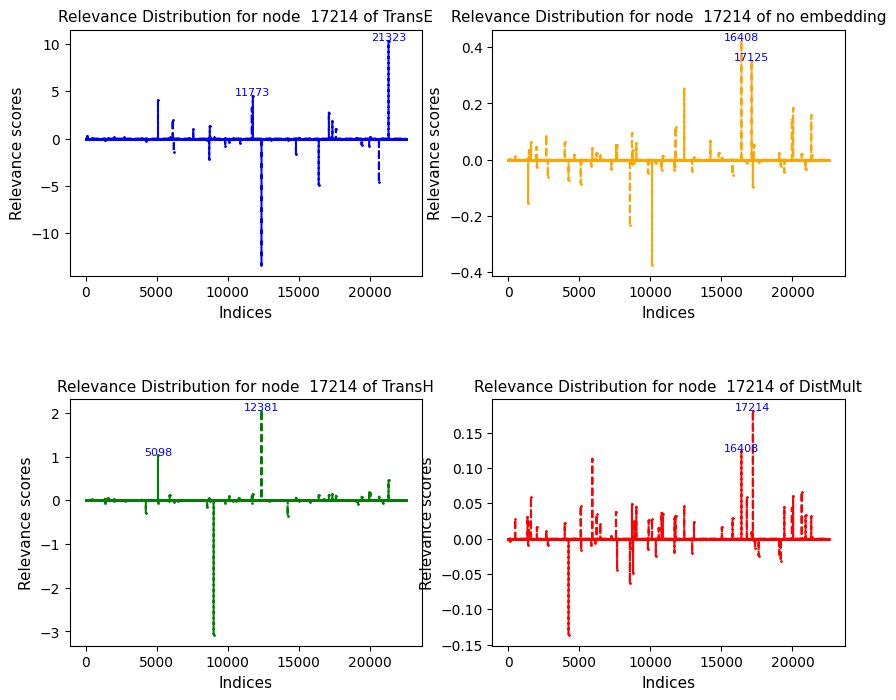

<Figure size 900x600 with 0 Axes>

relevances_node_17622.pt 17622  9863 relevances_edge_9946.pt


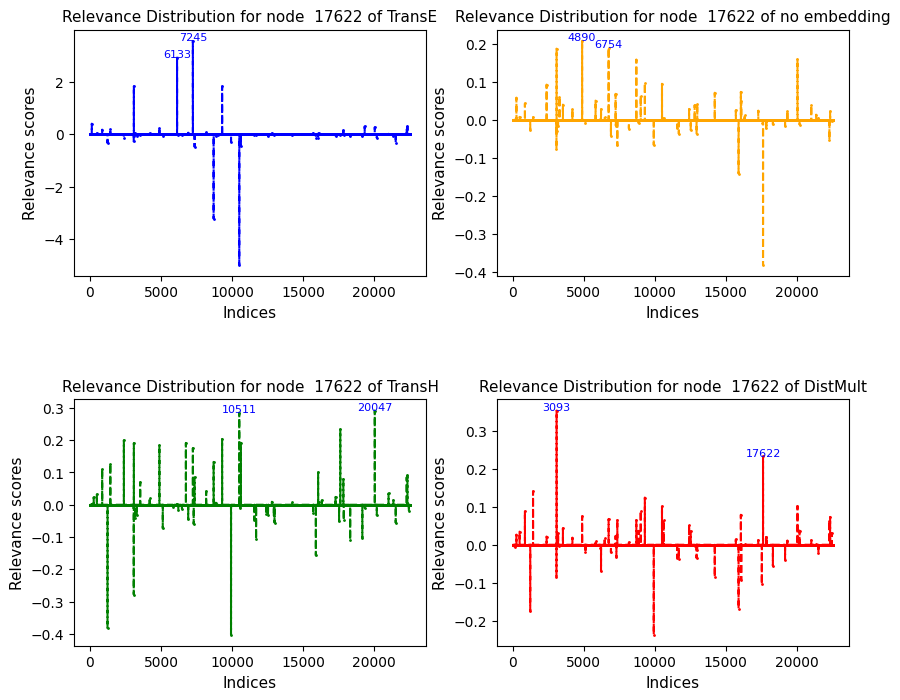

<Figure size 900x600 with 0 Axes>

relevances_node_17821.pt 17821  9863 relevances_edge_9946.pt


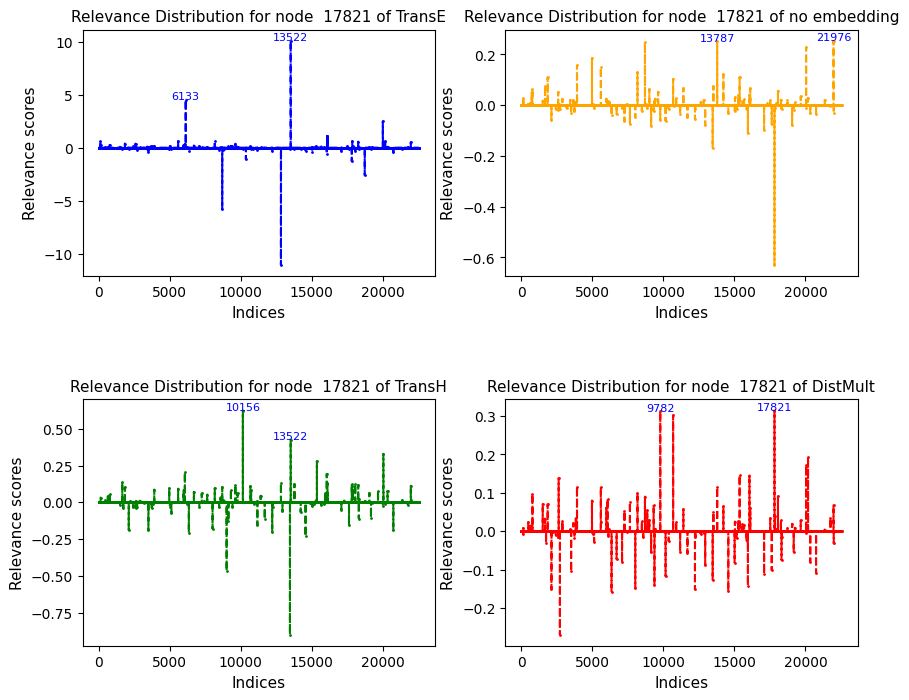

<Figure size 900x600 with 0 Axes>

relevances_node_18673.pt 18673  9863 relevances_edge_9946.pt


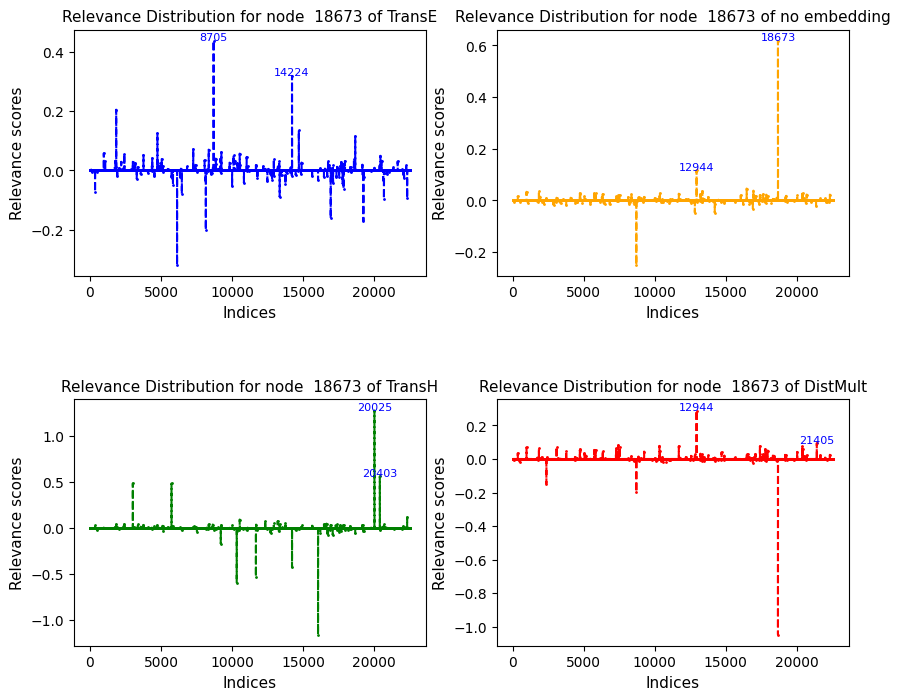

<Figure size 900x600 with 0 Axes>

relevances_node_1886.pt 1886  9863 relevances_edge_9946.pt


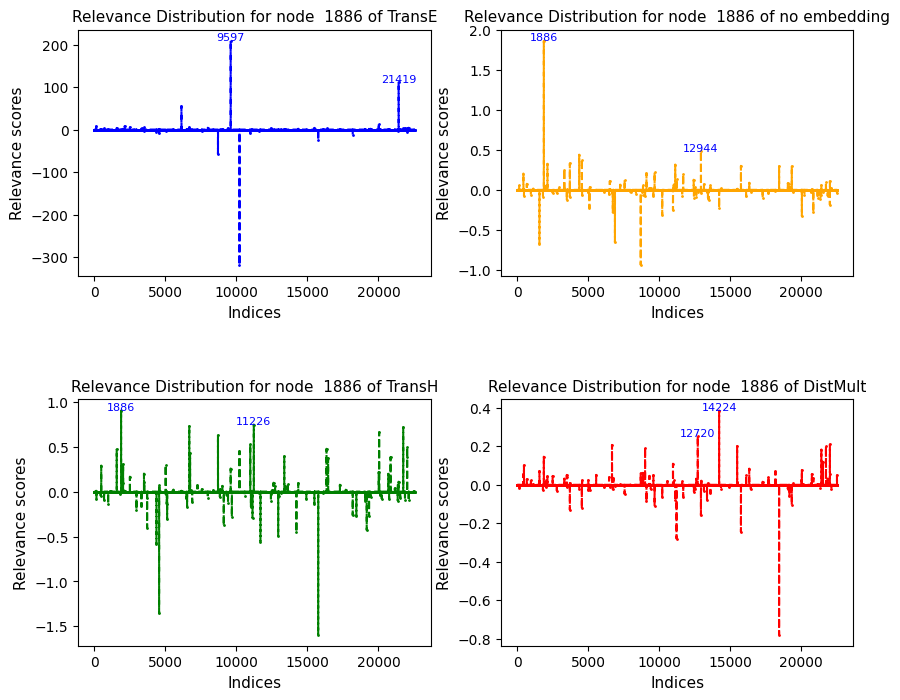

<Figure size 900x600 with 0 Axes>

relevances_node_1892.pt 1892  9863 relevances_edge_9946.pt


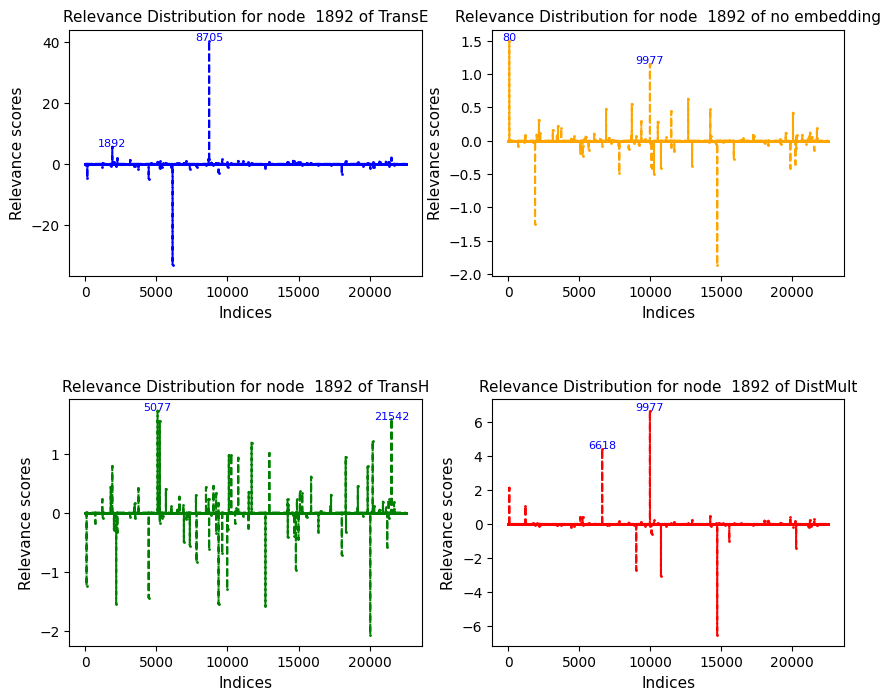

<Figure size 900x600 with 0 Axes>

relevances_node_19053.pt 19053  9863 relevances_edge_9946.pt


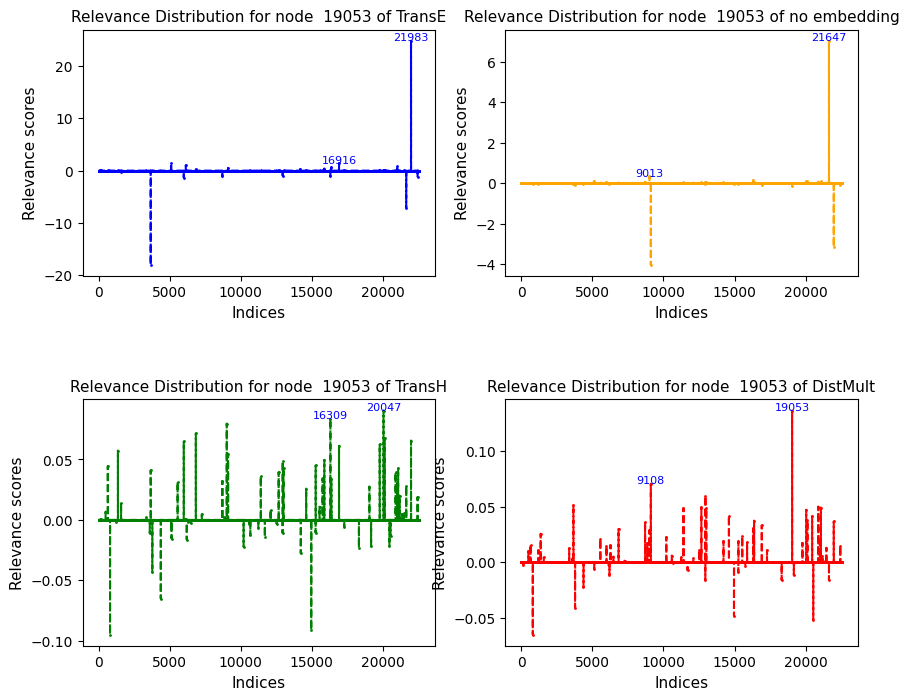

<Figure size 900x600 with 0 Axes>

relevances_node_19344.pt 19344  9863 relevances_edge_9946.pt


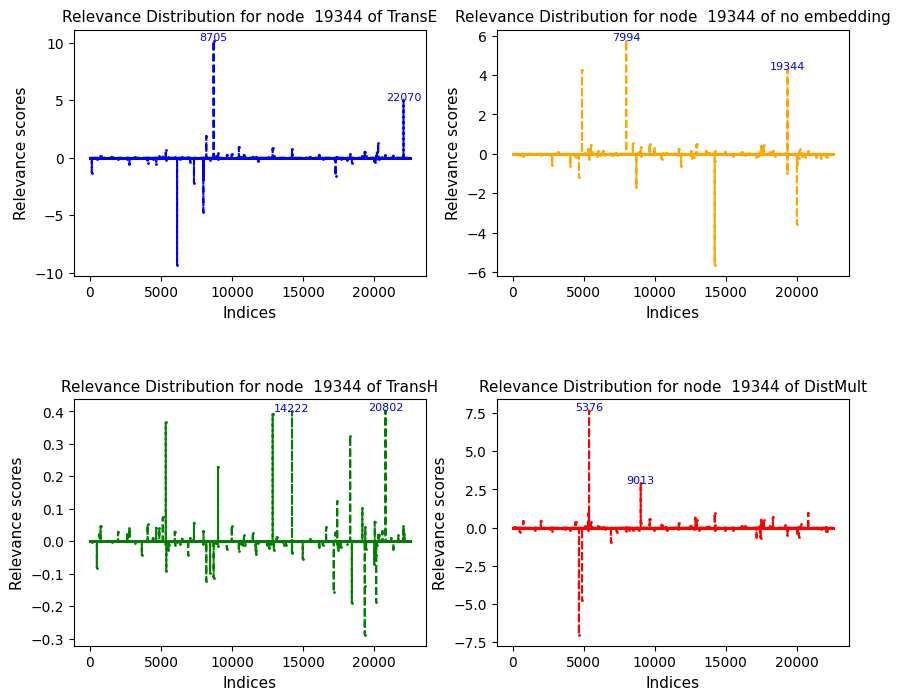

<Figure size 900x600 with 0 Axes>

relevances_node_1966.pt 1966  9863 relevances_edge_9946.pt


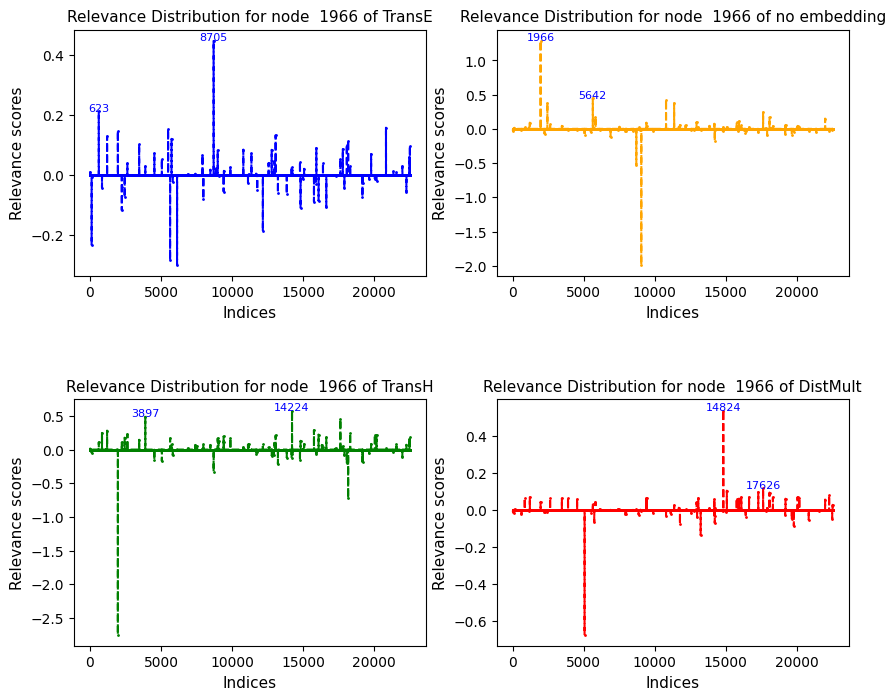

<Figure size 900x600 with 0 Axes>

relevances_node_19996.pt 19996  9863 relevances_edge_9946.pt


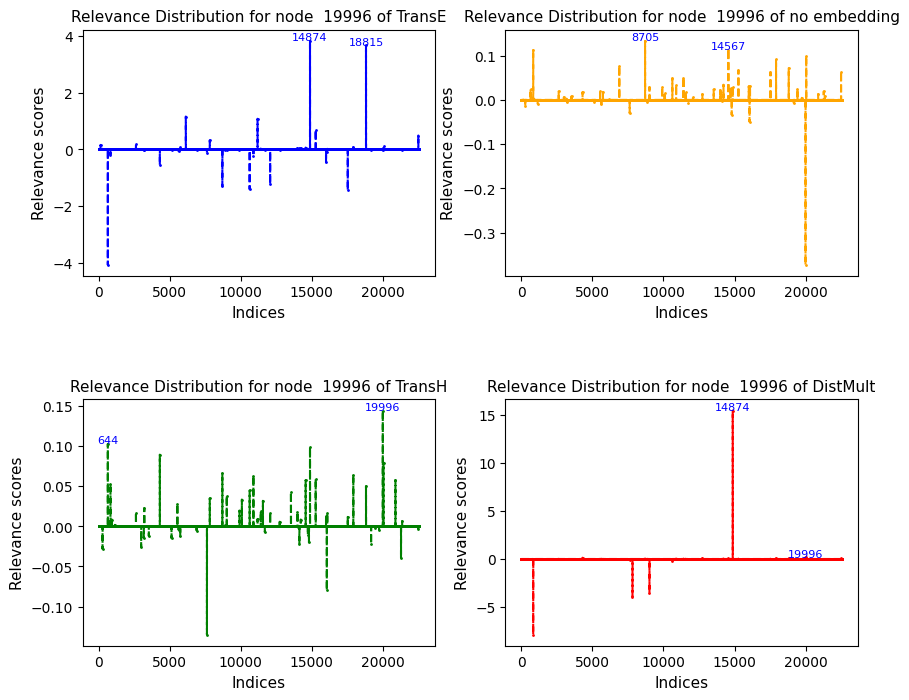

<Figure size 900x600 with 0 Axes>

relevances_node_20021.pt 20021  9863 relevances_edge_9946.pt


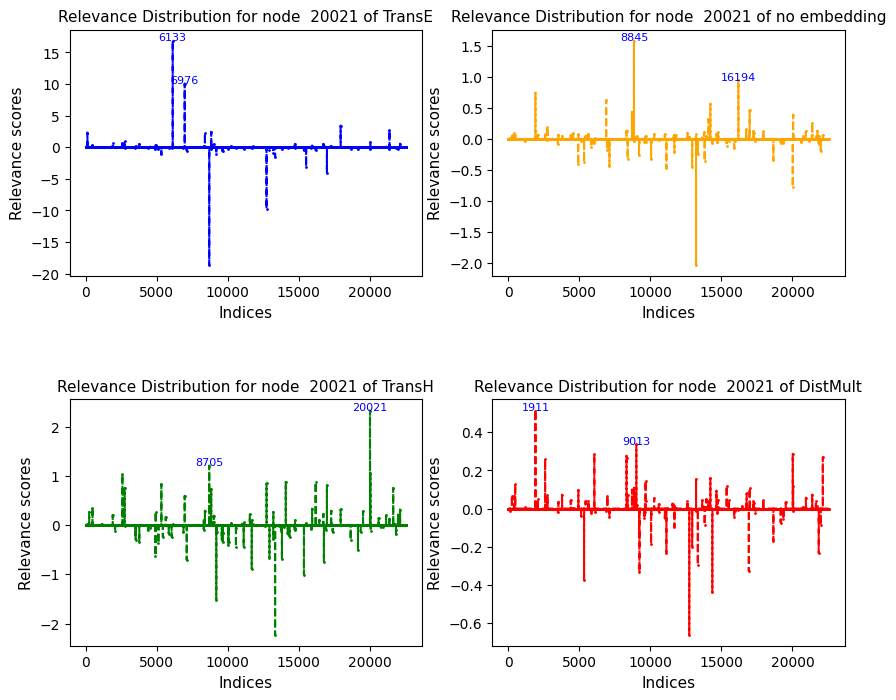

<Figure size 900x600 with 0 Axes>

relevances_node_20789.pt 20789  9863 relevances_edge_9946.pt


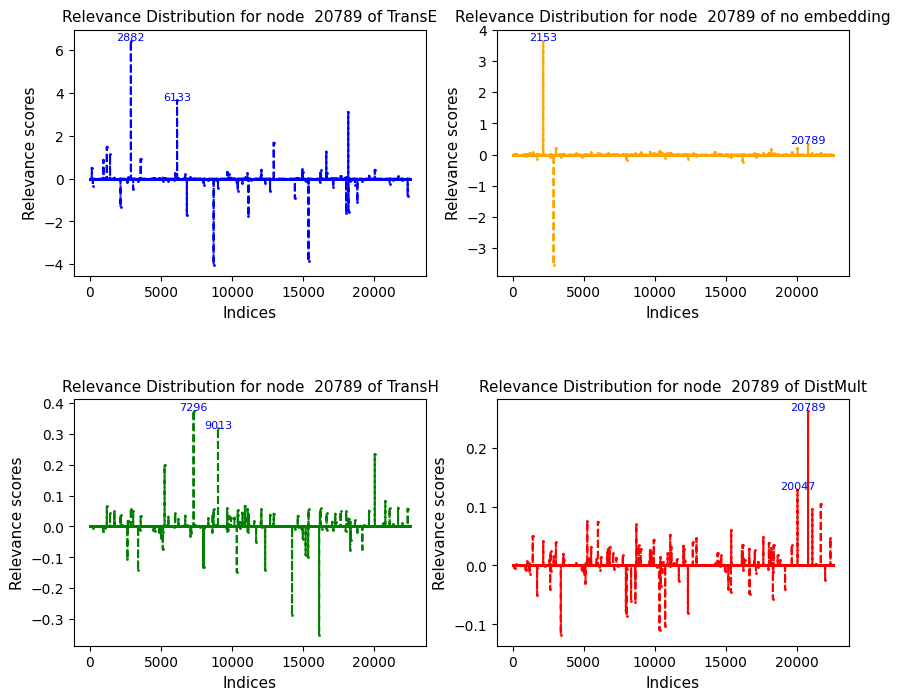

<Figure size 900x600 with 0 Axes>

relevances_node_20806.pt 20806  9863 relevances_edge_9946.pt


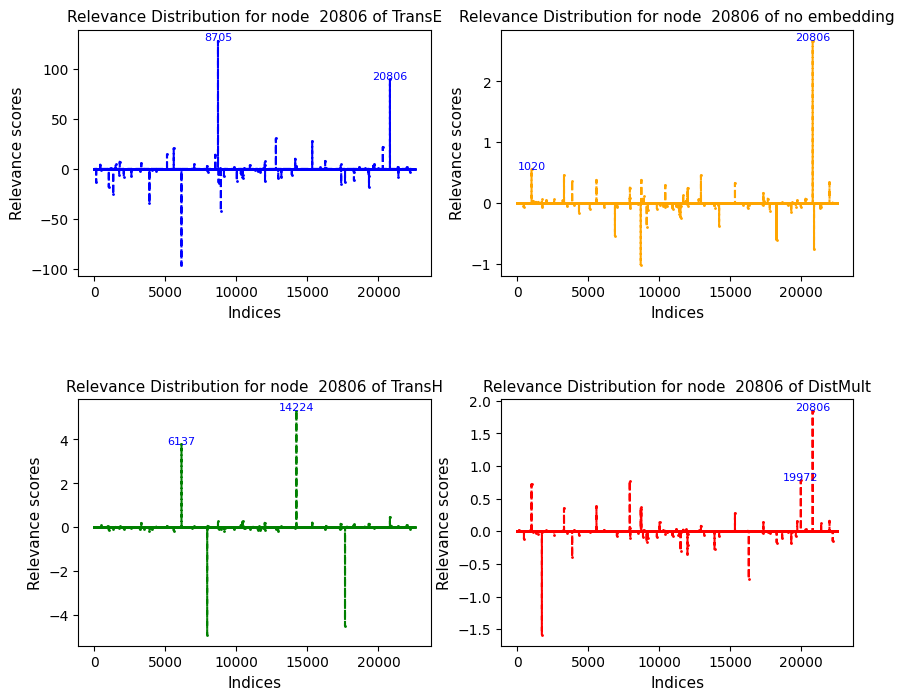

<Figure size 900x600 with 0 Axes>

relevances_node_20951.pt 20951  9863 relevances_edge_9946.pt


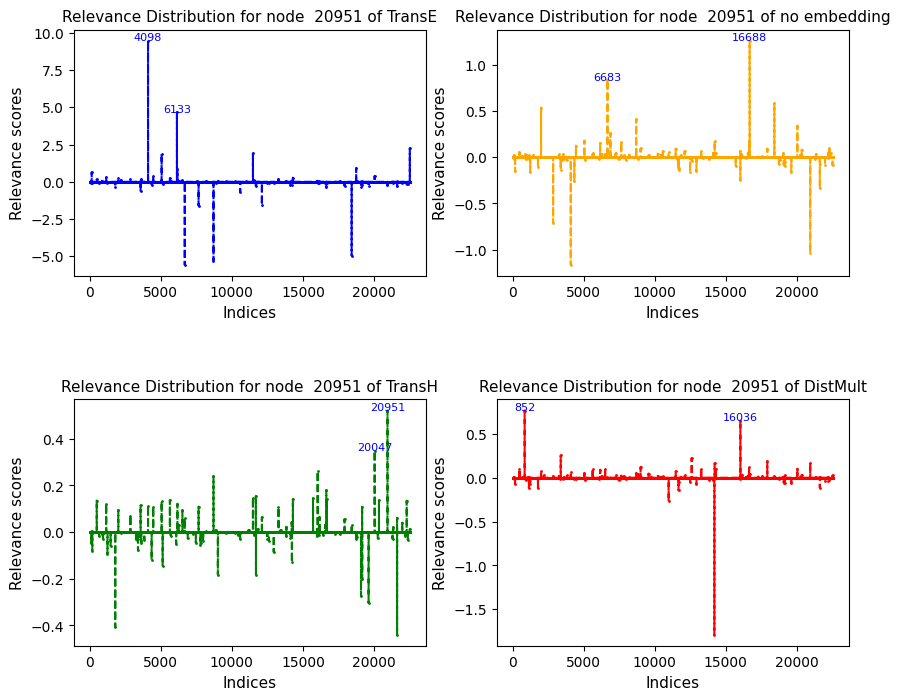

<Figure size 900x600 with 0 Axes>

relevances_node_21236.pt 21236  9863 relevances_edge_9946.pt


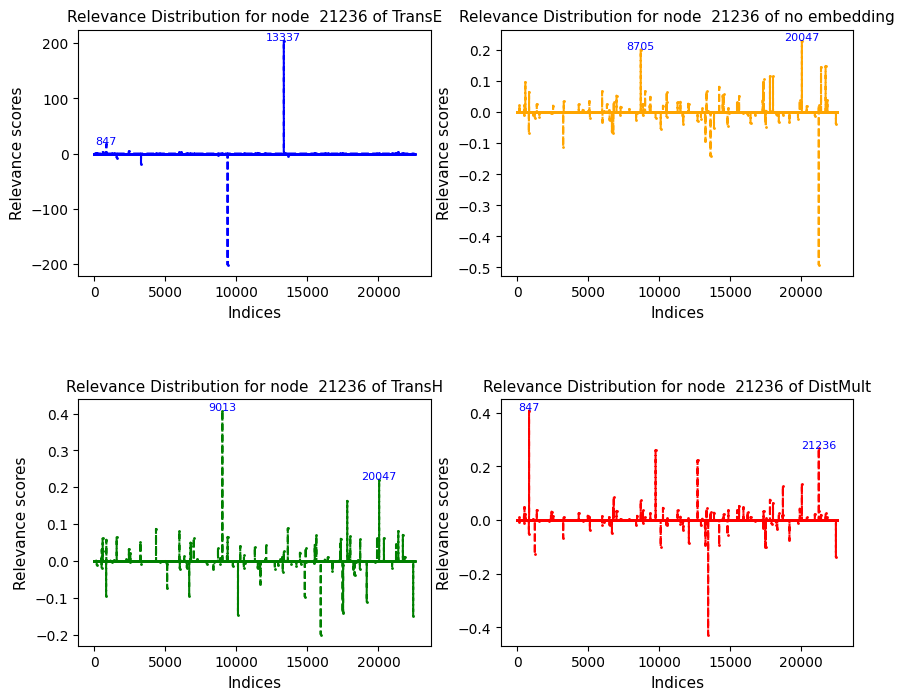

<Figure size 900x600 with 0 Axes>

relevances_node_21379.pt 21379  9863 relevances_edge_9946.pt


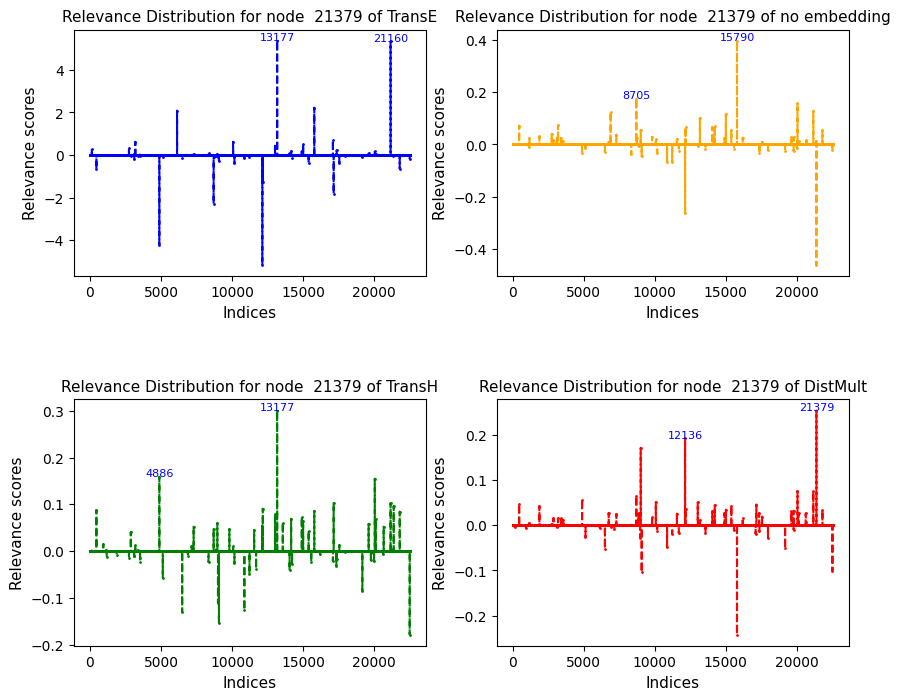

<Figure size 900x600 with 0 Axes>

relevances_node_21437.pt 21437  9863 relevances_edge_9946.pt


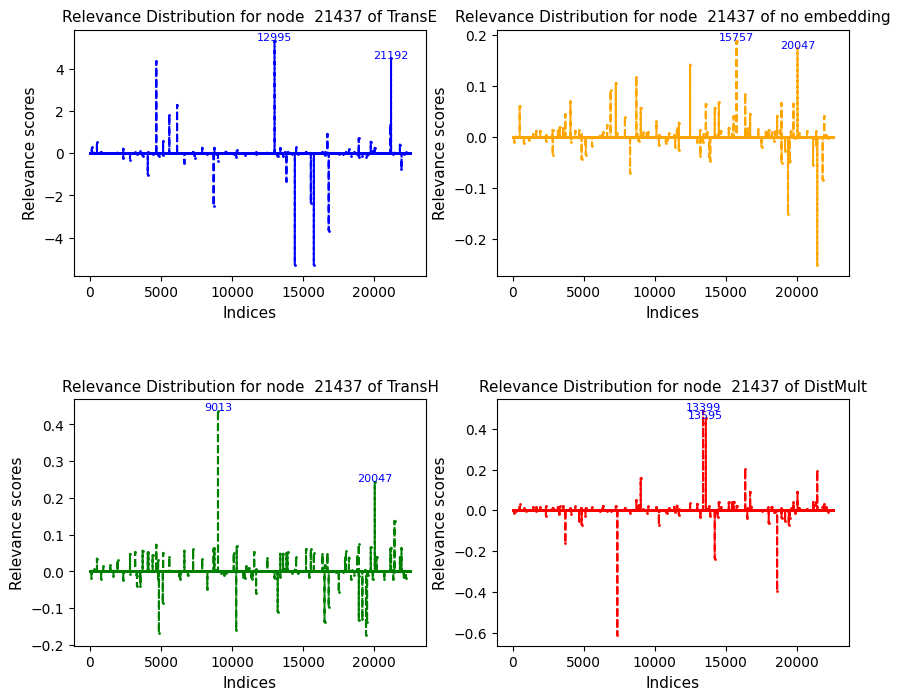

<Figure size 900x600 with 0 Axes>

relevances_node_21481.pt 21481  9863 relevances_edge_9946.pt


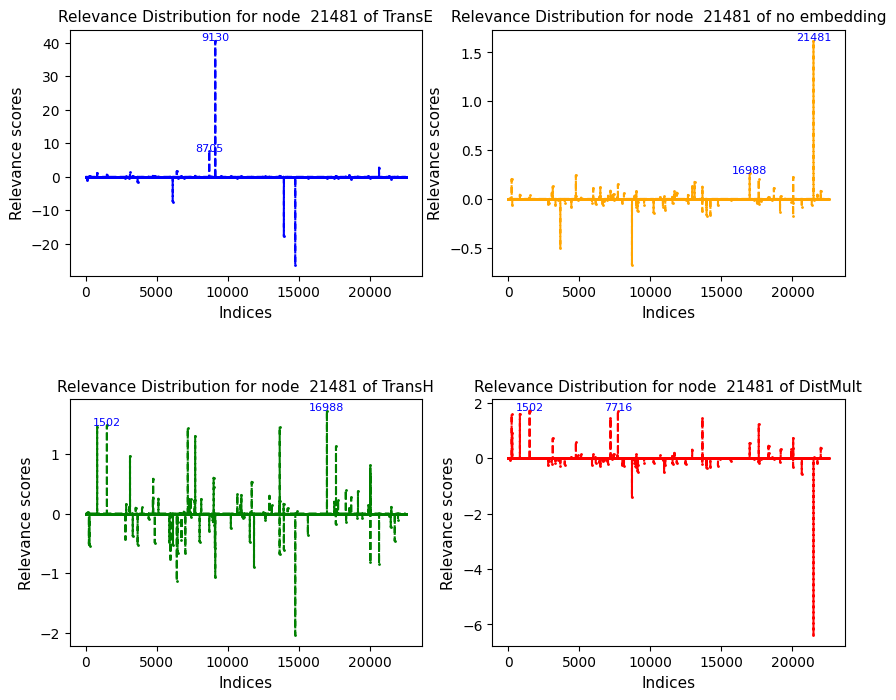

<Figure size 900x600 with 0 Axes>

relevances_node_2167.pt 2167  9863 relevances_edge_9946.pt


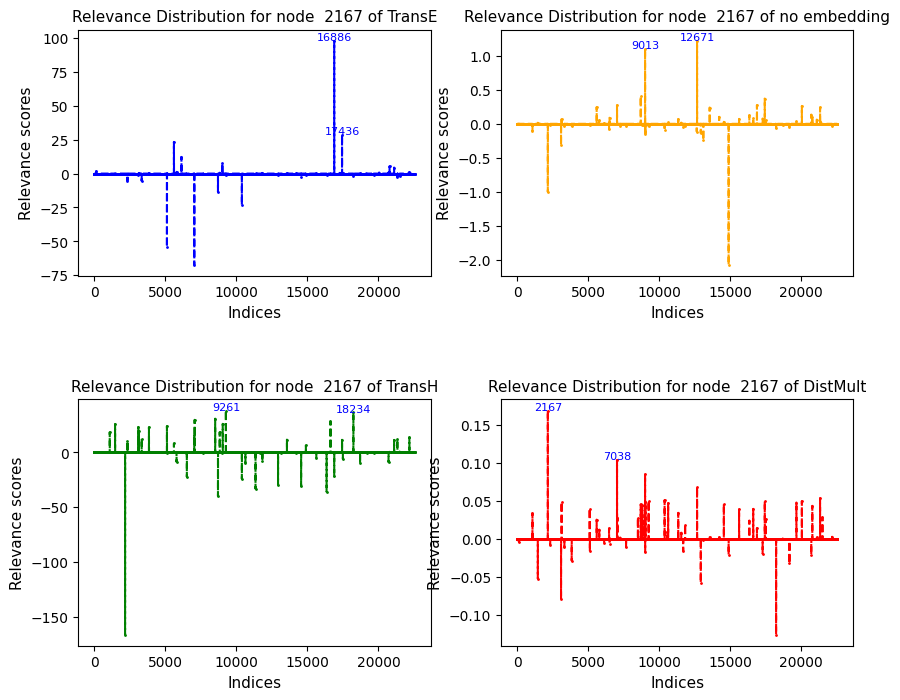

<Figure size 900x600 with 0 Axes>

relevances_node_21681.pt 21681  9863 relevances_edge_9946.pt


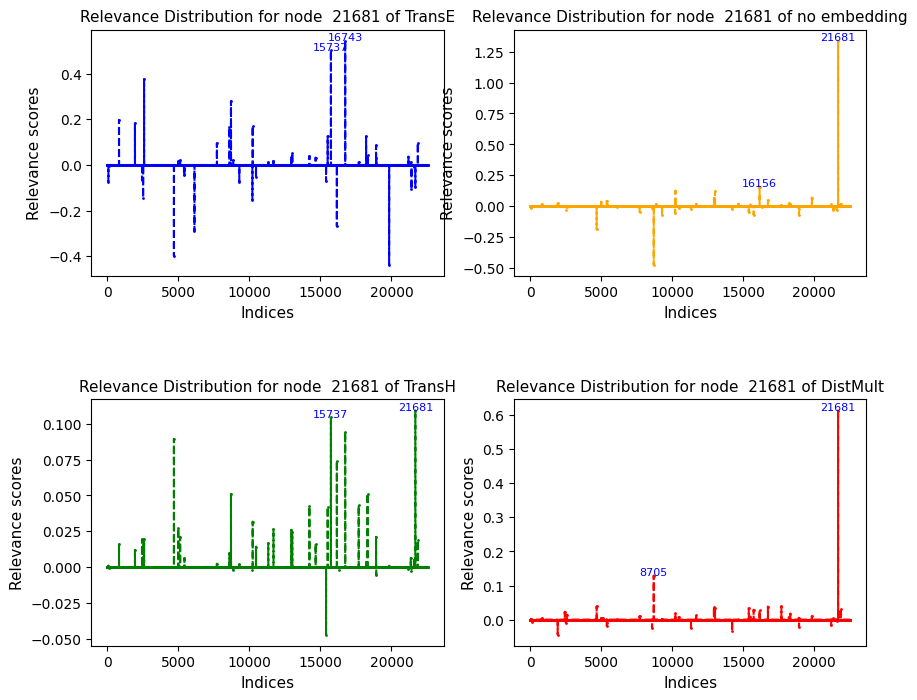

<Figure size 900x600 with 0 Axes>

relevances_node_22065.pt 22065  9863 relevances_edge_9946.pt


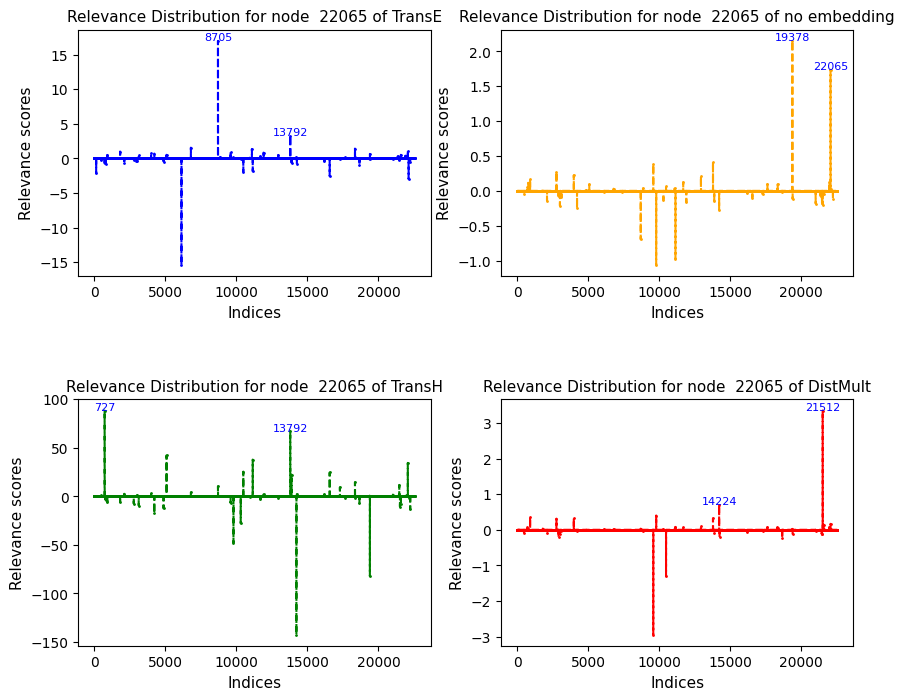

<Figure size 900x600 with 0 Axes>

relevances_node_22182.pt 22182  9863 relevances_edge_9946.pt


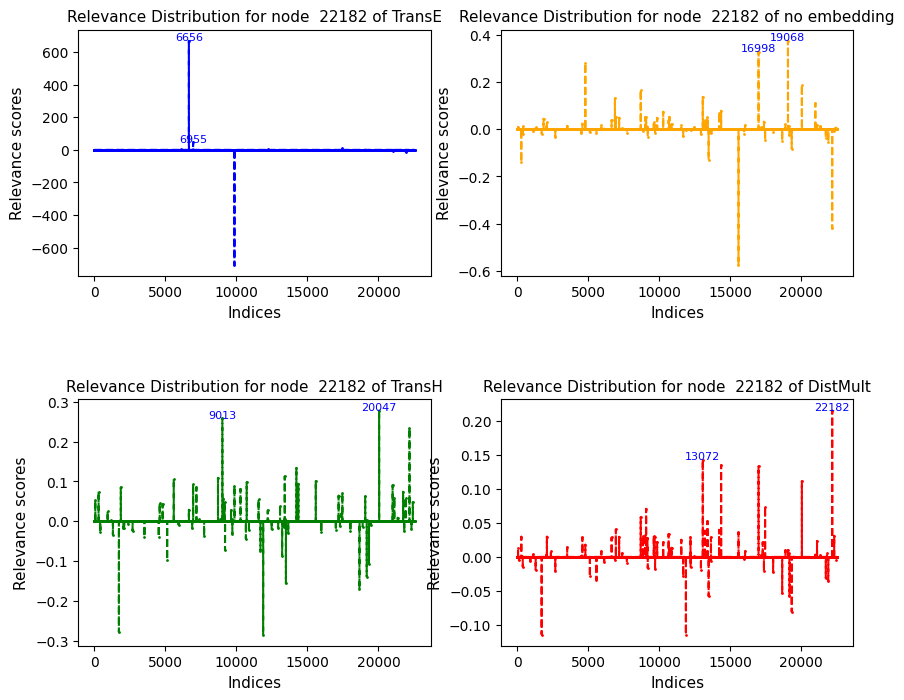

<Figure size 900x600 with 0 Axes>

relevances_node_22206.pt 22206  9863 relevances_edge_9946.pt


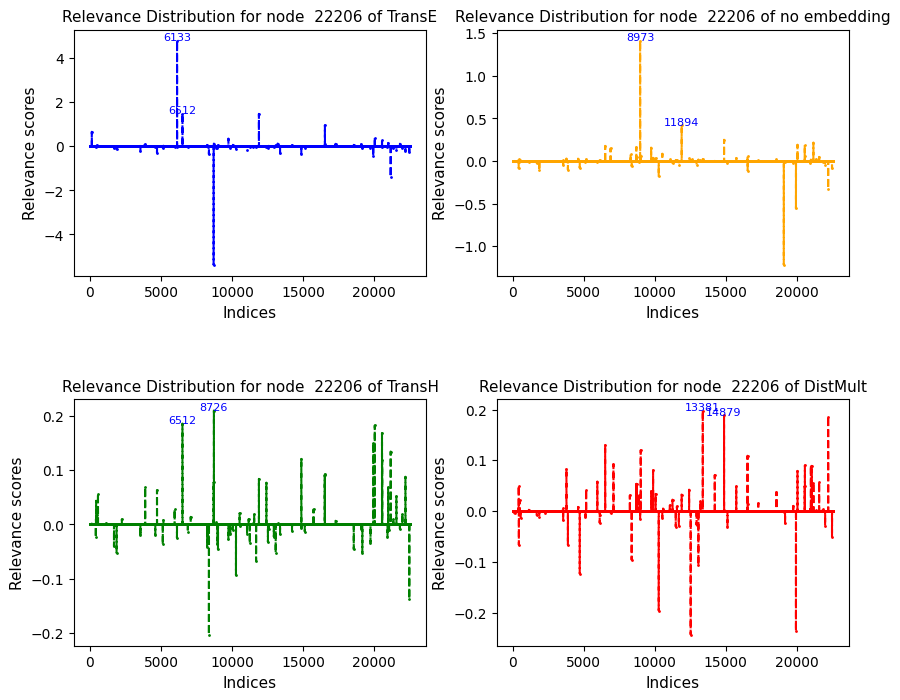

<Figure size 900x600 with 0 Axes>

relevances_node_22535.pt 22535  9863 relevances_edge_9946.pt


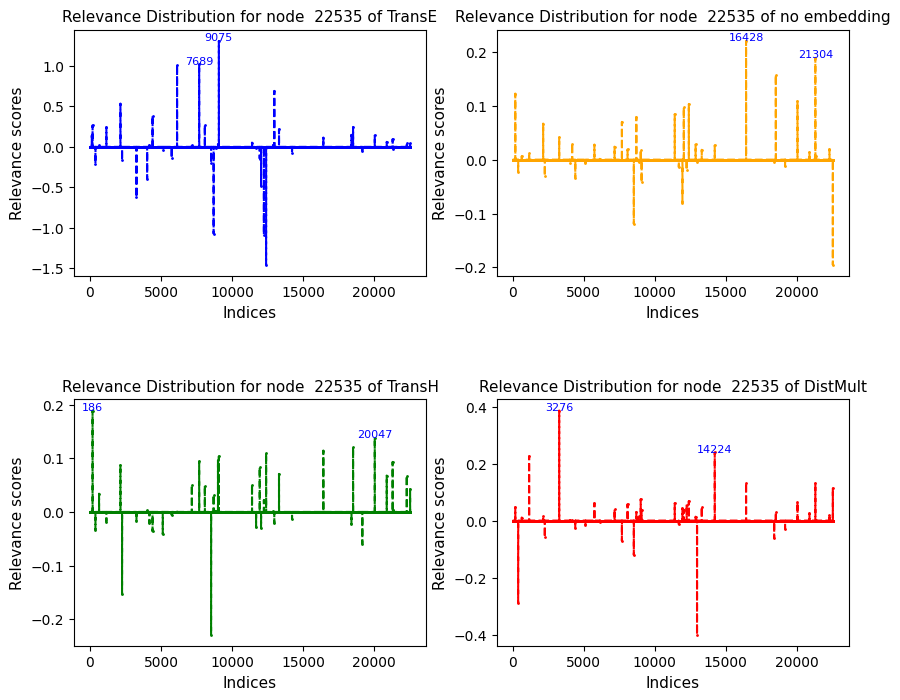

<Figure size 900x600 with 0 Axes>

relevances_node_2748.pt 2748  9863 relevances_edge_9946.pt


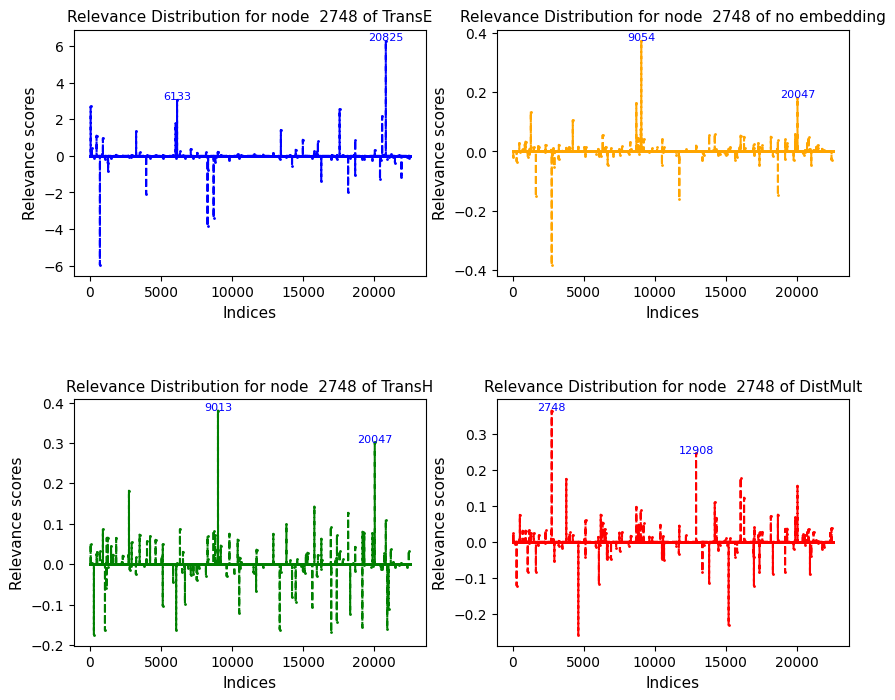

<Figure size 900x600 with 0 Axes>

relevances_node_2845.pt 2845  9863 relevances_edge_9946.pt


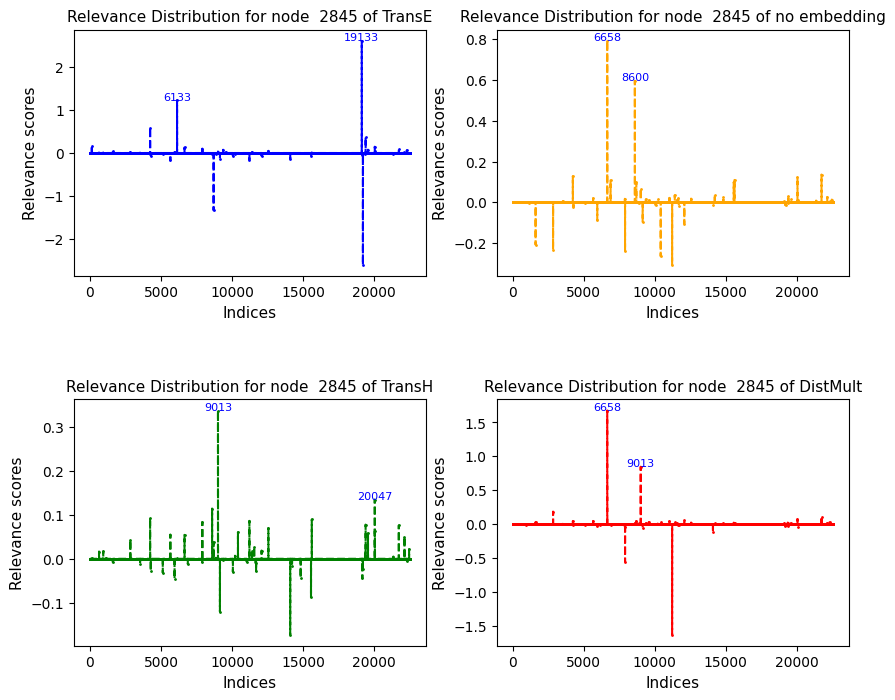

<Figure size 900x600 with 0 Axes>

relevances_node_3104.pt 3104  9863 relevances_edge_9946.pt


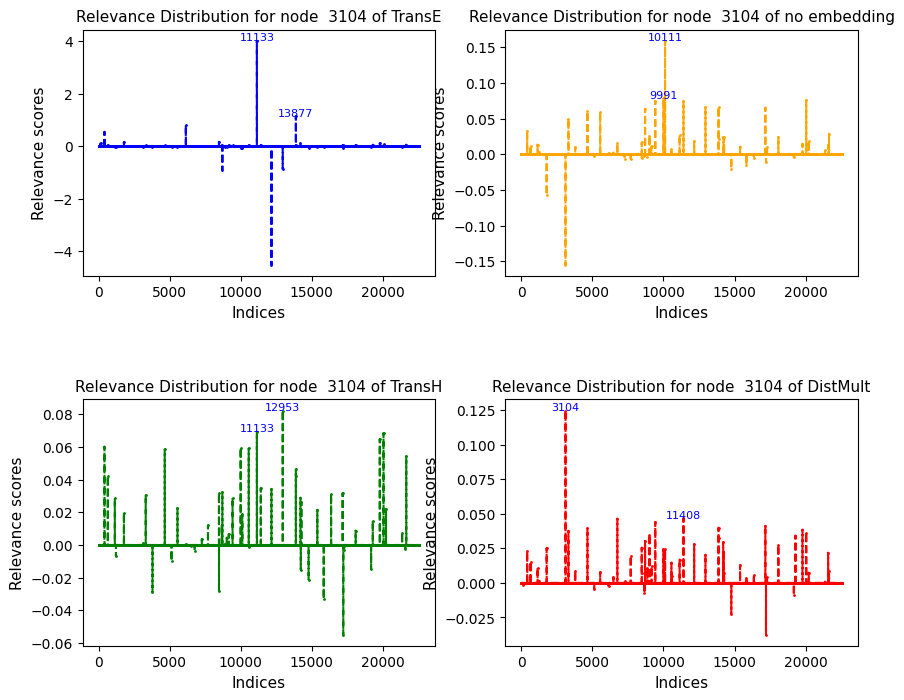

<Figure size 900x600 with 0 Axes>

relevances_node_3227.pt 3227  9863 relevances_edge_9946.pt


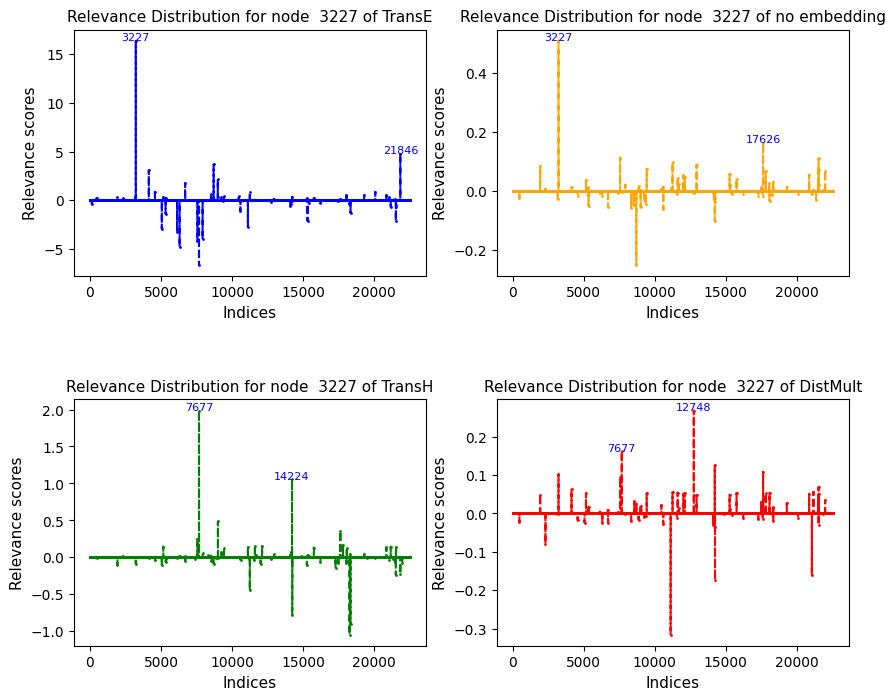

<Figure size 900x600 with 0 Axes>

relevances_node_3373.pt 3373  9863 relevances_edge_9946.pt


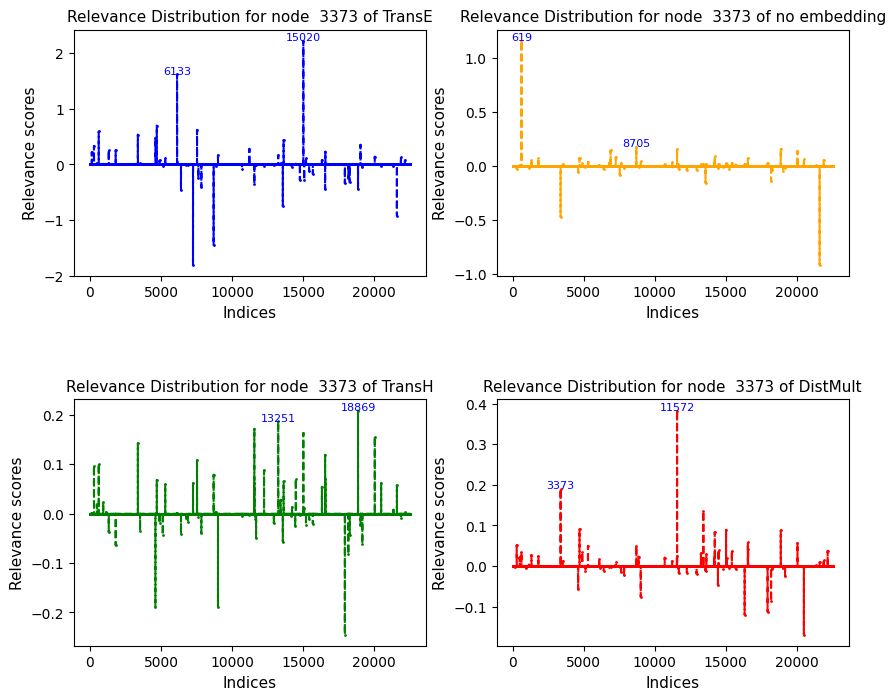

<Figure size 900x600 with 0 Axes>

relevances_node_4191.pt 4191  9863 relevances_edge_9946.pt


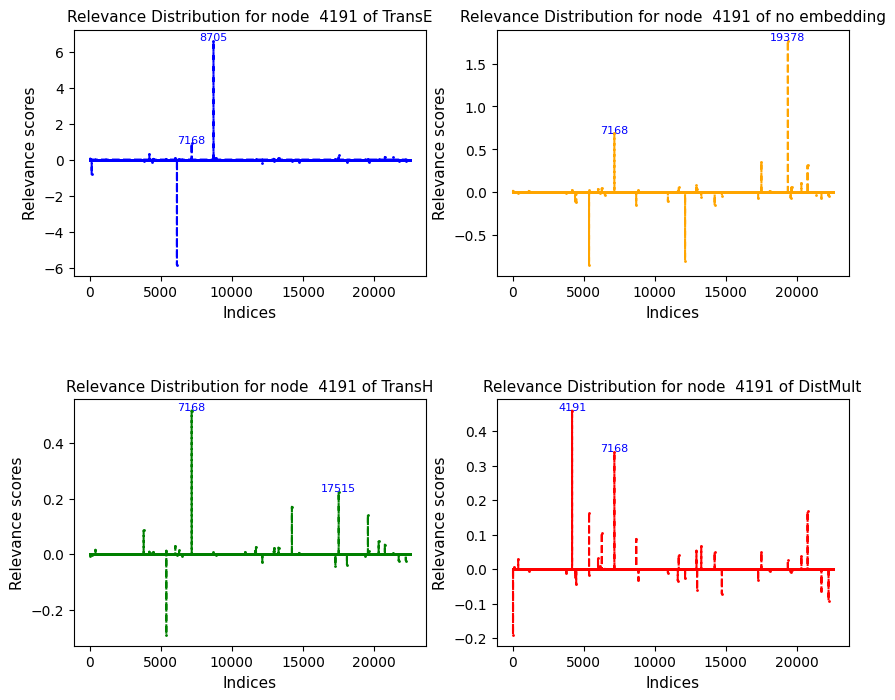

<Figure size 900x600 with 0 Axes>

relevances_node_4532.pt 4532  9863 relevances_edge_9946.pt


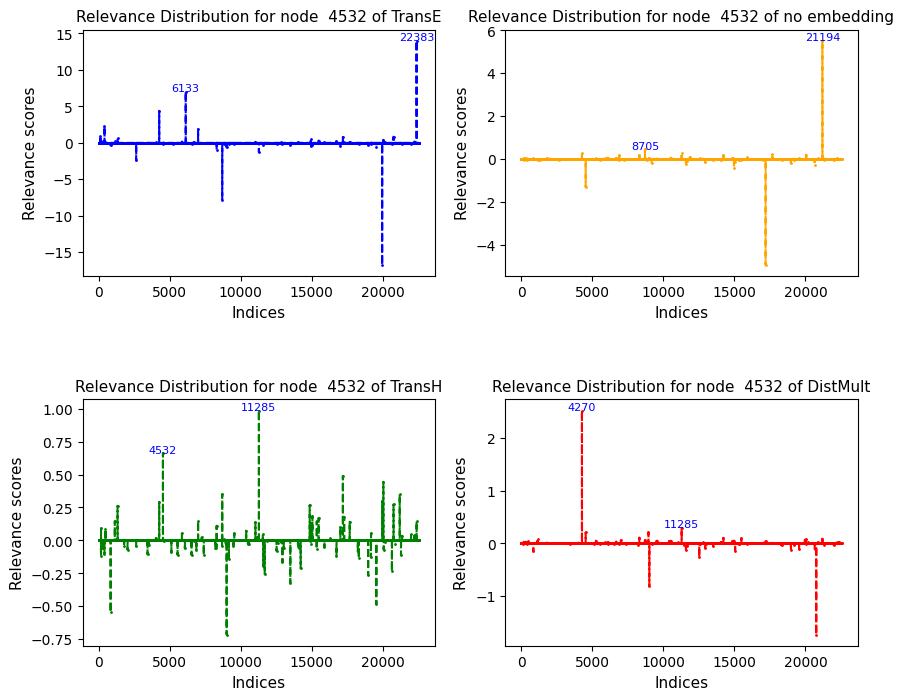

<Figure size 900x600 with 0 Axes>

relevances_node_4631.pt 4631  9863 relevances_edge_9946.pt


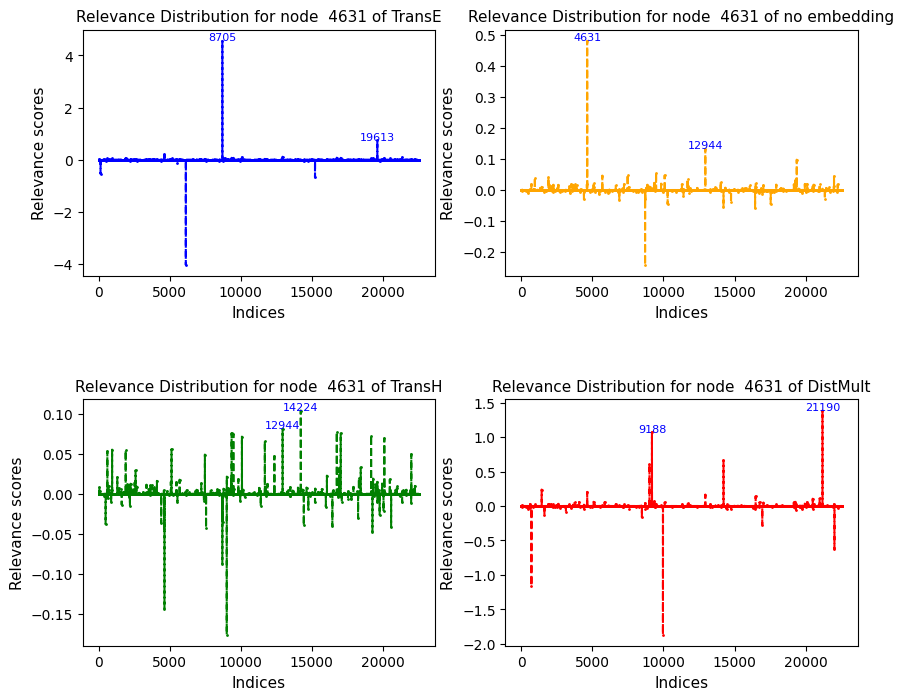

<Figure size 900x600 with 0 Axes>

relevances_node_471.pt 471  9863 relevances_edge_9946.pt


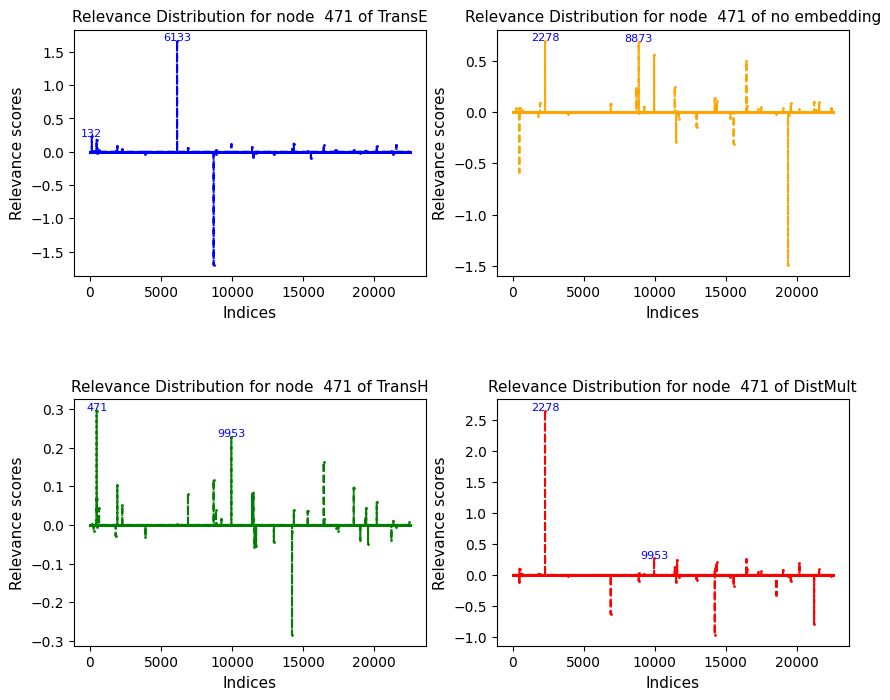

<Figure size 900x600 with 0 Axes>

relevances_node_5351.pt 5351  9863 relevances_edge_9946.pt


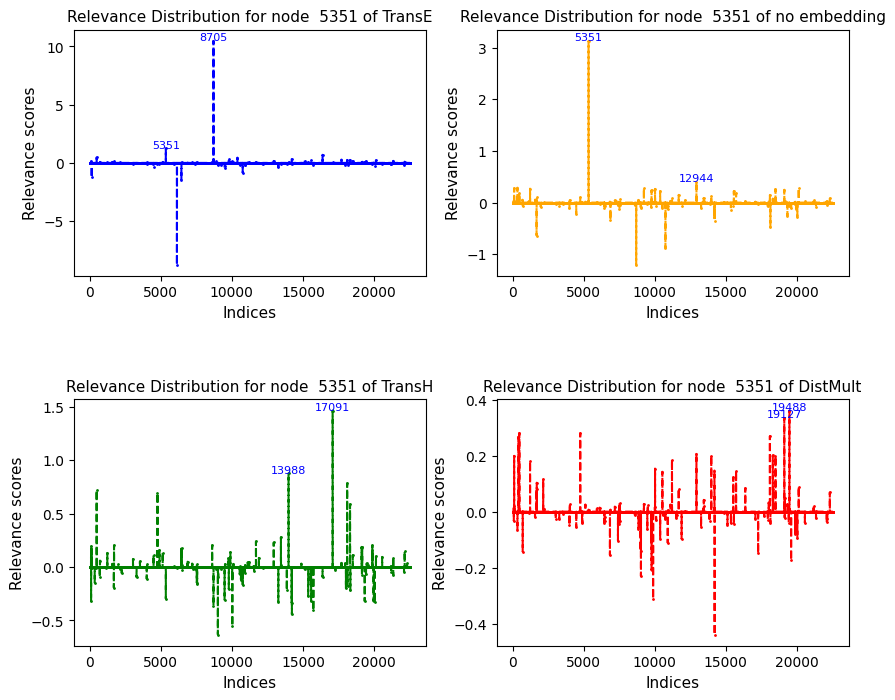

<Figure size 900x600 with 0 Axes>

relevances_node_5881.pt 5881  9863 relevances_edge_9946.pt


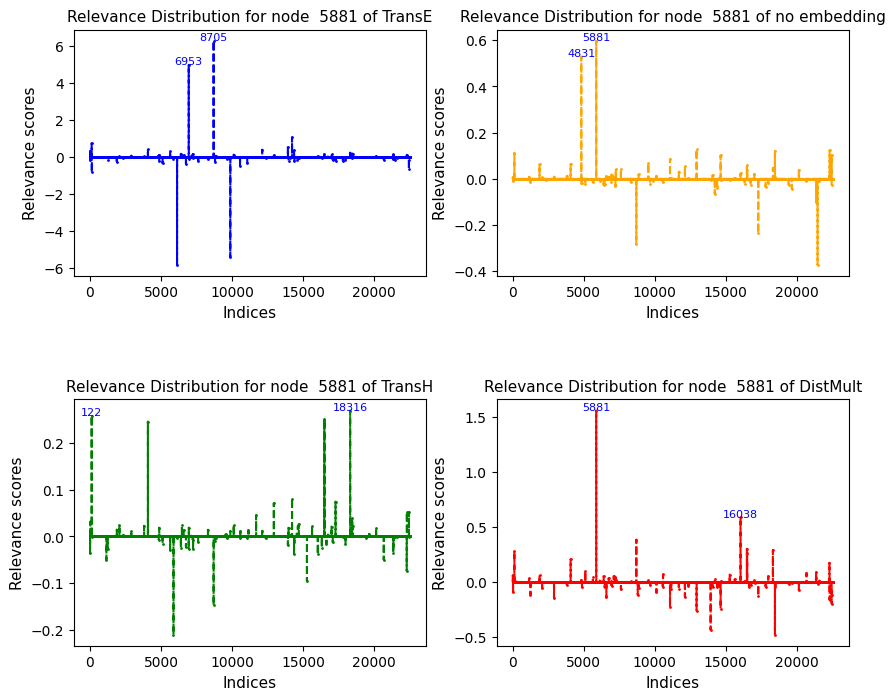

<Figure size 900x600 with 0 Axes>

relevances_node_600.pt 600  9863 relevances_edge_9946.pt


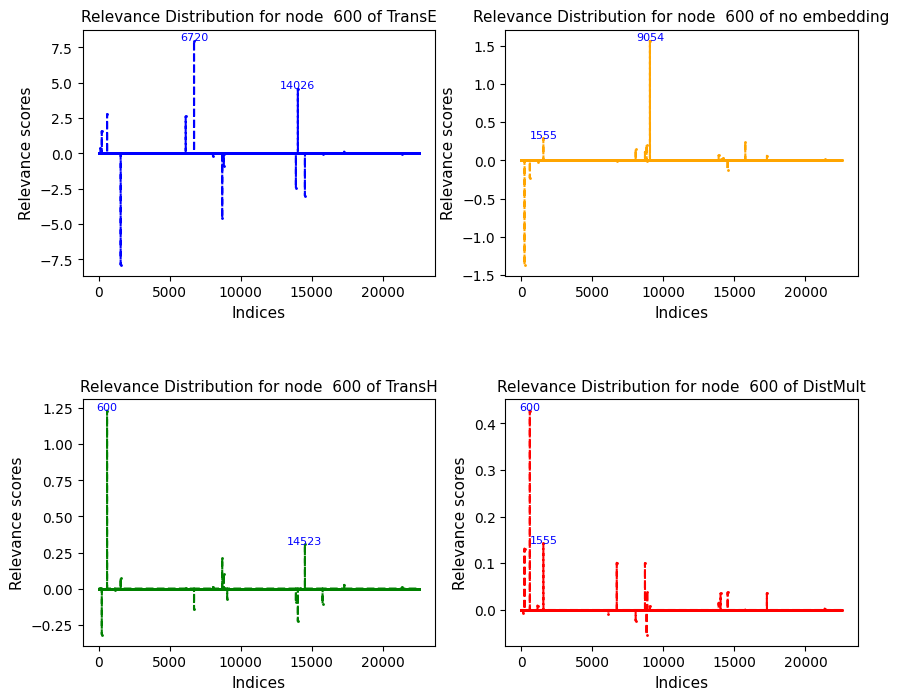

<Figure size 900x600 with 0 Axes>

relevances_node_637.pt 637  9863 relevances_edge_9946.pt


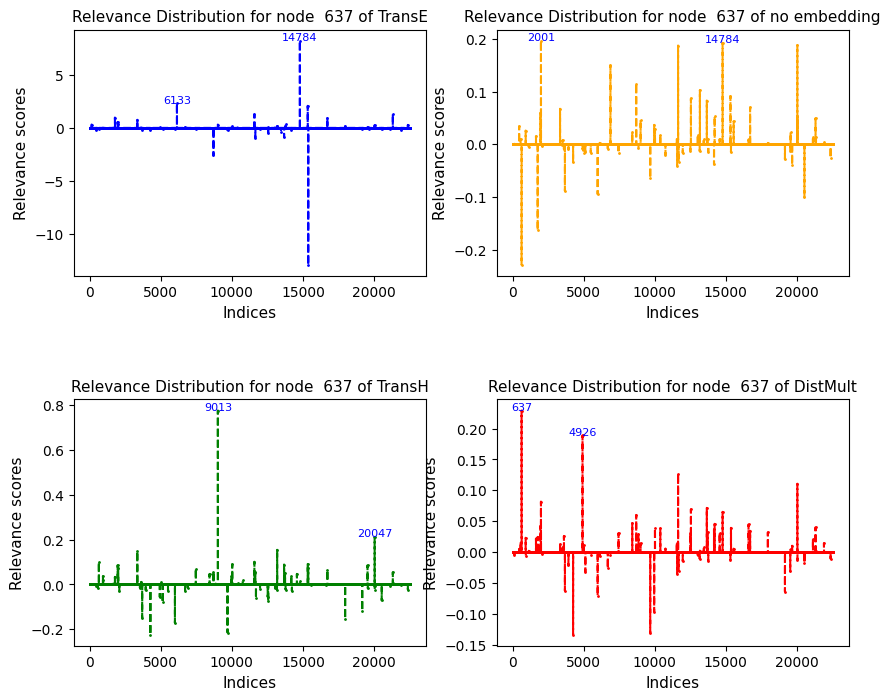

<Figure size 900x600 with 0 Axes>

relevances_node_669.pt 669  9863 relevances_edge_9946.pt


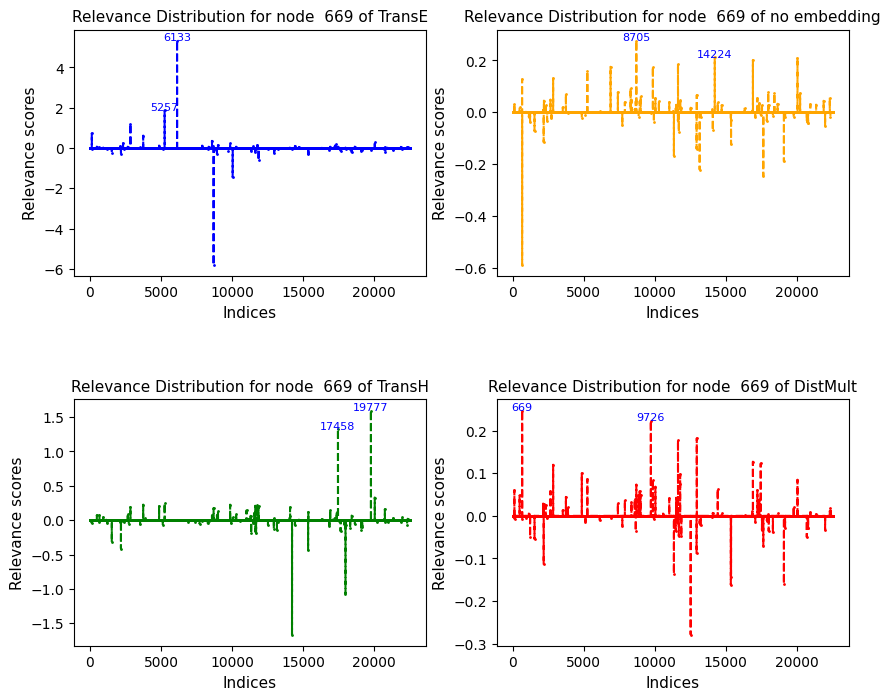

<Figure size 900x600 with 0 Axes>

relevances_node_6762.pt 6762  9863 relevances_edge_9946.pt


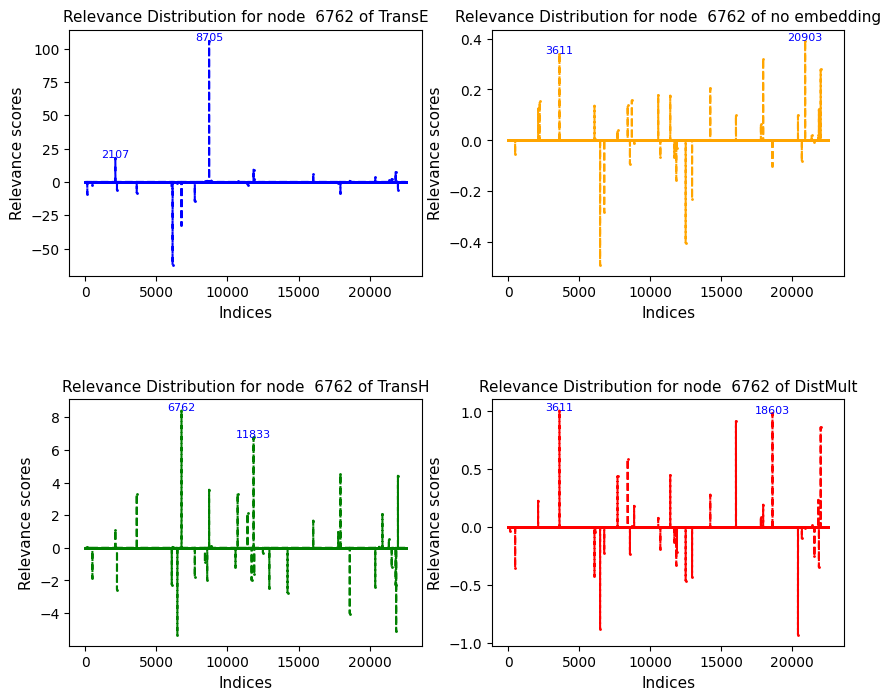

<Figure size 900x600 with 0 Axes>

relevances_node_7769.pt 7769  9863 relevances_edge_9946.pt


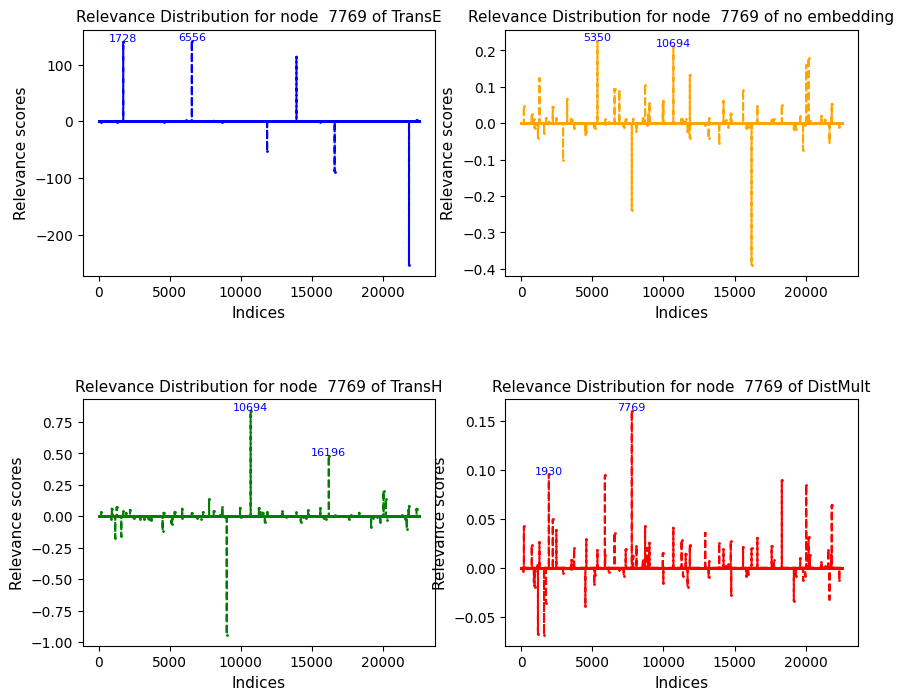

<Figure size 900x600 with 0 Axes>

relevances_node_7952.pt 7952  9863 relevances_edge_9946.pt


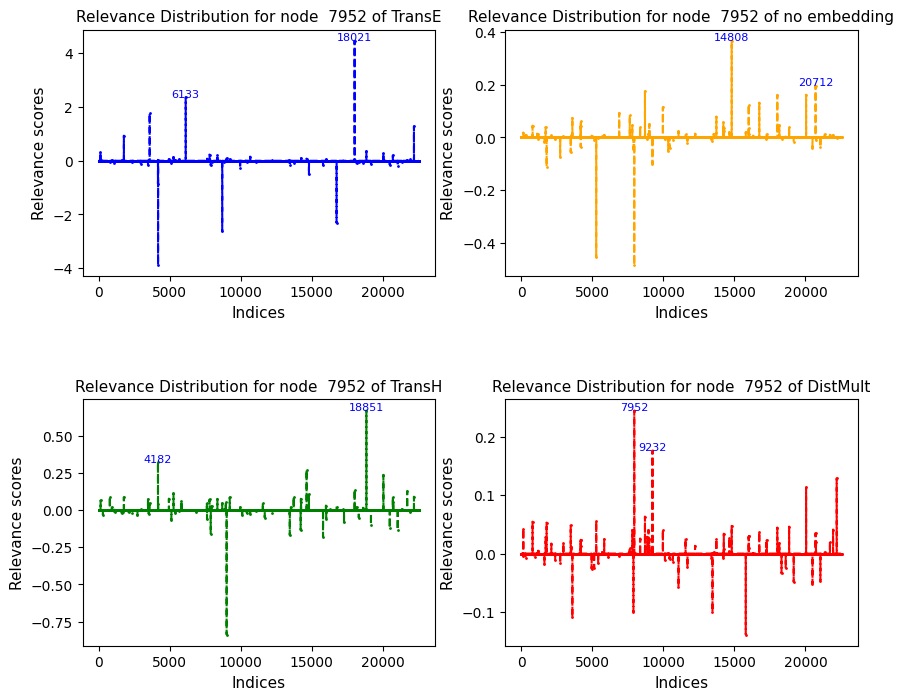

<Figure size 900x600 with 0 Axes>

relevances_node_7955.pt 7955  9863 relevances_edge_9946.pt


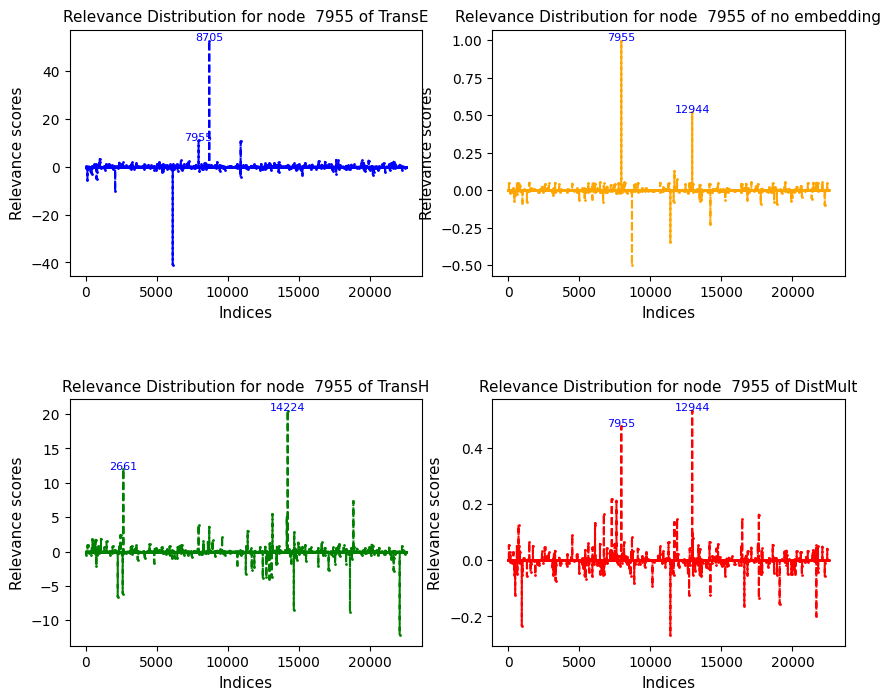

<Figure size 900x600 with 0 Axes>

relevances_node_9380.pt 9380  9863 relevances_edge_9946.pt


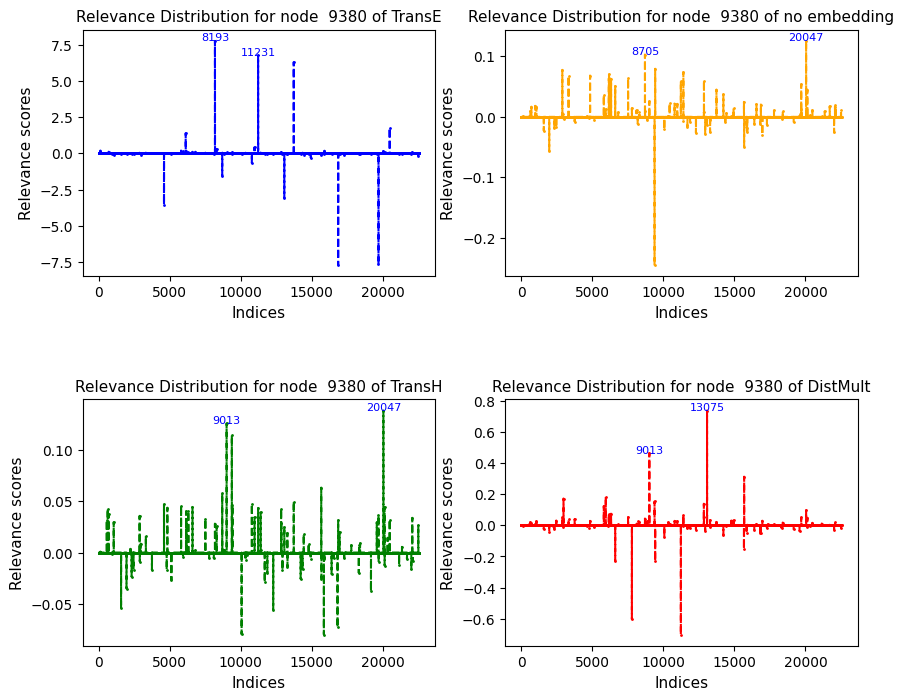

<Figure size 900x600 with 0 Axes>

relevances_node_9786.pt 9786  9863 relevances_edge_9946.pt


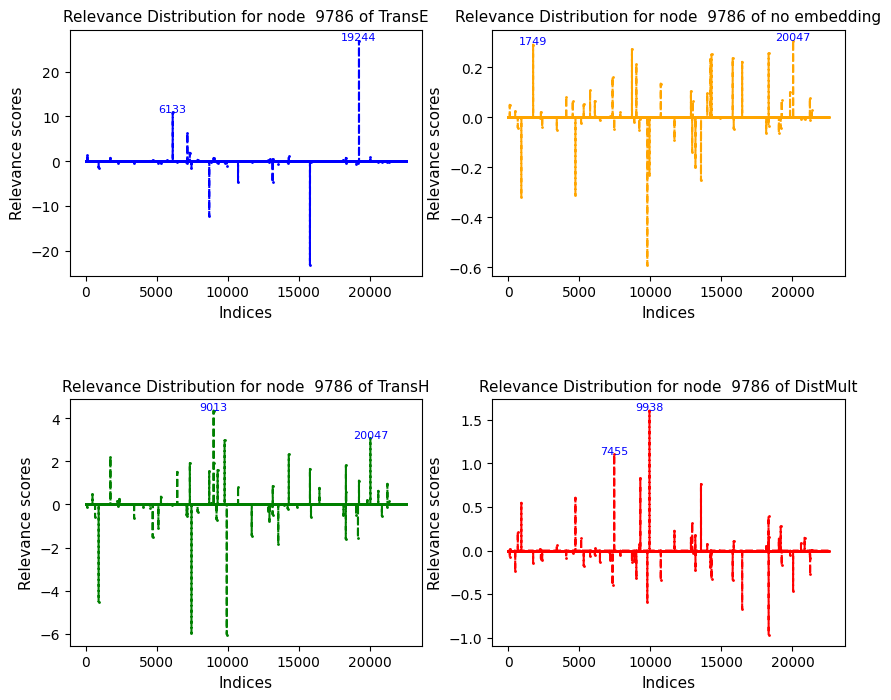

<Figure size 900x600 with 0 Axes>

relevances_node_9946.pt 9946  9863 relevances_edge_9946.pt


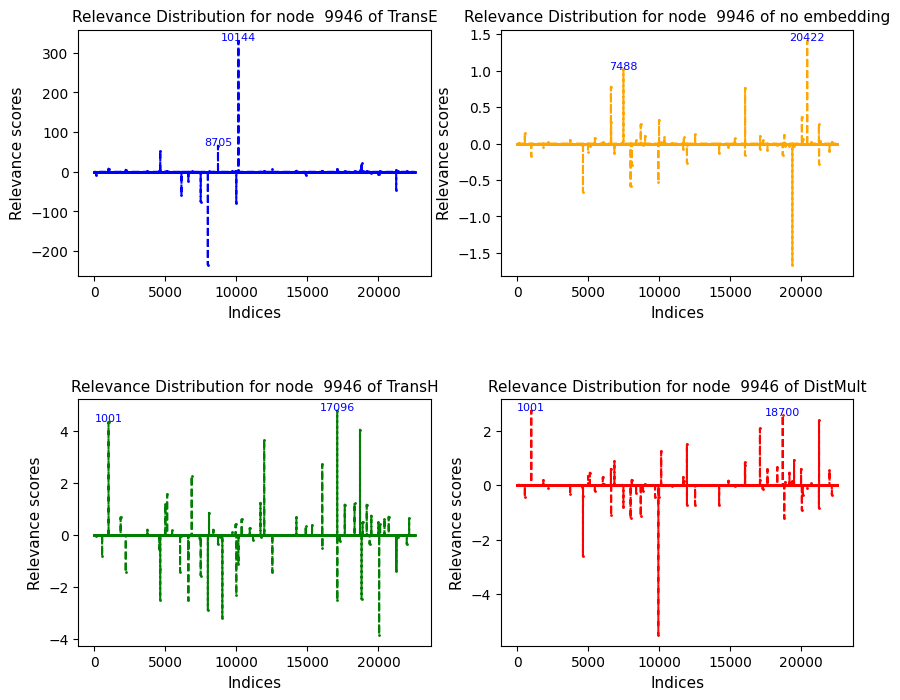

<Figure size 900x600 with 0 Axes>

In [23]:
path = 'out/MUTAG/RGAT_no_emb/relevances/'
path_dist = 'out/MUTAG/RGAT_emb/DistMult/relevances/'
path_transe = 'out/MUTAG/RGAT_emb/TransE/relevances/'
path_transh = 'out/MUTAG/RGAT_emb/TransH/relevances/'
fil = os.listdir(path)
fil_transe = os.listdir('out/MUTAG/RGAT_emb/TransE/relevances/')
fil_transh = os.listdir('out/MUTAG/RGAT_emb/TransH/relevances/')
fil_dist = os.listdir('out/MUTAG/RGAT_emb/DistMult/relevances/')
rel_no = [file for file in fil if file.startswith("relevances_node_")]
rel_transe = [file for file in fil if file.startswith("relevances_node_")]
rel_transh = [file for file in fil if file.startswith("relevances_node_")]
rel_dist = [file for file in fil if file.startswith("relevances_node_")]

dfs = []
for rel in rel_transe:
    rte = torch.load(path_transe+rel).to_dense().detach().numpy()
    node_name = rel.split('node_')[1].split('.')[0]


    print(rel, node_name, adapt_node, rel2)
    rno = torch.load(path+rel).to_dense().detach().numpy()
    rth = torch.load(path_transh+rel).to_dense().detach().numpy()
    rdi = torch.load(path_dist+rel).to_dense().detach().numpy()
    #ra = np.sort(ra)
    #rb = np.sort(rb)
    #Create an array of indices for the sorted data
    indices = np.arange(1, len(rte) + 1)
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8), gridspec_kw={'hspace': 0.5})
    # Create a line plot with different line styles and markers
    plt.figure(figsize=(9, 6))
    axes[0,0].plot(indices, rte, color='blue', linestyle='--', marker='.', markersize=2, label='Relevance TransE')
    axes[0,1].plot(indices, rno, color='orange', linestyle='--', marker='.', markersize=2, label='Relevance no embedding')
    axes[1,0].plot(indices, rth, color='green', linestyle='--', marker='.', markersize=2, label='Relevance TransH')
    axes[1,1].plot(indices, rdi, color='red', linestyle='--', marker='.', markersize=2, label='Relevance DistMult')
    emb_type = ['TransE', 'no embedding', 'TransH', 'DistMult']
    plt.tight_layout()
    for i, ax in enumerate(axes.flatten()):
        ax.set_xlabel('Indices', fontsize=11)
        ax.set_ylabel('Relevance scores', fontsize=11)
        ax.set_title('Relevance Distribution for node  {} of {}'.format(node_name, emb_type[i]), fontsize=11)


        highest_indices = np.argsort(-[rte, rno, rth, rdi][i])[:2]
        #lowest_indices = np.argsort([rte, rno, rth, rdi][i])[:2]

        # Annotate highest indices at the top of the plot
        for idx in highest_indices:
            ax.annotate(str(idx), xy=(indices[idx], [rte, rno, rth, rdi][i][idx]),
                     xytext=(0, 0.1), textcoords='offset points', ha='center', fontsize=8, color='blue')


    plt.show()

### EDGE RELEVANCE

relevances_edge_107.pt 107


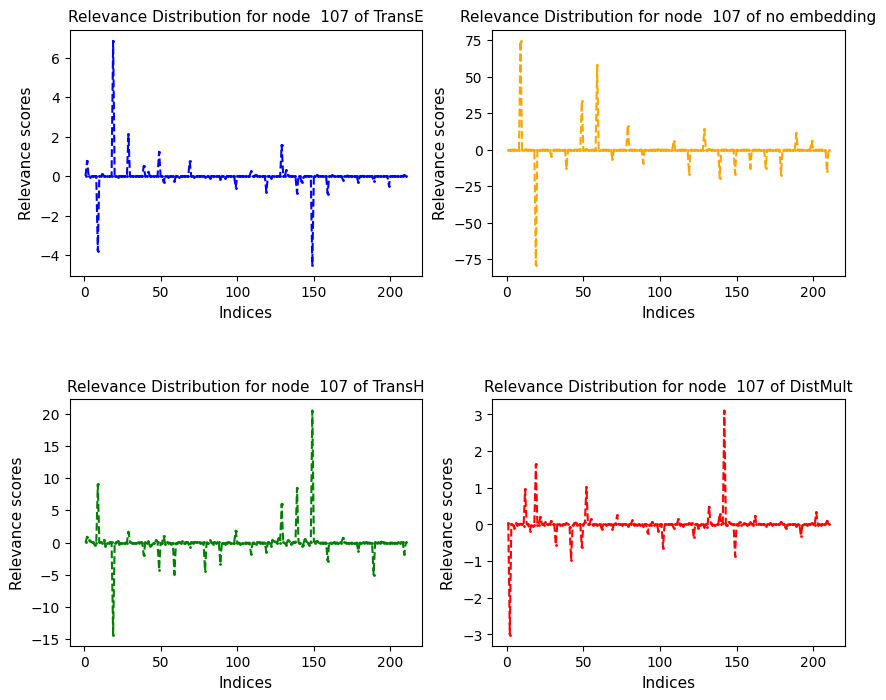

<Figure size 900x600 with 0 Axes>

relevances_edge_1255.pt 1255


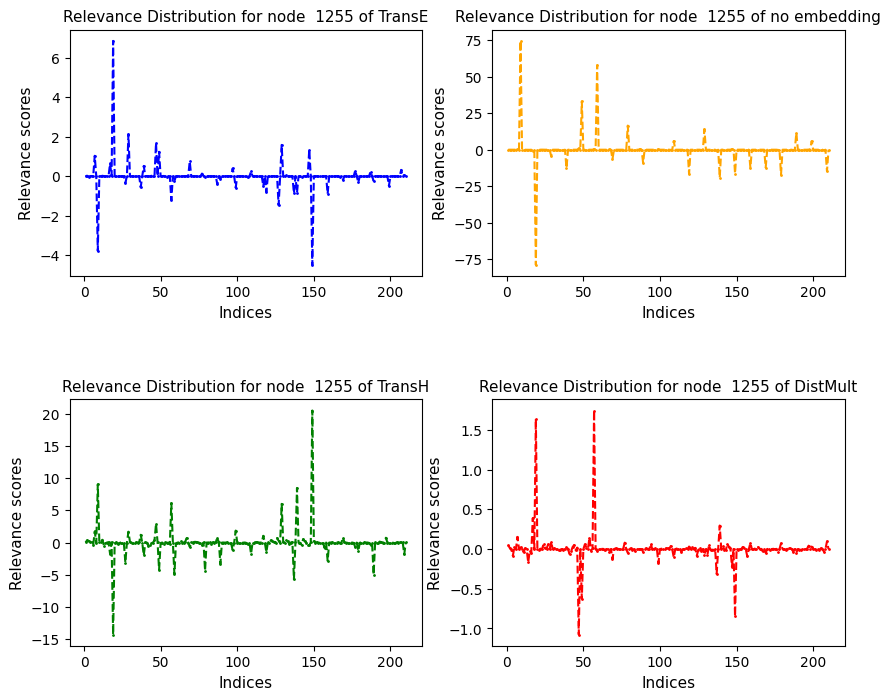

<Figure size 900x600 with 0 Axes>

relevances_edge_1258.pt 1258


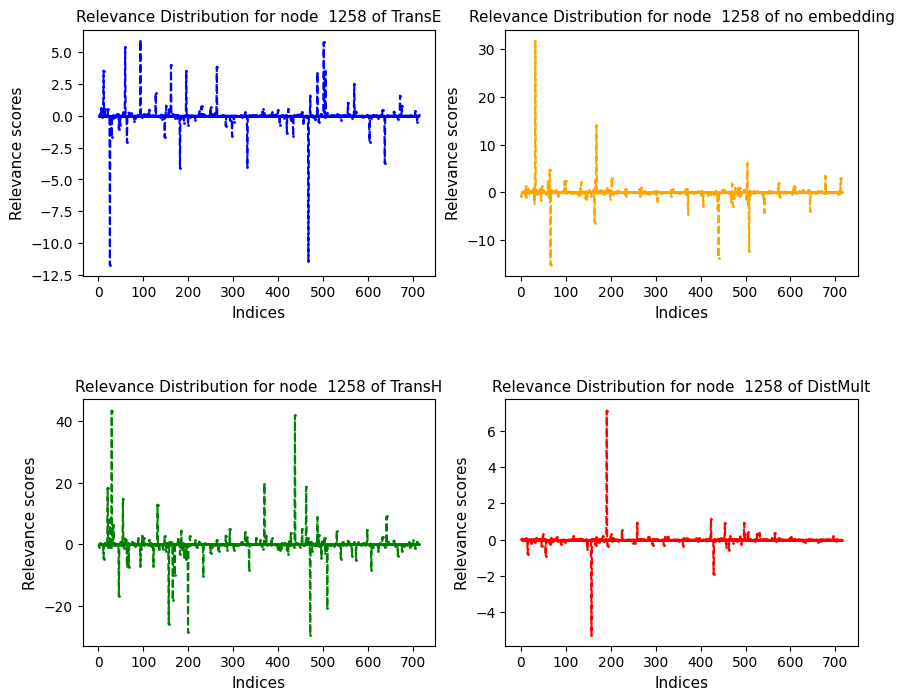

<Figure size 900x600 with 0 Axes>

relevances_edge_129.pt 129


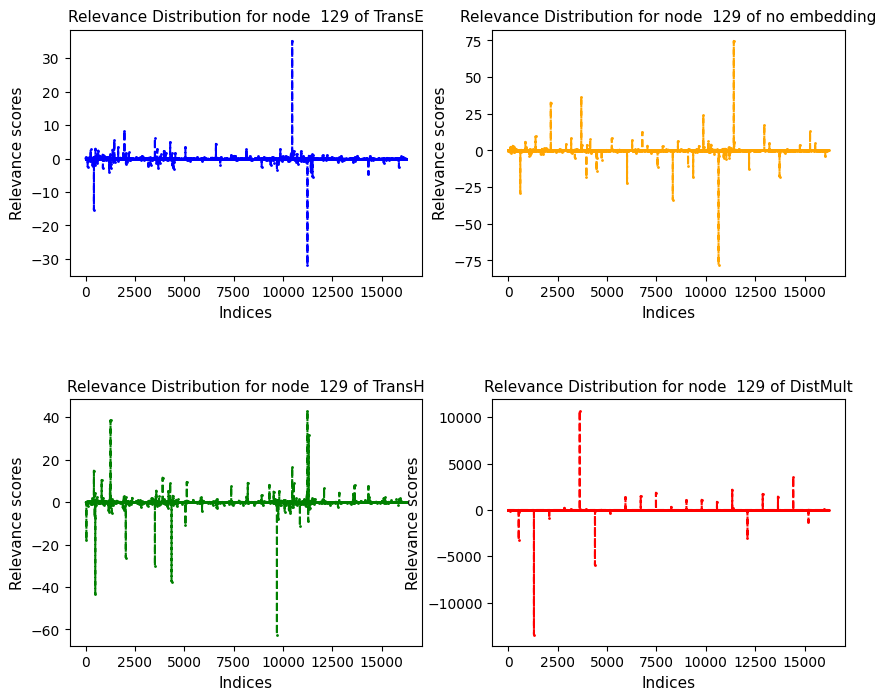

<Figure size 900x600 with 0 Axes>

relevances_edge_1324.pt 1324


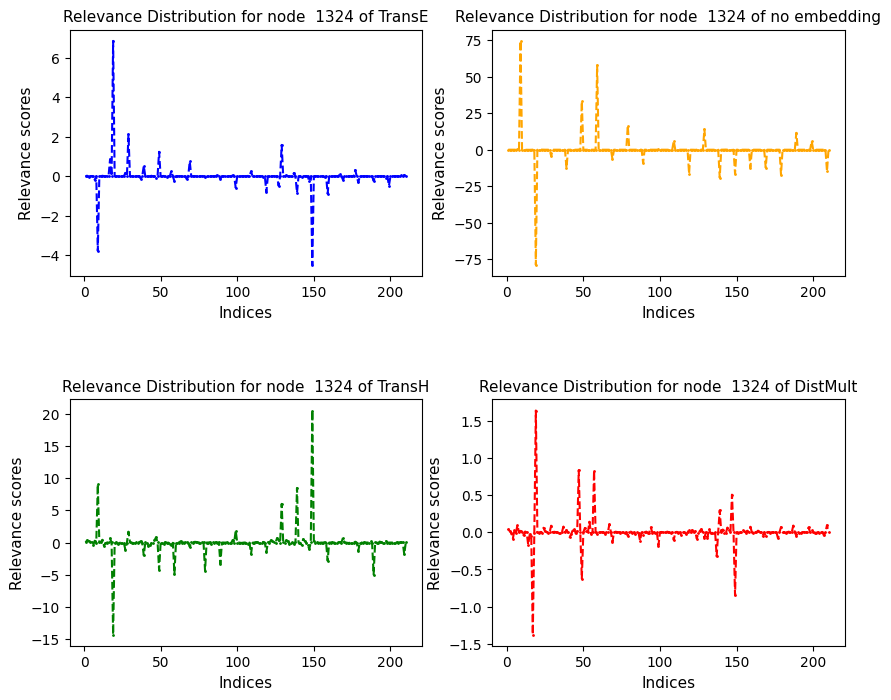

<Figure size 900x600 with 0 Axes>

relevances_edge_1349.pt 1349


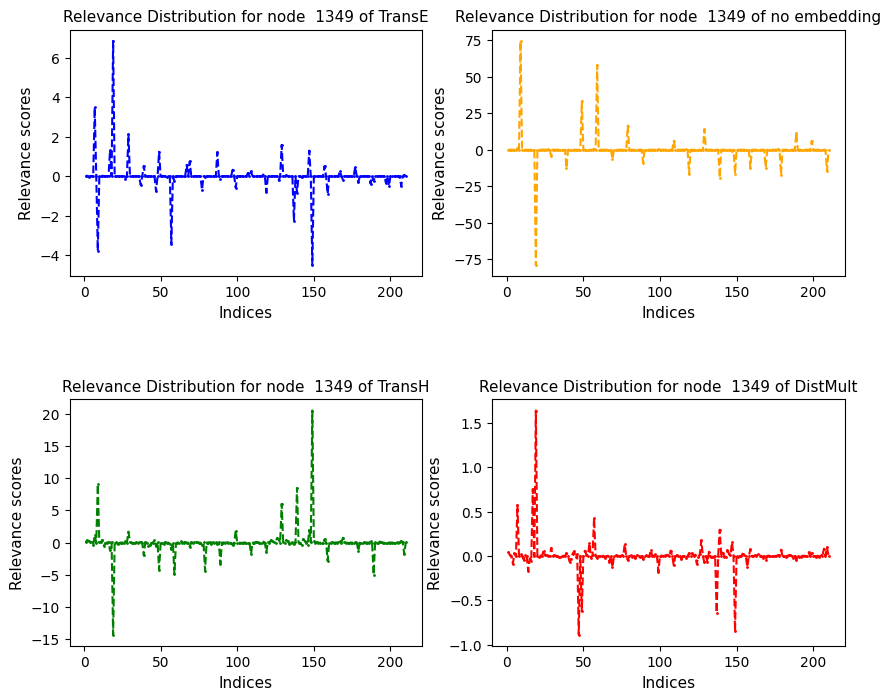

<Figure size 900x600 with 0 Axes>

relevances_edge_1374.pt 1374


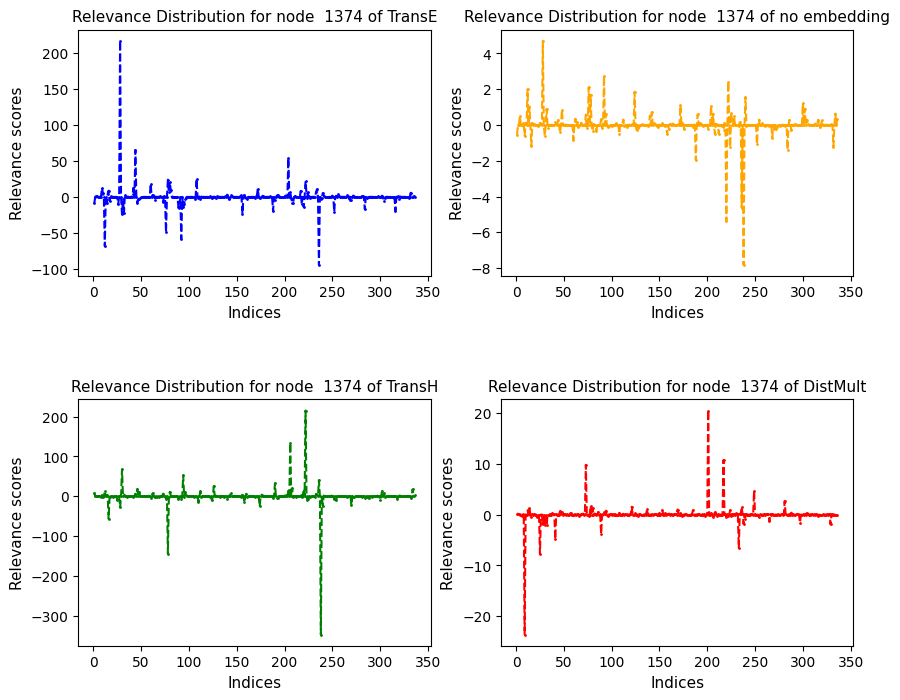

<Figure size 900x600 with 0 Axes>

relevances_edge_1501.pt 1501


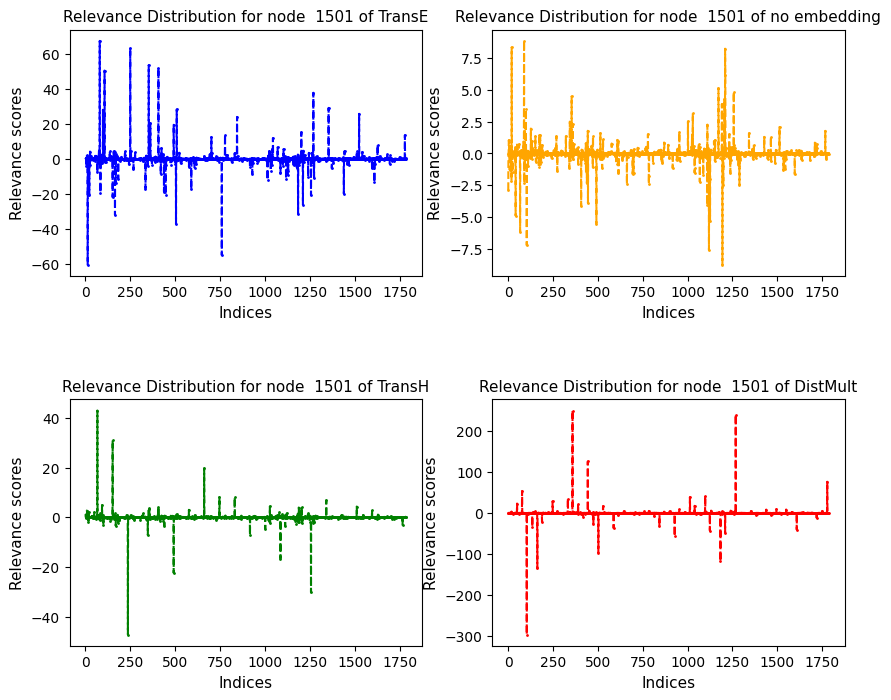

<Figure size 900x600 with 0 Axes>

relevances_edge_1668.pt 1668


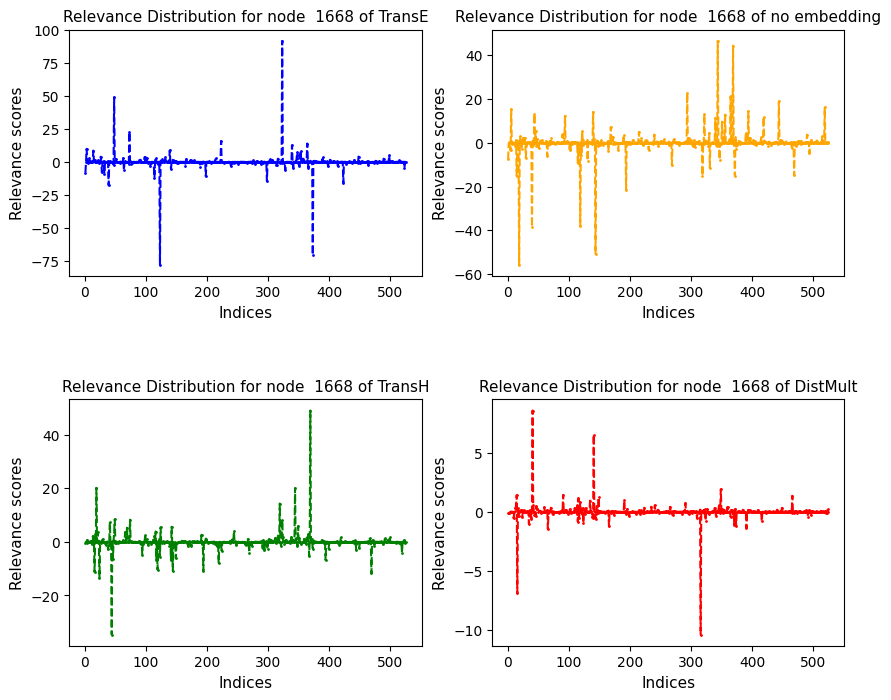

<Figure size 900x600 with 0 Axes>

relevances_edge_1758.pt 1758


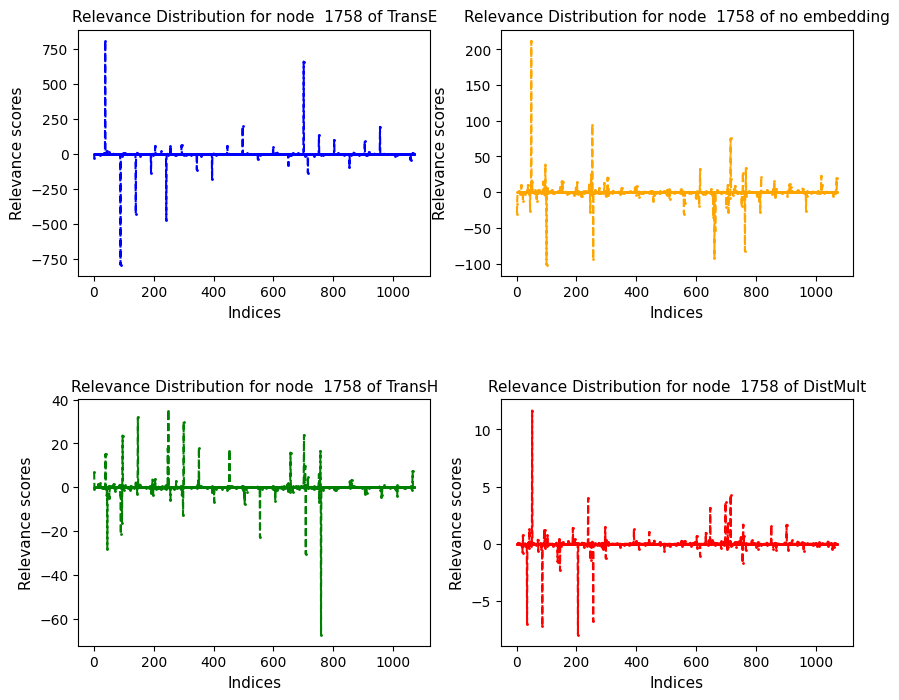

<Figure size 900x600 with 0 Axes>

relevances_edge_2170.pt 2170


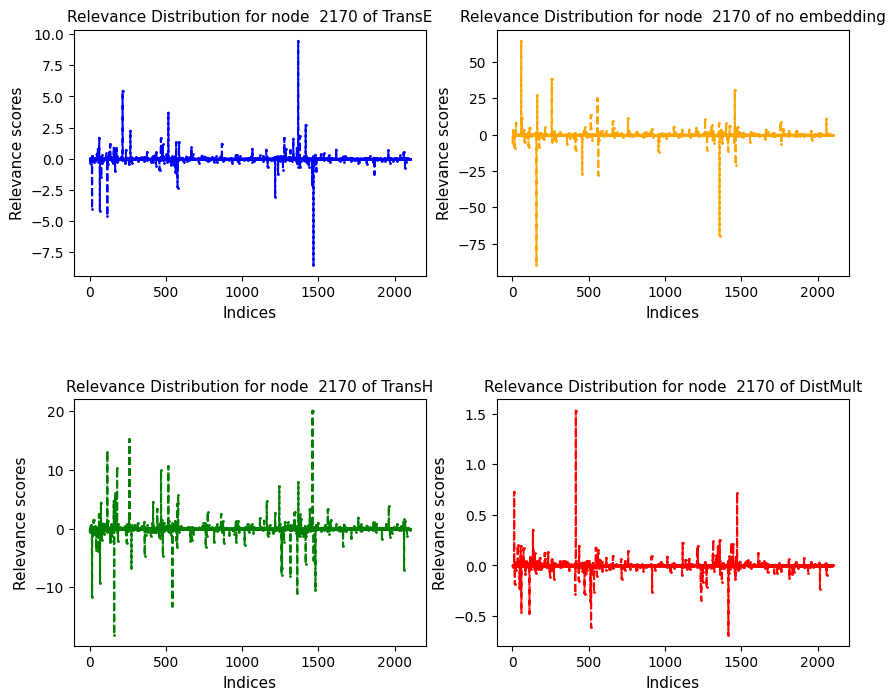

<Figure size 900x600 with 0 Axes>

relevances_edge_2179.pt 2179


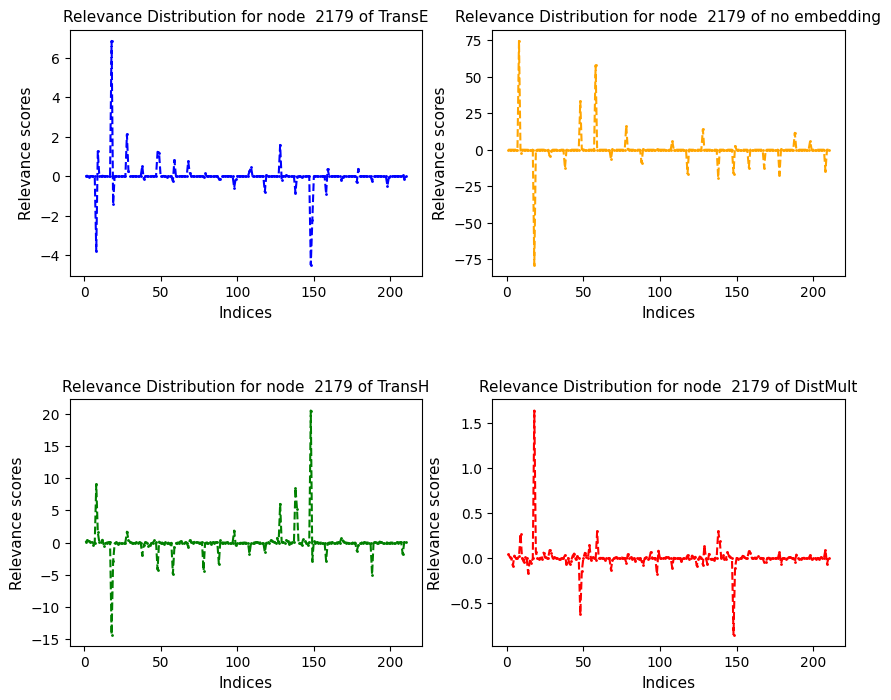

<Figure size 900x600 with 0 Axes>

relevances_edge_2199.pt 2199


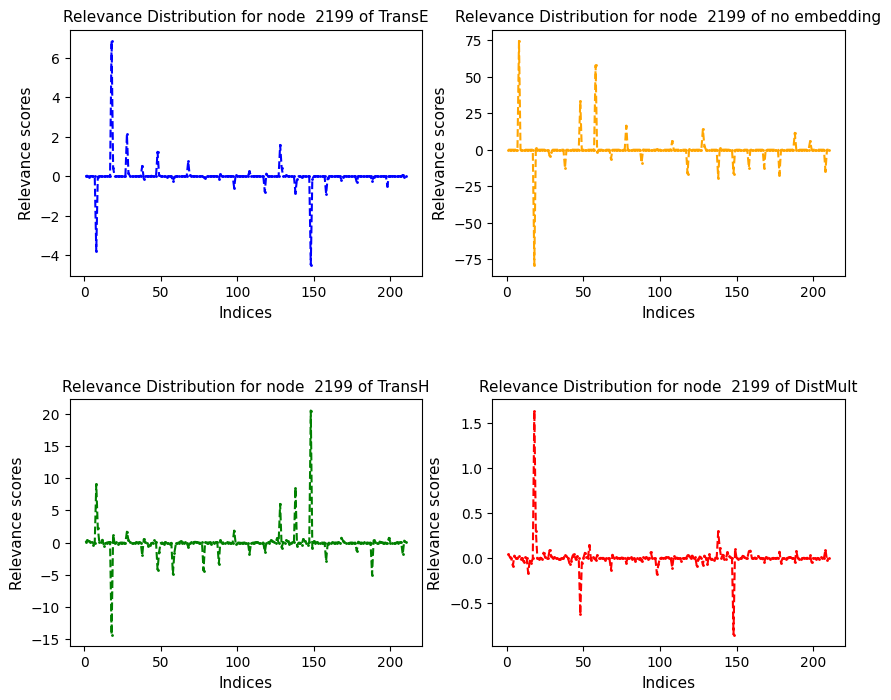

<Figure size 900x600 with 0 Axes>

relevances_edge_2200.pt 2200


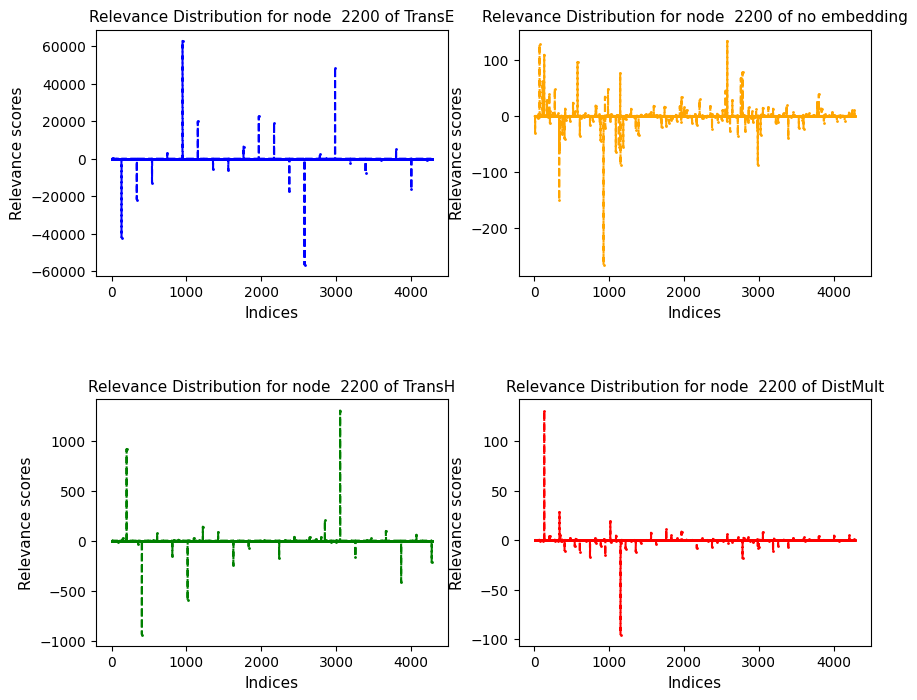

<Figure size 900x600 with 0 Axes>

relevances_edge_2321.pt 2321


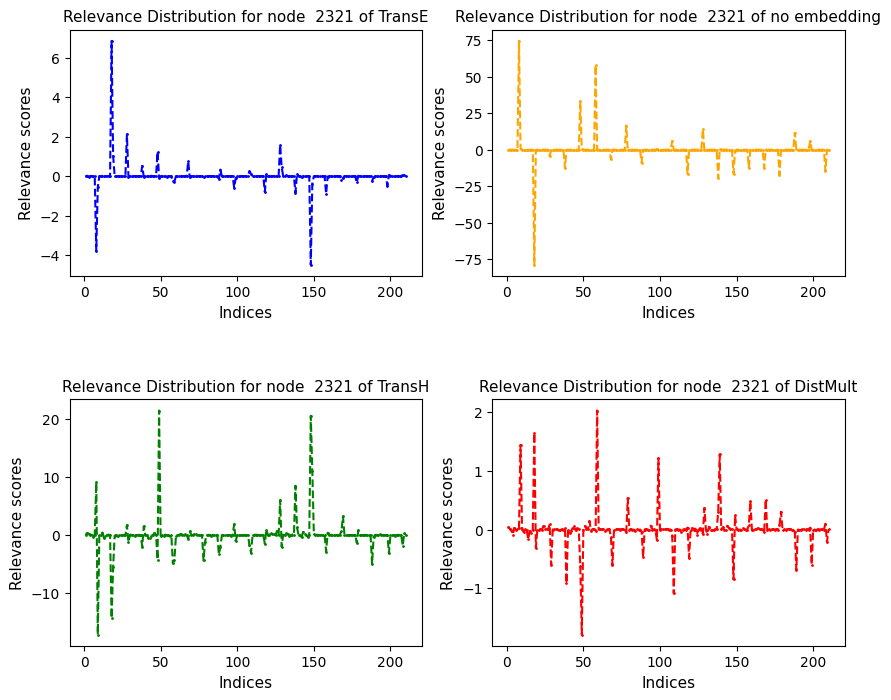

<Figure size 900x600 with 0 Axes>

relevances_edge_2380.pt 2380


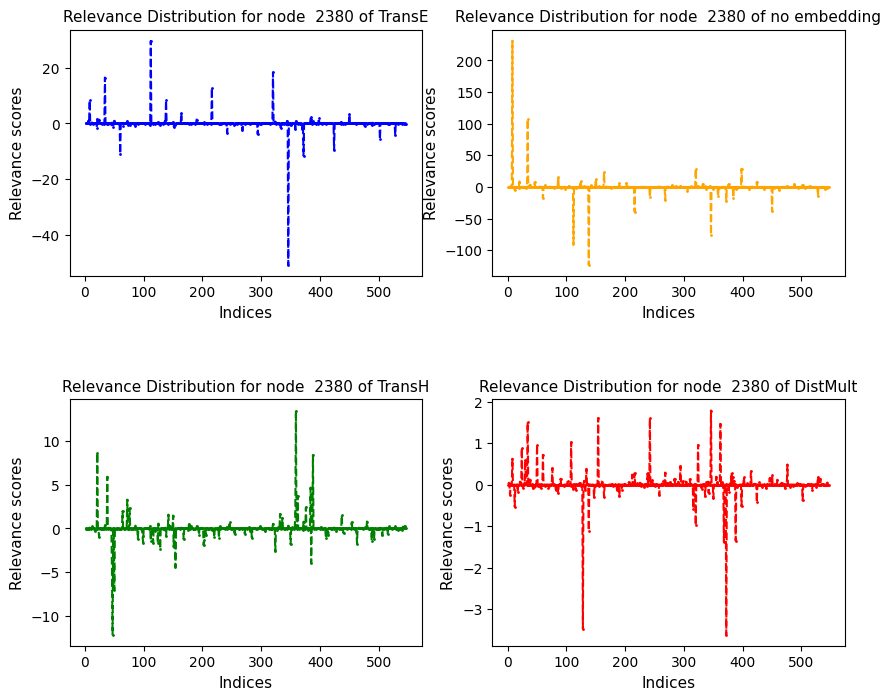

<Figure size 900x600 with 0 Axes>

relevances_edge_2433.pt 2433


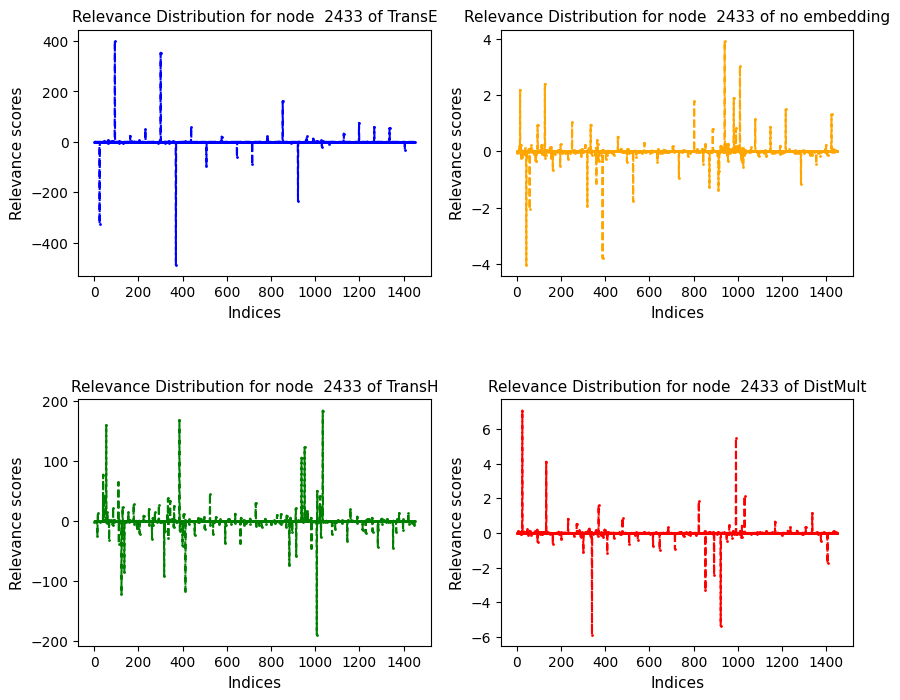

<Figure size 900x600 with 0 Axes>

relevances_edge_2500.pt 2500


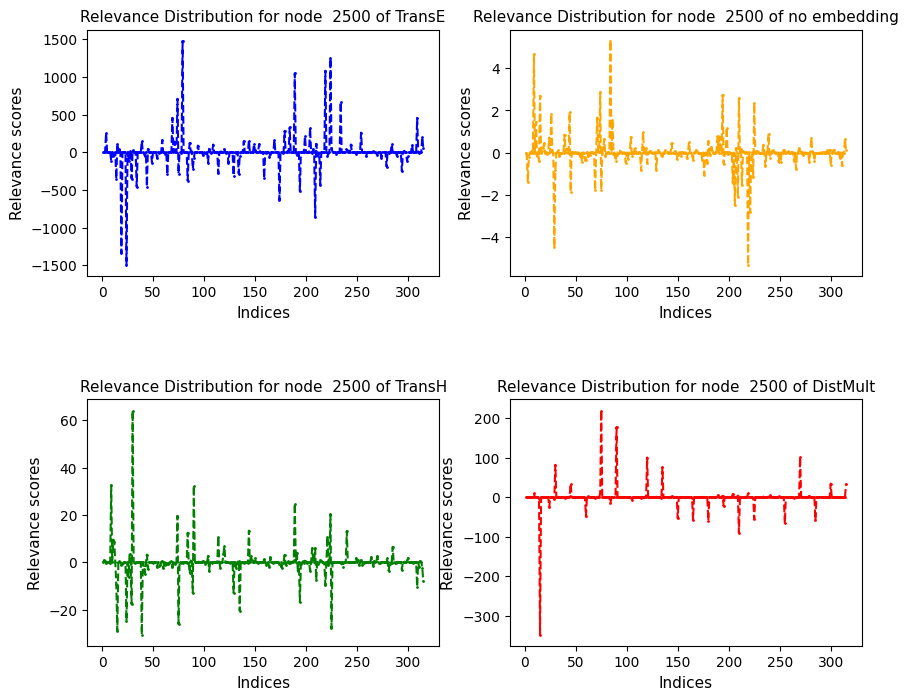

<Figure size 900x600 with 0 Axes>

relevances_edge_2516.pt 2516


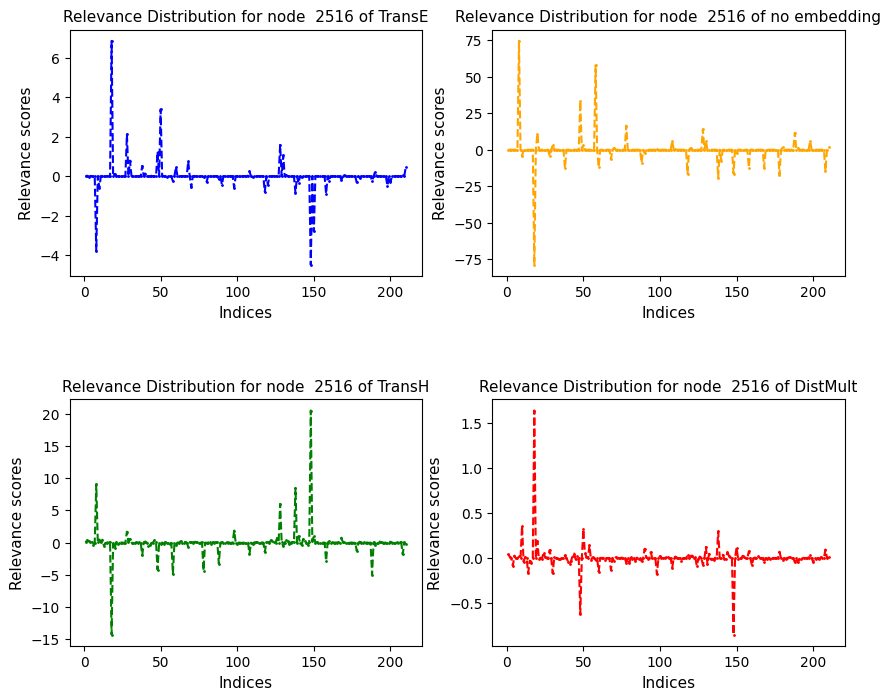

<Figure size 900x600 with 0 Axes>

relevances_edge_2534.pt 2534


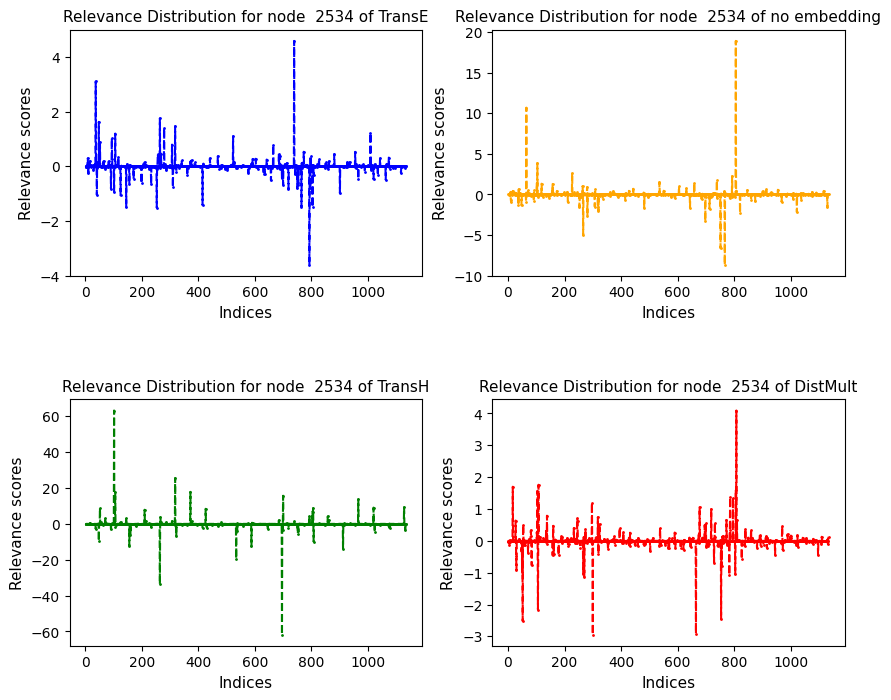

<Figure size 900x600 with 0 Axes>

relevances_edge_2639.pt 2639


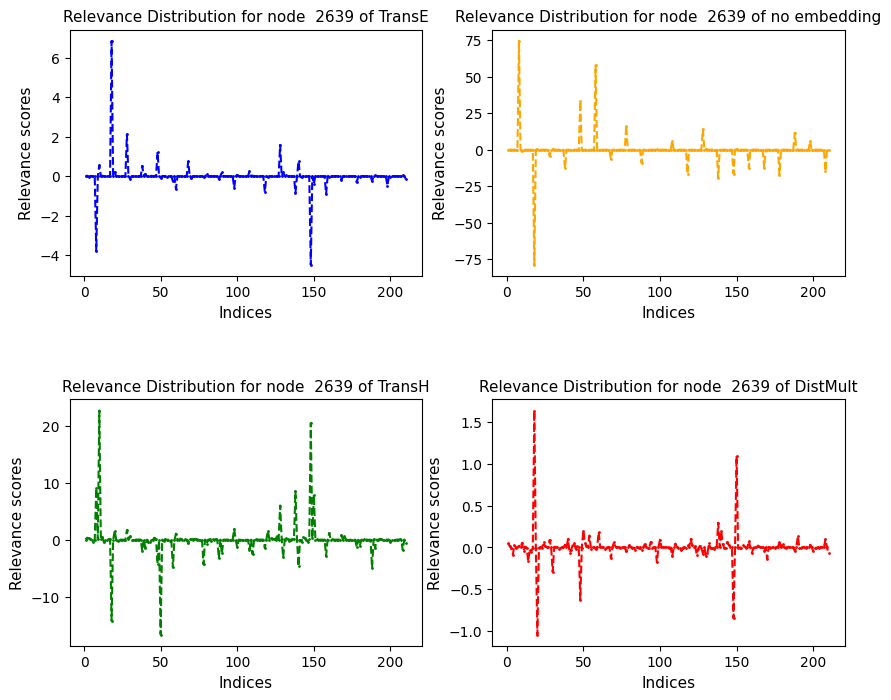

<Figure size 900x600 with 0 Axes>

relevances_edge_323.pt 323


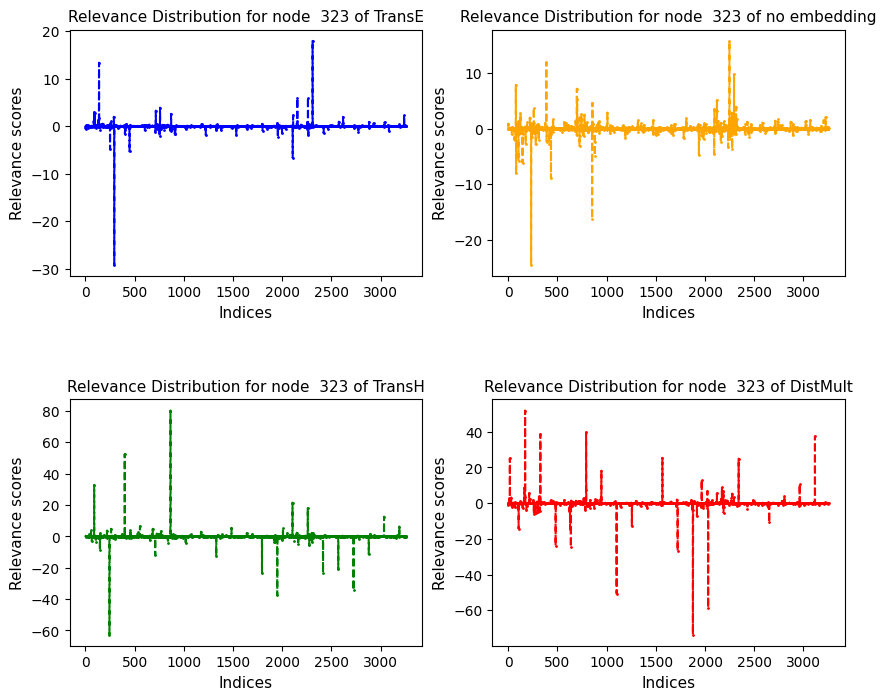

<Figure size 900x600 with 0 Axes>

relevances_edge_394.pt 394


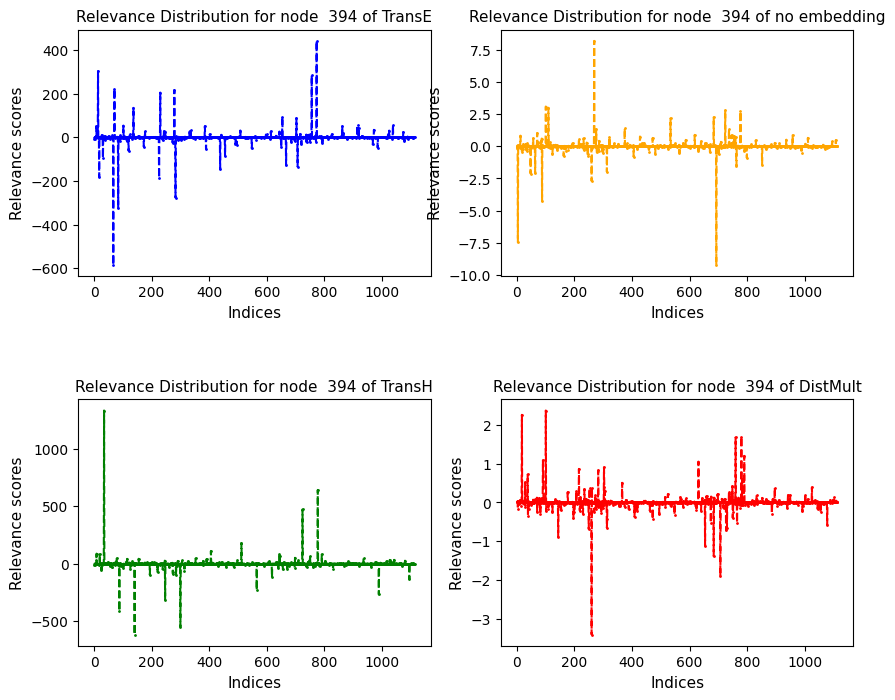

<Figure size 900x600 with 0 Axes>

relevances_edge_467.pt 467


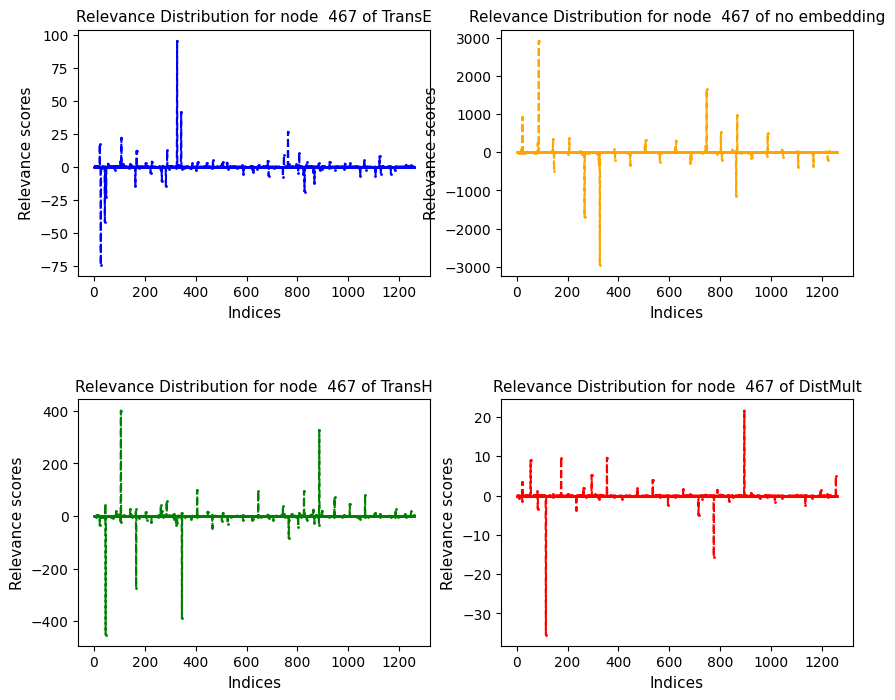

<Figure size 900x600 with 0 Axes>

relevances_edge_532.pt 532


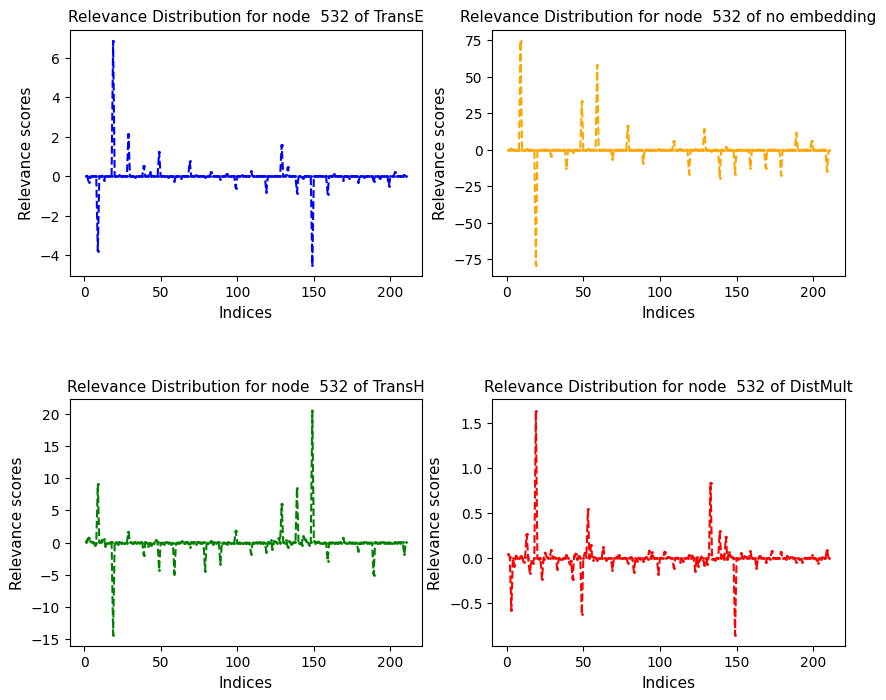

<Figure size 900x600 with 0 Axes>

relevances_edge_572.pt 572


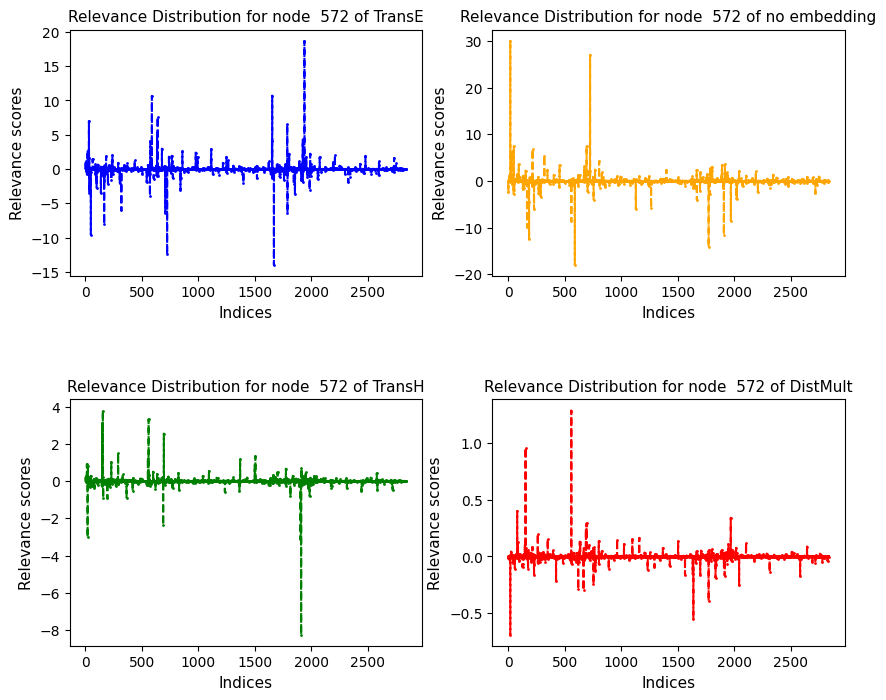

<Figure size 900x600 with 0 Axes>

relevances_edge_600.pt 600


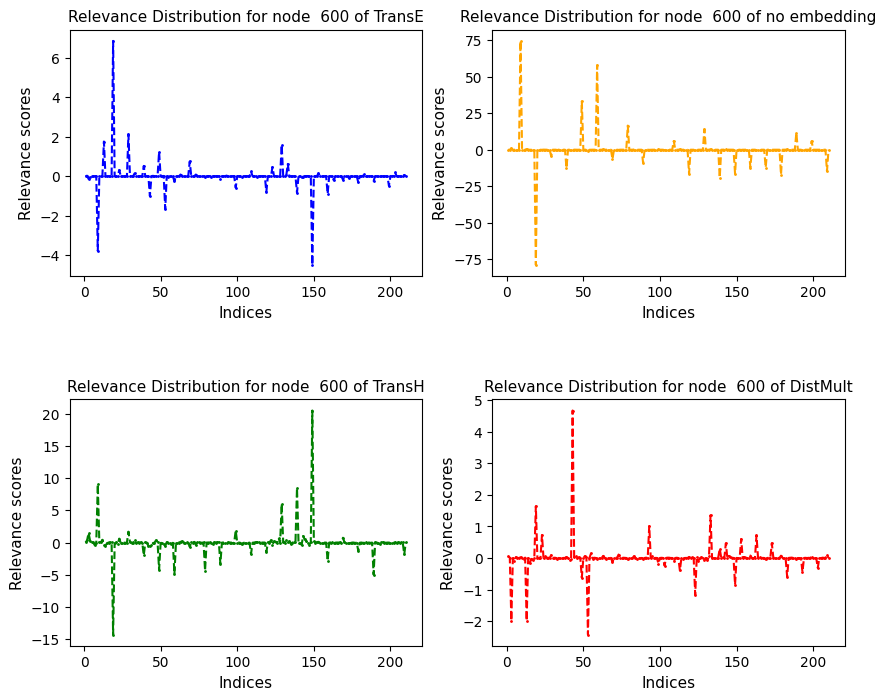

<Figure size 900x600 with 0 Axes>

relevances_edge_636.pt 636


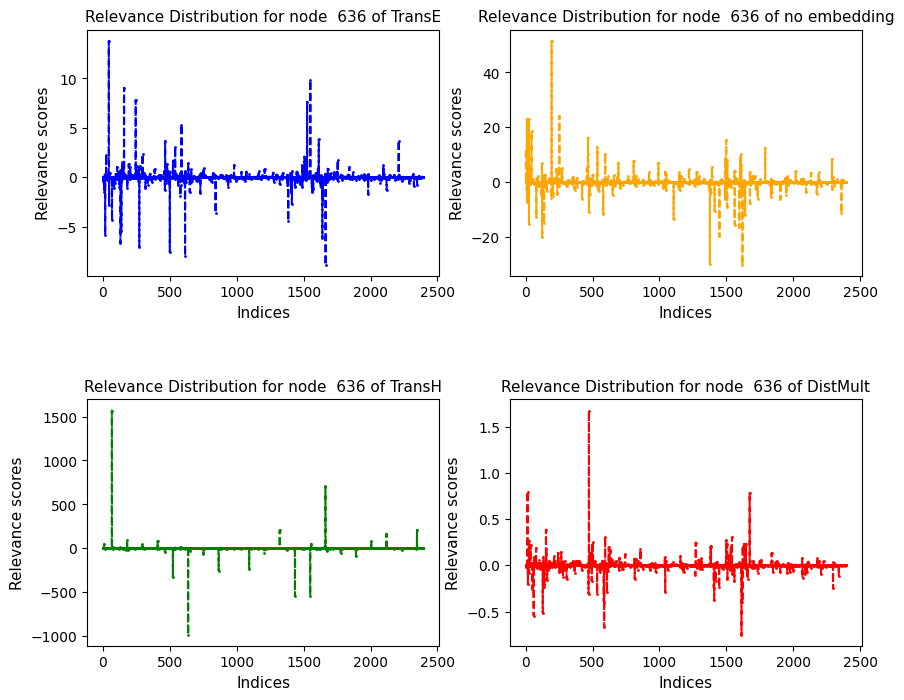

<Figure size 900x600 with 0 Axes>

relevances_edge_64.pt 64


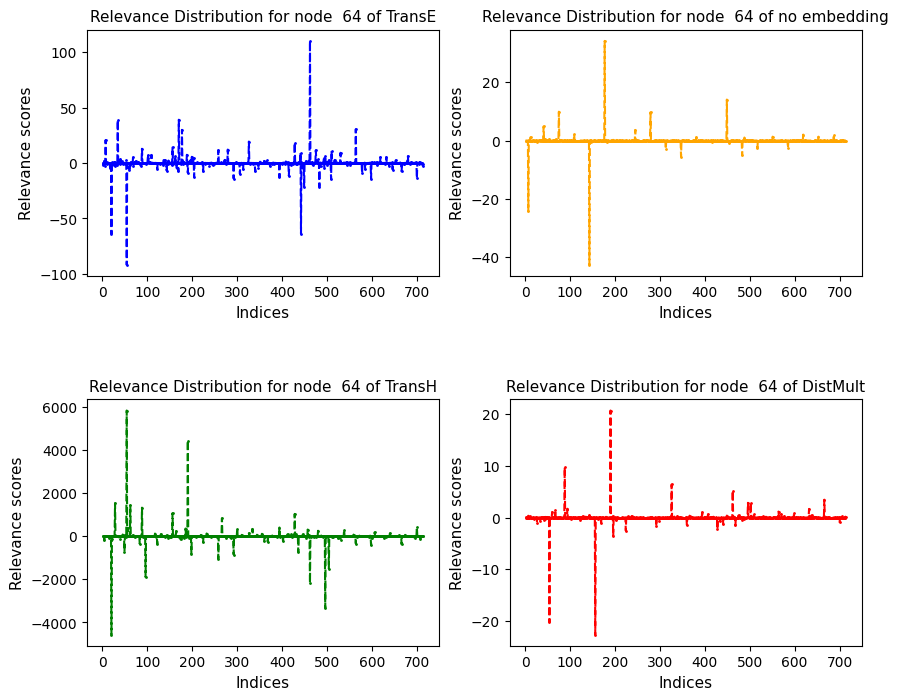

<Figure size 900x600 with 0 Axes>

relevances_edge_643.pt 643


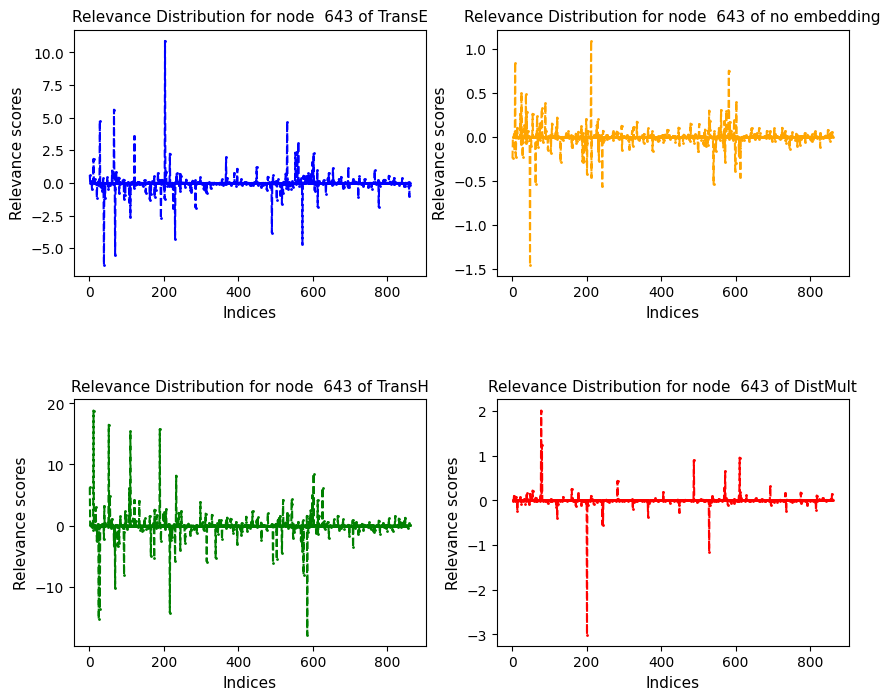

<Figure size 900x600 with 0 Axes>

relevances_edge_682.pt 682


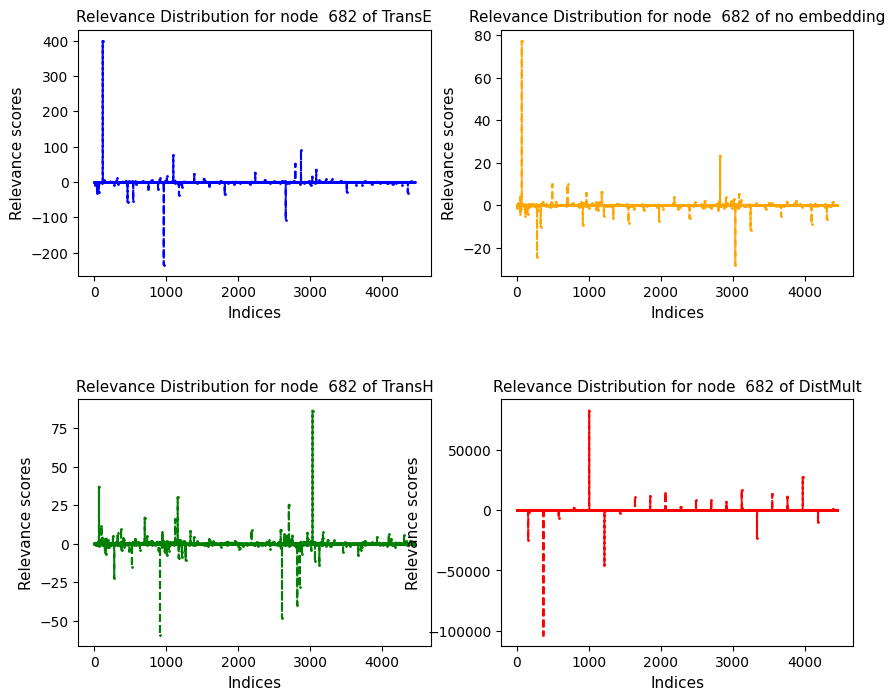

<Figure size 900x600 with 0 Axes>

relevances_edge_787.pt 787


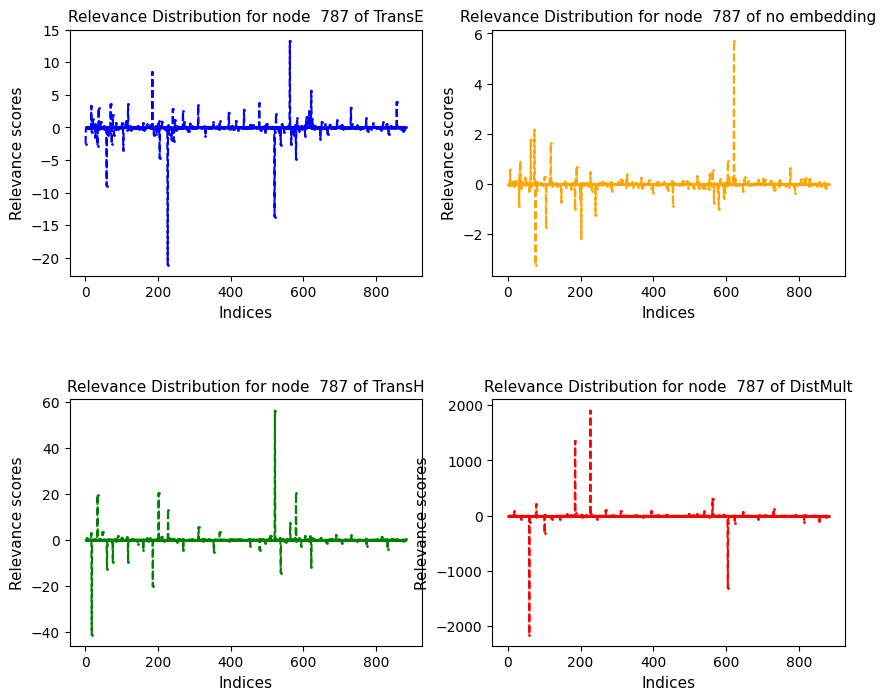

<Figure size 900x600 with 0 Axes>

relevances_edge_819.pt 819


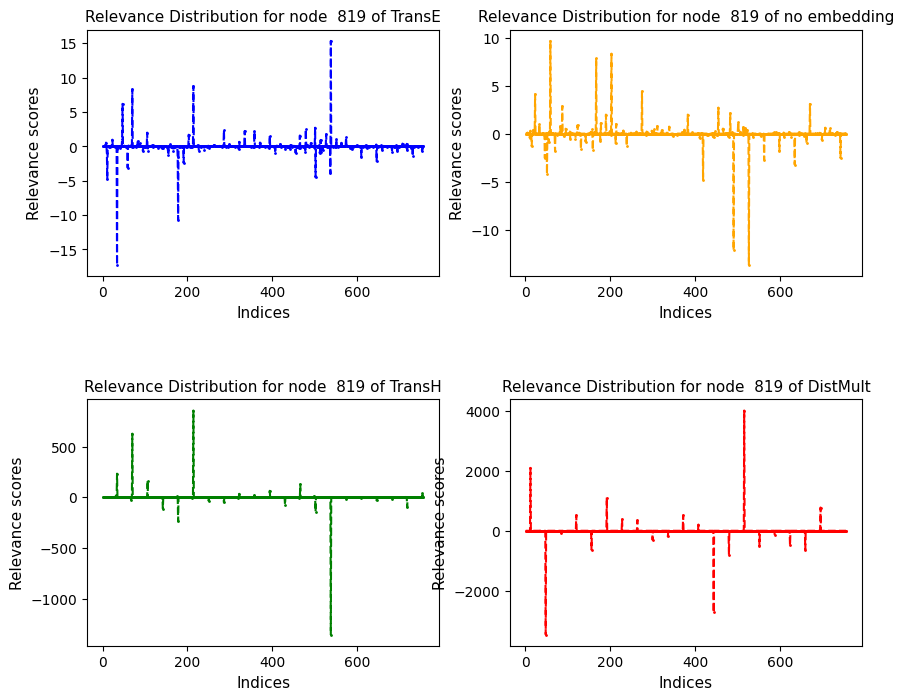

<Figure size 900x600 with 0 Axes>

relevances_edge_821.pt 821


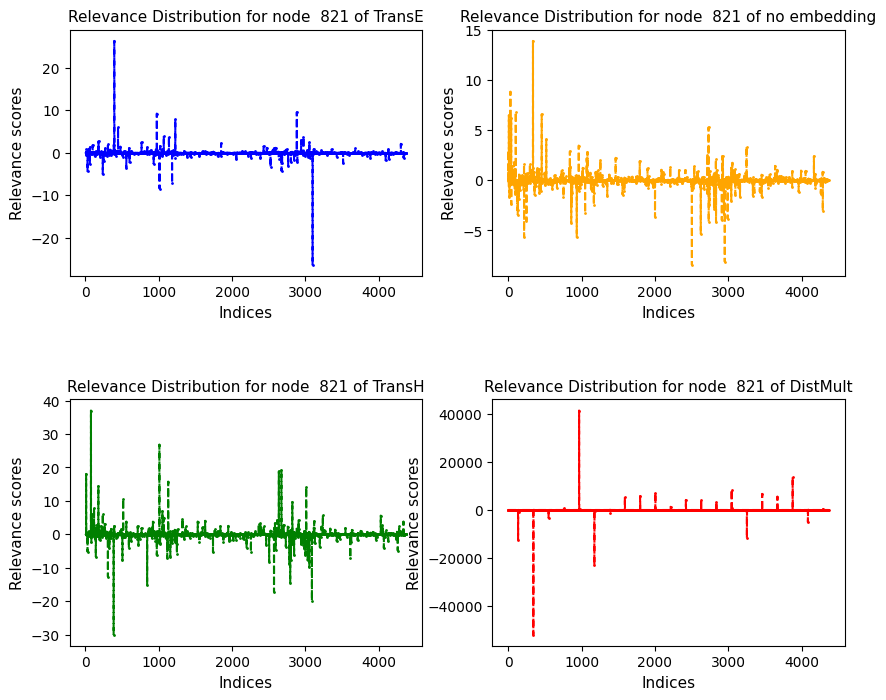

<Figure size 900x600 with 0 Axes>

relevances_edge_83.pt 83


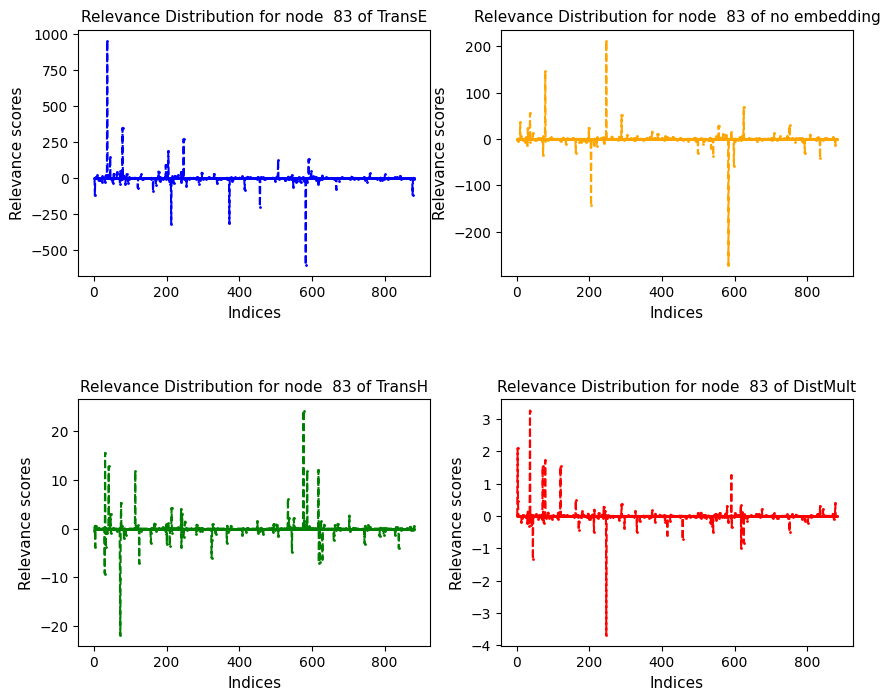

<Figure size 900x600 with 0 Axes>

relevances_edge_856.pt 856


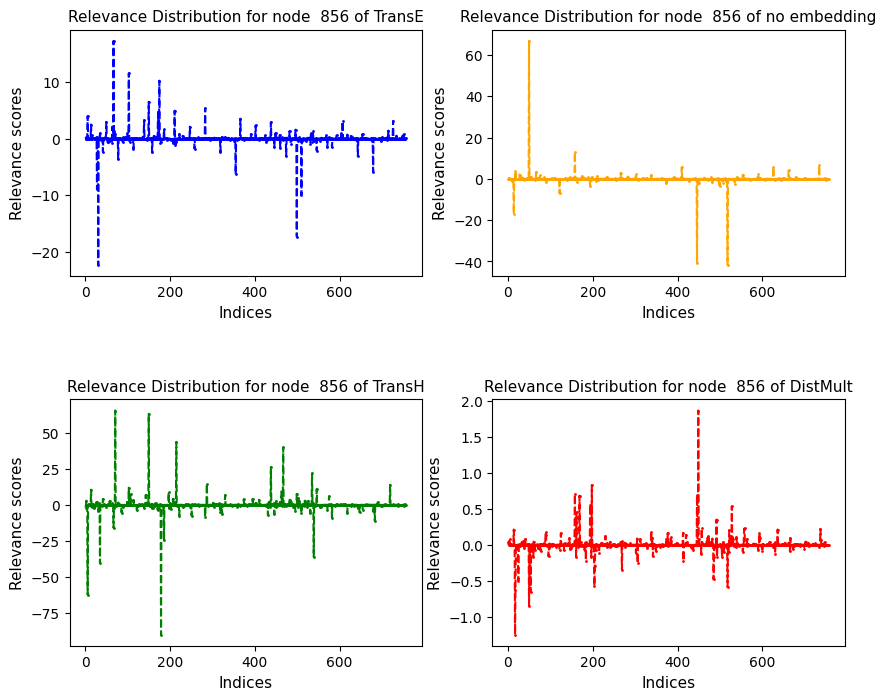

<Figure size 900x600 with 0 Axes>

In [31]:
path = 'out/MUTAG/RGAT_no_emb/relevances/'
path_dist = 'out/AIFB/RGAT_emb/DistMult/relevances/'
path_transe = 'out/AIFB/RGAT_emb/TransE/relevances/'
path_transh = 'out/AIFB/RGAT_emb/TransH/relevances/'
fil = os.listdir(path)
fil_transe = os.listdir('out/AIFB/RGAT_emb/TransE/relevances/')
fil_transh = os.listdir('out/AIFB/RGAT_emb/TransH/relevances/')
fil_dist = os.listdir('out/AIFB/RGAT_emb/DistMult/relevances/')
rel_no = [file for file in fil if file.startswith("relevances_edge_")]
rel_transe = [file for file in fil if file.startswith("relevances_edge_")]
rel_transh = [file for file in fil if file.startswith("relevances_edg_")]
rel_dist = [file for file in fil if file.startswith("relevances_edge_")]

dfs = []
for rel in rel_transe:
    rte = torch.load(path_transe+rel).to_dense().detach().numpy()
    node_name = rel.split('edge_')[1].split('.')[0]
    print(rel, node_name)
    rno = torch.load(path+rel).to_dense().detach().numpy()
    rth = torch.load(path_transh+rel).to_dense().detach().numpy()
    rdi = torch.load(path_dist+rel).to_dense().detach().numpy()
    XX,YY = np.meshgrid(np.arange(rno.shape[1]),np.arange(rno.shape[0]))
    table = np.vstack((rte.ravel(),rno.ravel(),rth.ravel(), rdi.ravel(),XX.ravel(),YY.ravel())).T
    table = table[(table[:,0] != 0) & (table[:,1] != 0) & (table[:,2] != 0) & (table[:,3] != 0)]

    indices = np.arange(1, len(table[:,0]) + 1)
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8), gridspec_kw={'hspace': 0.5})
    # Create a line plot with different line styles and markers
    plt.figure(figsize=(9, 6))
    axes[0,0].plot(indices, table[:,0], color='blue', linestyle='--', marker='.', markersize=2, label='Relevance TransE')
    axes[0,1].plot(indices, table[:,1], color='orange', linestyle='--', marker='.', markersize=2, label='Relevance no embedding')
    axes[1,0].plot(indices, table[:,2], color='green', linestyle='--', marker='.', markersize=2, label='Relevance TransH')
    axes[1,1].plot(indices, table[:,3], color='red', linestyle='--', marker='.', markersize=2, label='Relevance DistMult')
    emb_type = ['TransE', 'no embedding', 'TransH', 'DistMult']
    plt.tight_layout()
    for i, ax in enumerate(axes.flatten()):
        ax.set_xlabel('Indices', fontsize=11)
        ax.set_ylabel('Relevance scores', fontsize=11)
        ax.set_title('Relevance Distribution for node  {} of {}'.format(node_name, emb_type[i]), fontsize=11)


    plt.show()



# TRANS H RGCN

In [45]:
model = 'TransH'
csv = readallcsvinpath('out/MUTAG/RGAT_emb/')
pred_before = torch.load('out/MUTAG/RGAT_emb/'+model+'/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/MUTAG/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/MUTAG/RGAT_emb/'+model+'/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/MUTAG/RGAT_emb/'+model+'/i2r.pkl')

test_list = pd.read_pickle('out/MUTAG/RGAT_emb/'+model+'/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
path = 'out/MUTAG/RGAT_emb/'+model+'/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[2])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before

http://dl-learner.org/carcinogenesis#d329_66
12
13
13
13
13
13
13
13
13
13
13
13
13
12 816 156
[ 4  6 10 17 18 23 26 33 39 42 48 52 65]
0.19117647058823528


(array([0, 1], dtype=int64), array([52, 16], dtype=int64))

In [46]:
diff[0]-diff[3]

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.

12
0
pred_after11621adapt_11621_1.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


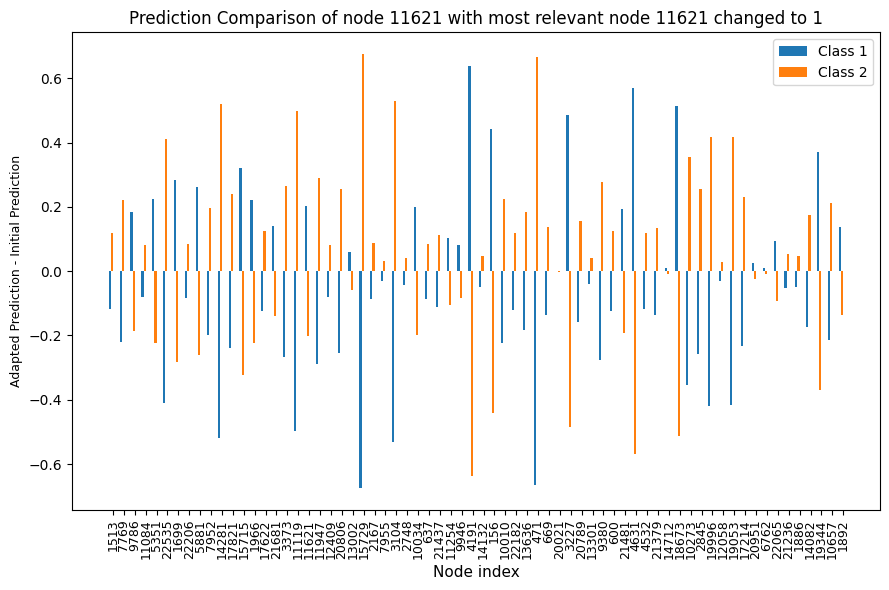

1
pred_after11621adapt_5411_1.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.6913384  0.30866158]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


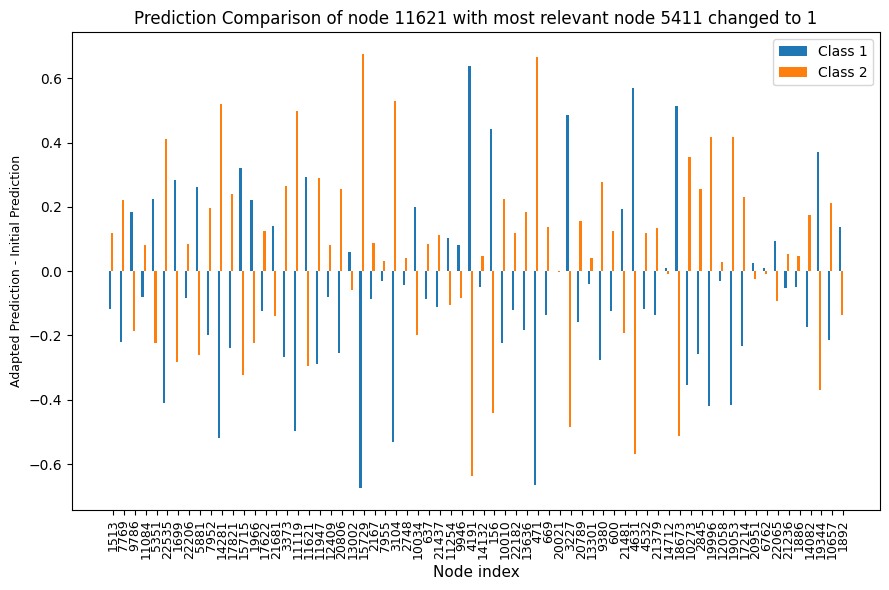

2
pred_after11621adapt_tensor([    0, 19173])_5.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


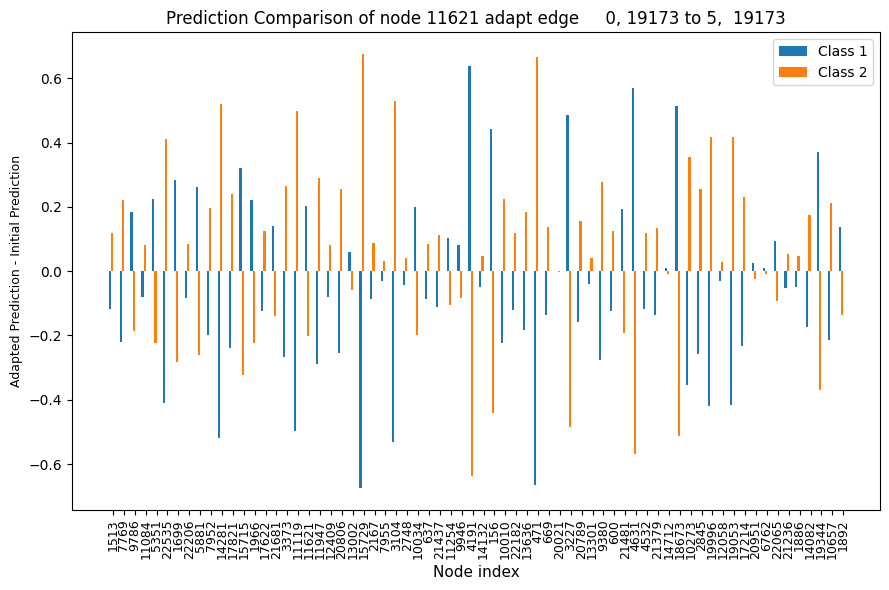

3
pred_after11621adapt_tensor([    3, 19173])_6.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


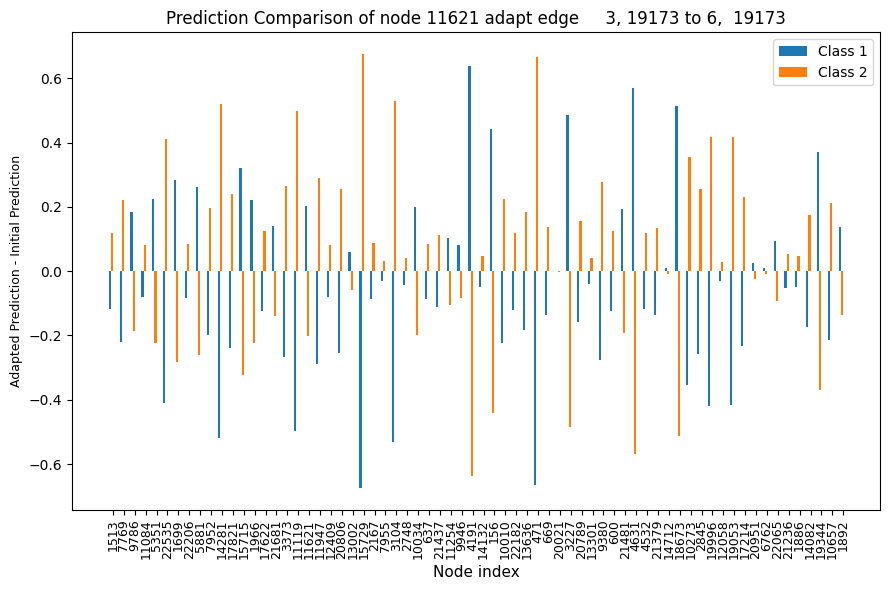

4
pred_after13002adapt_tensor([    0, 18316])_5.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


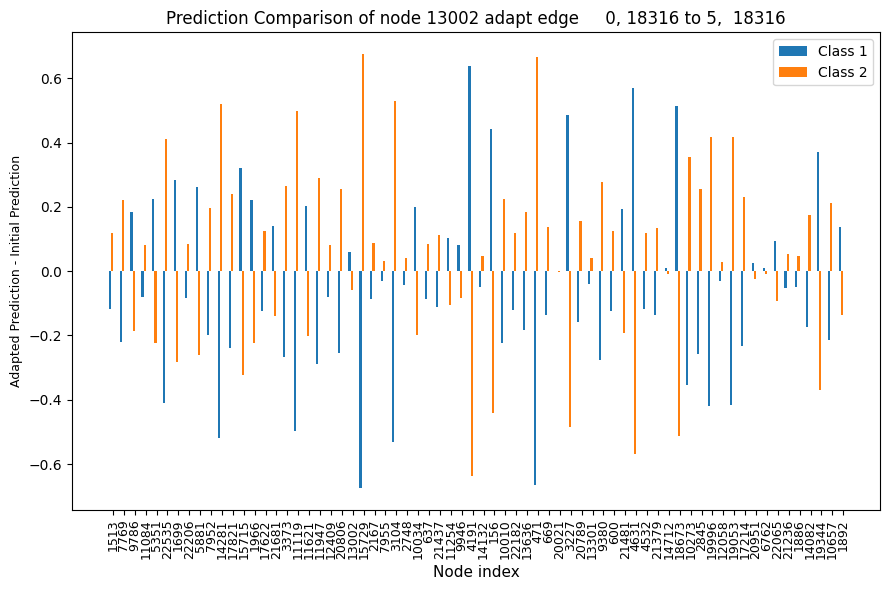

5
pred_after13002adapt_tensor([    1, 18316])_5.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


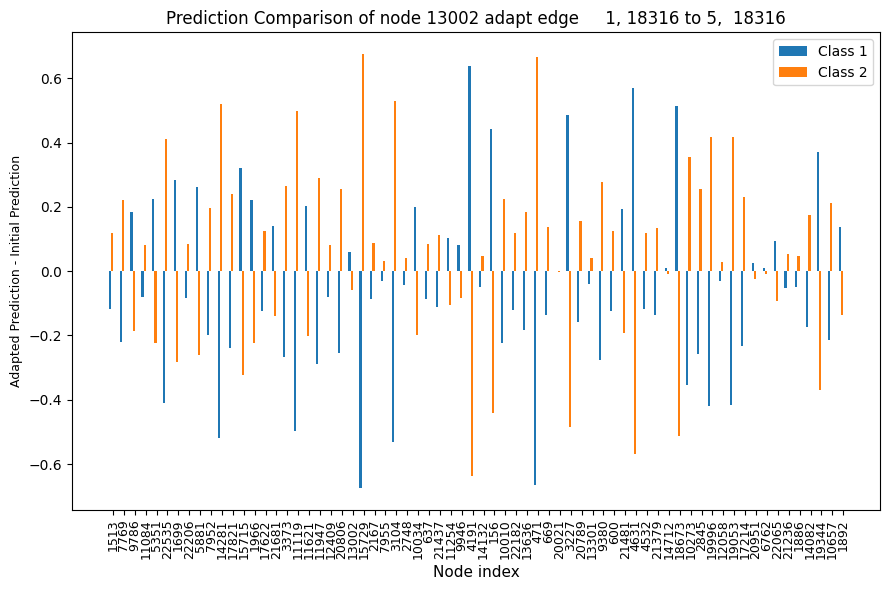

6
pred_after2167adapt_2167_7.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


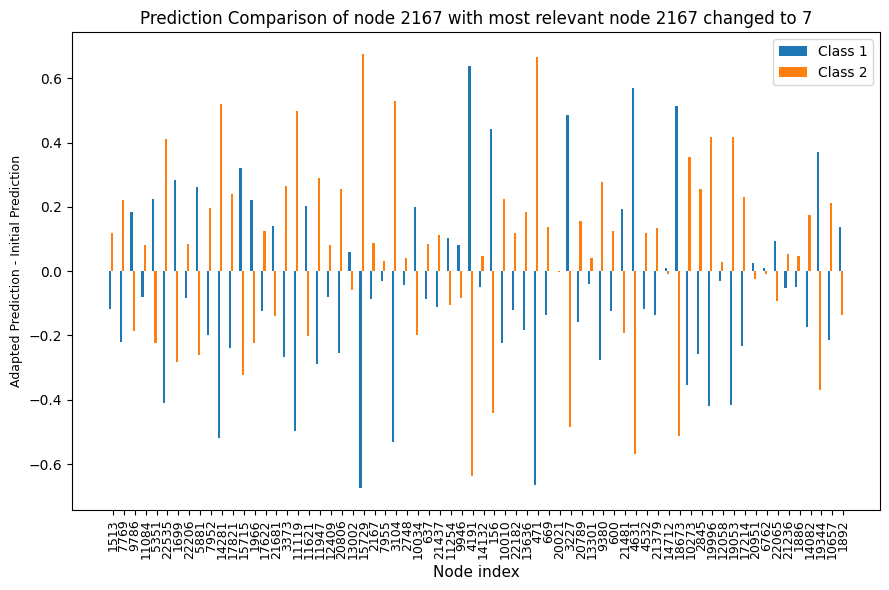

7
pred_after2167adapt_9261_0.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


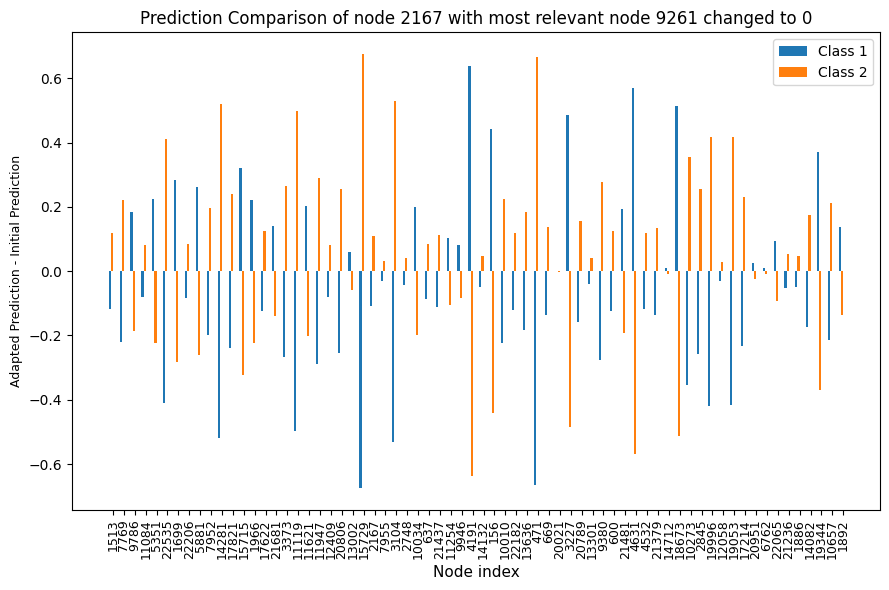

8
pred_after22065adapt_14224_7.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


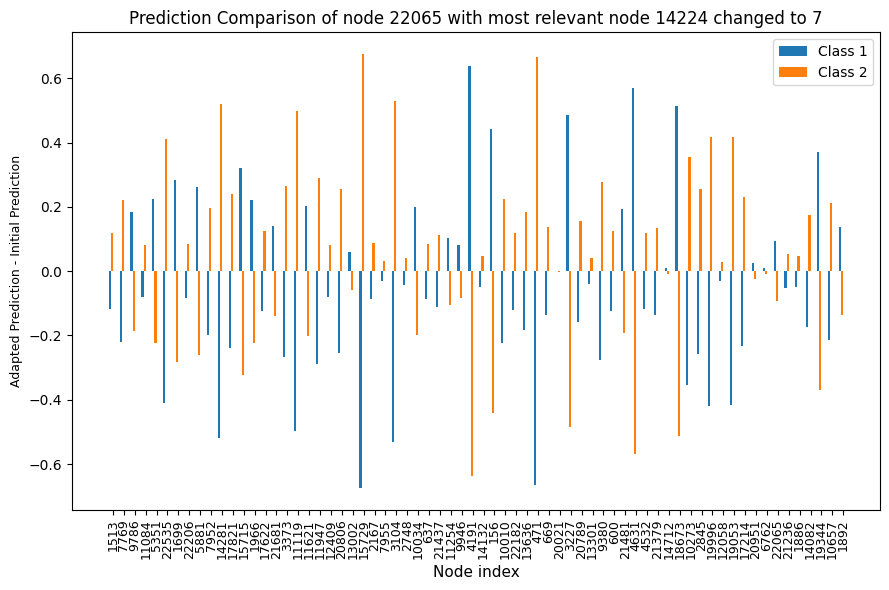

9
pred_after22065adapt_727_1.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


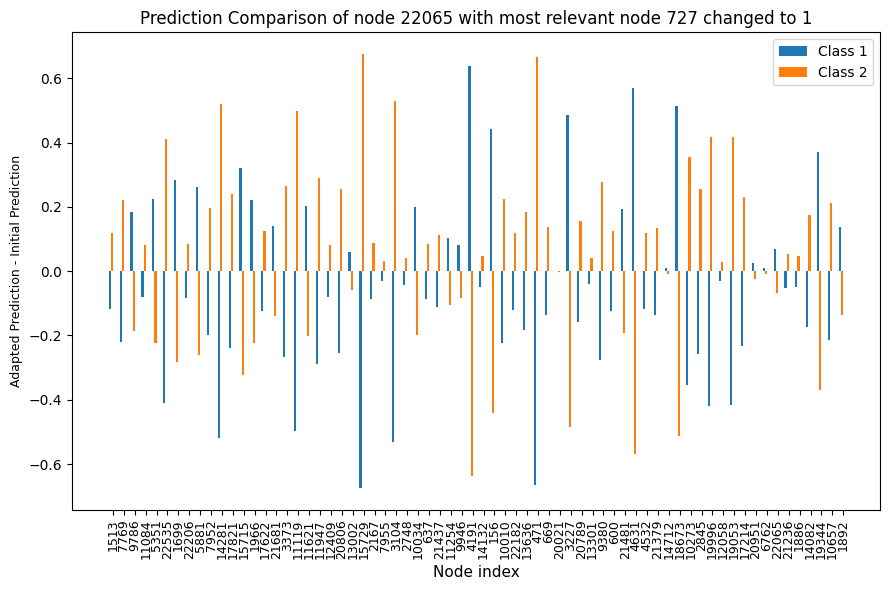

10
pred_after22065adapt_tensor([    0, 10488])_1.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


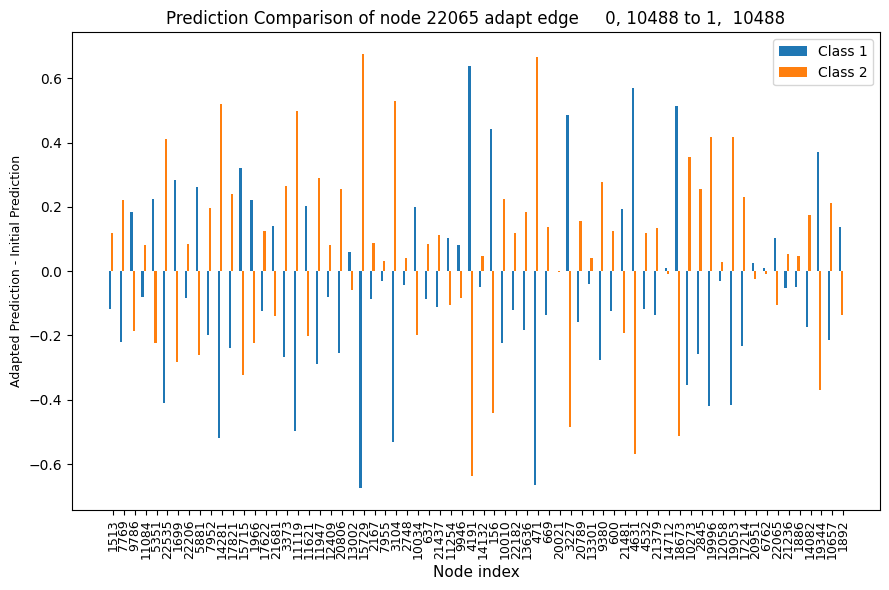

11
pred_after22065adapt_tensor([    0, 18316])_1.pt
Prediction Score before:  [[2.87319481e-01 7.12680519e-01]
 [3.73136520e-01 6.26863480e-01]
 [9.99766052e-01 2.33960425e-04]
 [9.30954933e-01 6.90450743e-02]
 [3.97201657e-01 6.02798343e-01]
 [9.78789985e-01 2.12100204e-02]
 [9.99928117e-01 7.18358715e-05]
 [1.36873275e-02 9.86312687e-01]
 [9.85262990e-01 1.47369672e-02]
 [1.03911243e-01 8.96088779e-01]
 [5.10511957e-02 9.48948801e-01]
 [1.47955520e-02 9.85204458e-01]
 [1.81633130e-01 8.18366826e-01]] Prediction Score after:  [[0.5114192  0.48858082]
 [0.6566418  0.34335825]
 [0.48038694 0.519613  ]
 [0.43276858 0.5672314 ]
 [0.599789   0.40021098]
 [0.30366477 0.6963352 ]
 [0.46982068 0.5301794 ]
 [0.6504599  0.34954005]
 [0.31979033 0.68020964]
 [0.58806974 0.41193026]
 [0.62080306 0.37919697]
 [0.52728015 0.47271985]
 [0.5506464  0.4493536 ]]
5351
(array([0, 1], dtype=int64), array([52, 16], dtype=int64)) (array([0, 1], dtype=int64), array([55, 13], dtype=int64))


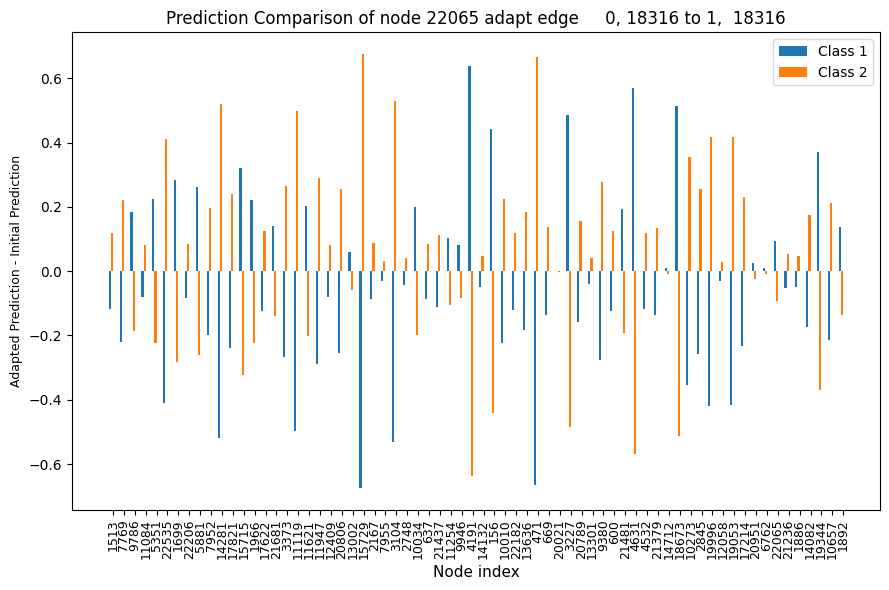

In [47]:
path = 'out/MUTAG/RGAT_emb/'+model+'/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(68)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    #plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    #plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=9)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=9)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()

# RGAT DistMult

In [51]:
model = 'DistMult'
csv = readallcsvinpath('out/MUTAG/RGAT_emb/')
pred_before = torch.load('out/MUTAG/RGAT_emb/'+model+'/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/MUTAG/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/MUTAG/RGAT_emb/'+model+'/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/MUTAG/RGAT_emb/'+model+'/i2r.pkl')

test_list = pd.read_pickle('out/MUTAG/RGAT_emb/'+model+'/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
path = 'out/MUTAG/RGAT_emb/'+model+'/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[1])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before

http://dl-learner.org/carcinogenesis#d329_66
12
48
48
48
48
48
48
48
48
48
48
48
48
12 816 576
[ 0  1  3  5  7  8  9 10 11 12 14 15 16 17 19 20 22 23 24 26 27 28 29 30
 31 34 36 37 38 39 40 41 43 45 49 50 51 53 54 55 56 57 58 59 62 63 64 66]
0.7058823529411765


(array([0, 1], dtype=int64), array([47, 21], dtype=int64))

12
0
pred_after11621adapt_tensor([    0, 14017])_5.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-

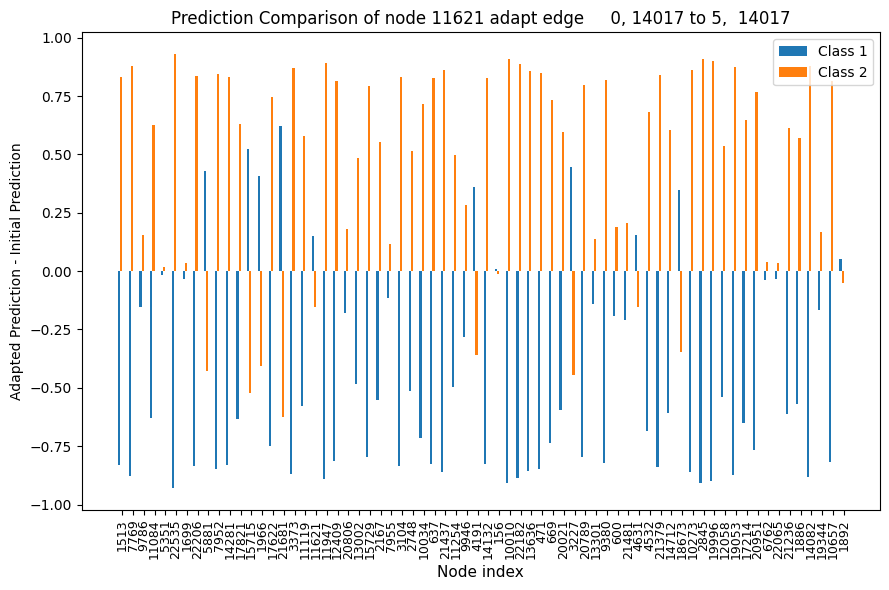

1
pred_after11621adapt_tensor([    1, 14017])_2.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]

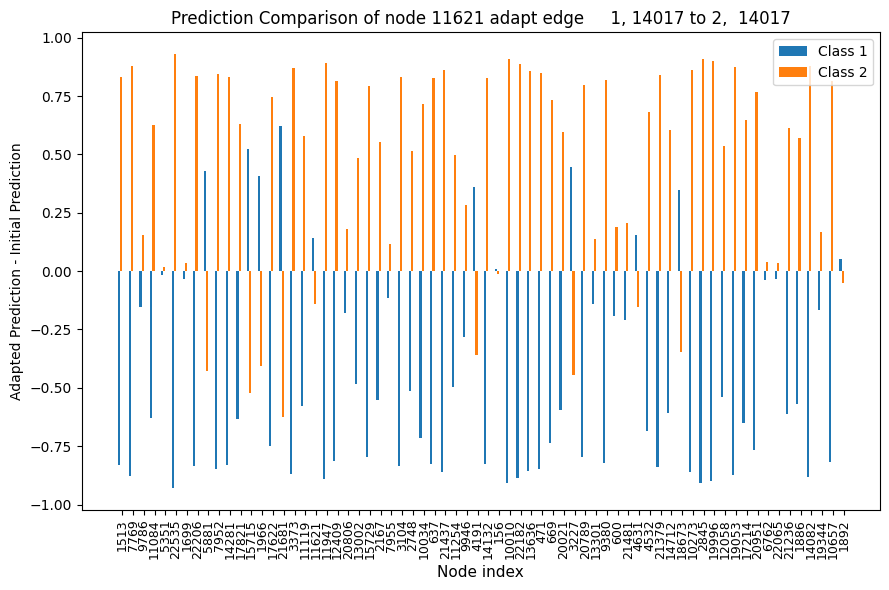

2
pred_after1892adapt_14713_3.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]
 [9.97435272e-01 

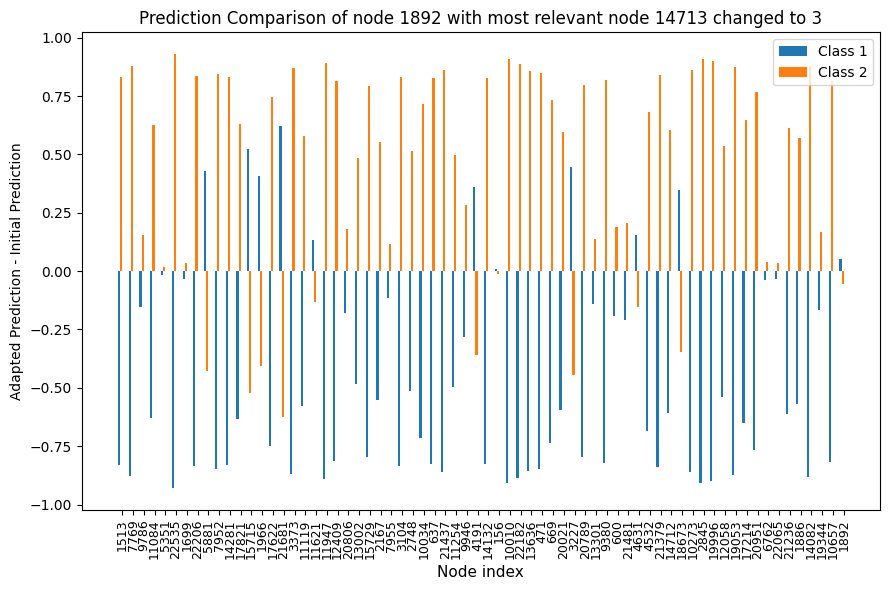

3
pred_after1892adapt_9977_6.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]
 [9.97435272e-01 2

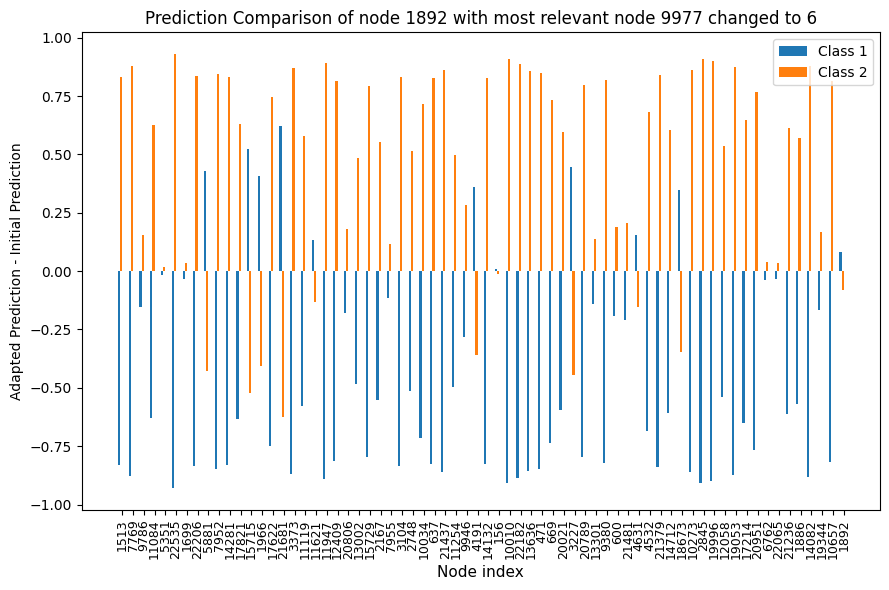

4
pred_after19344adapt_4666_1.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]
 [9.97435272e-01 

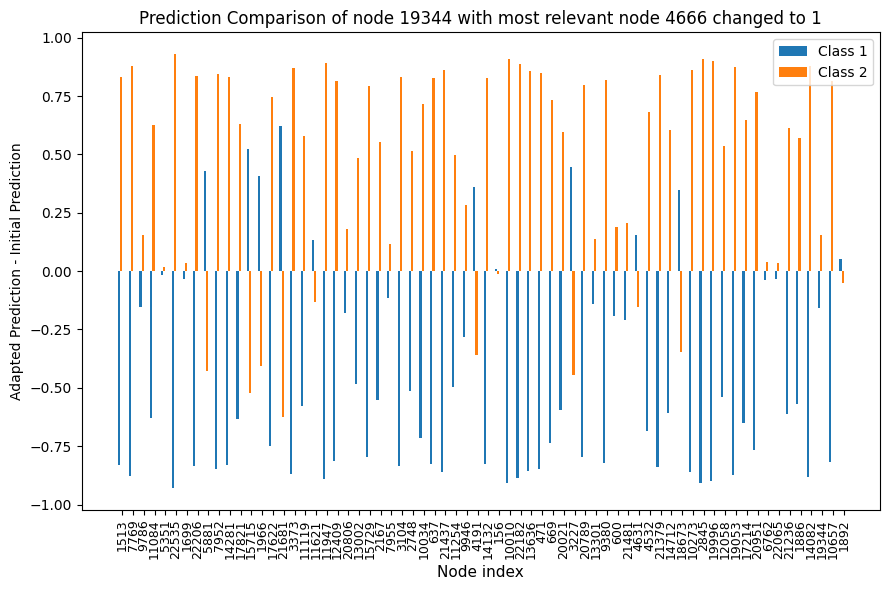

5
pred_after19344adapt_5376_7.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]
 [9.97435272e-01 

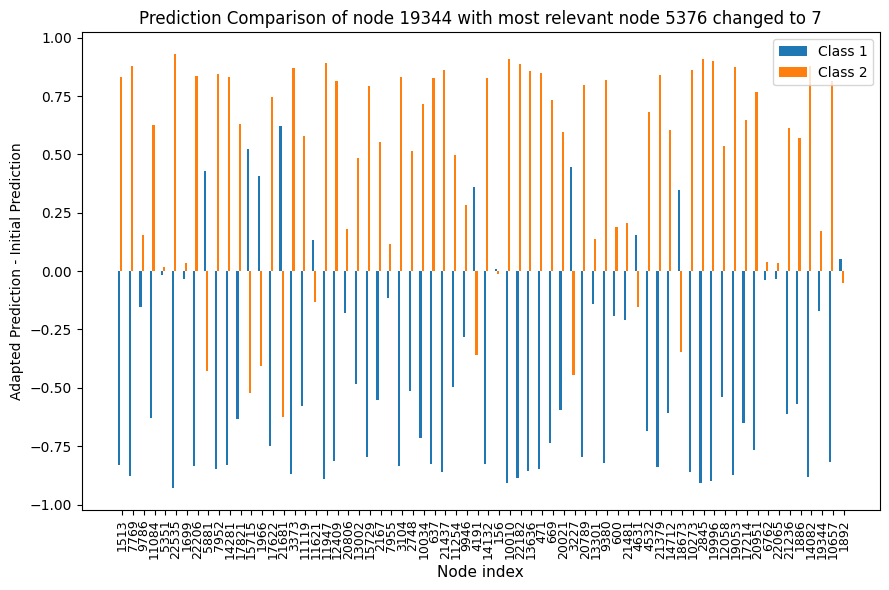

6
pred_after19996adapt_14874_0.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]
 [9.97435272e-01

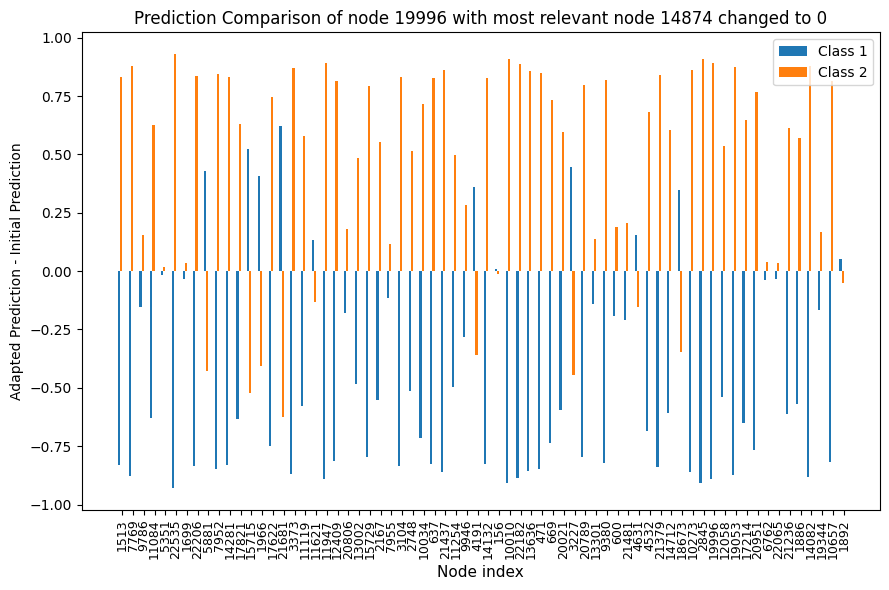

7
pred_after19996adapt_831_2.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]
 [9.97435272e-01 2

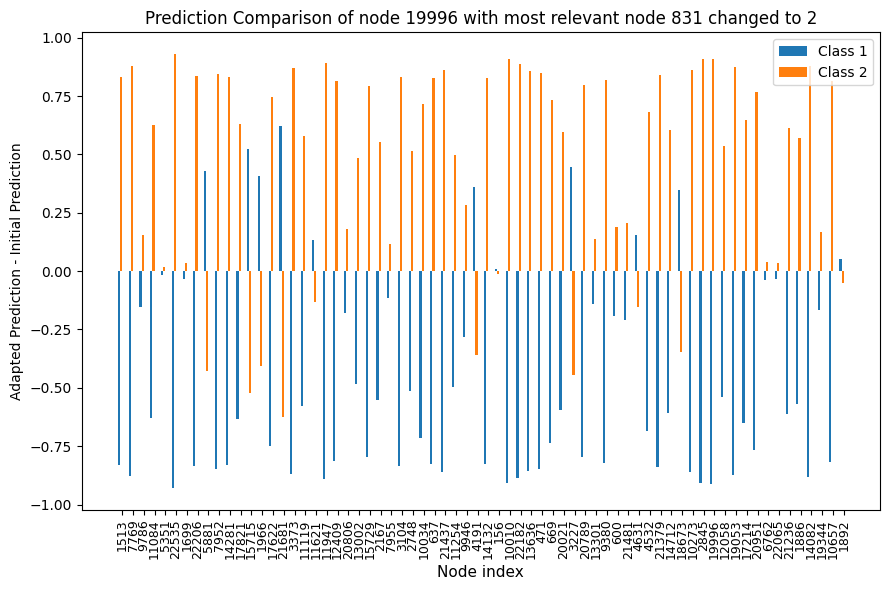

8
pred_after21481adapt_tensor([   0, 3529])_6.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]
 

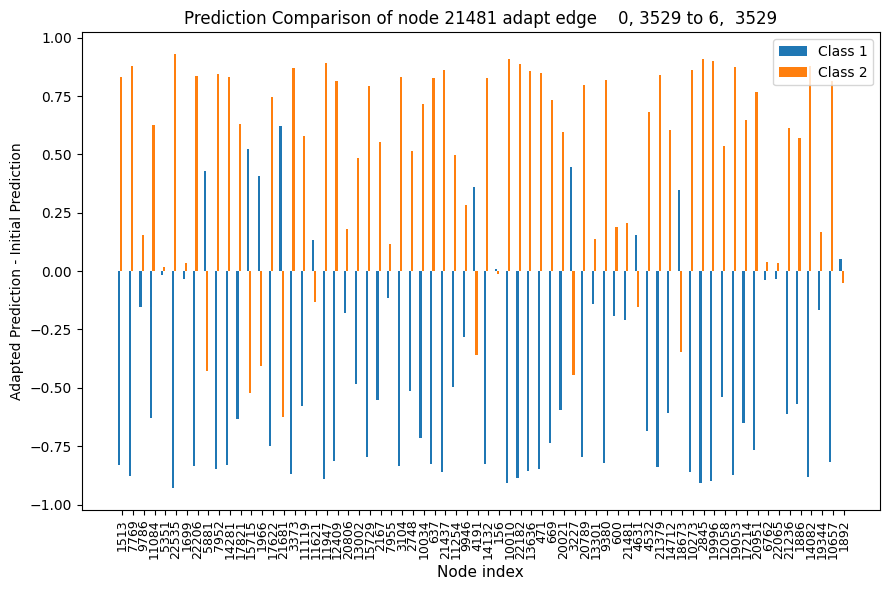

9
pred_after21481adapt_tensor([   1, 3529])_0.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]
 

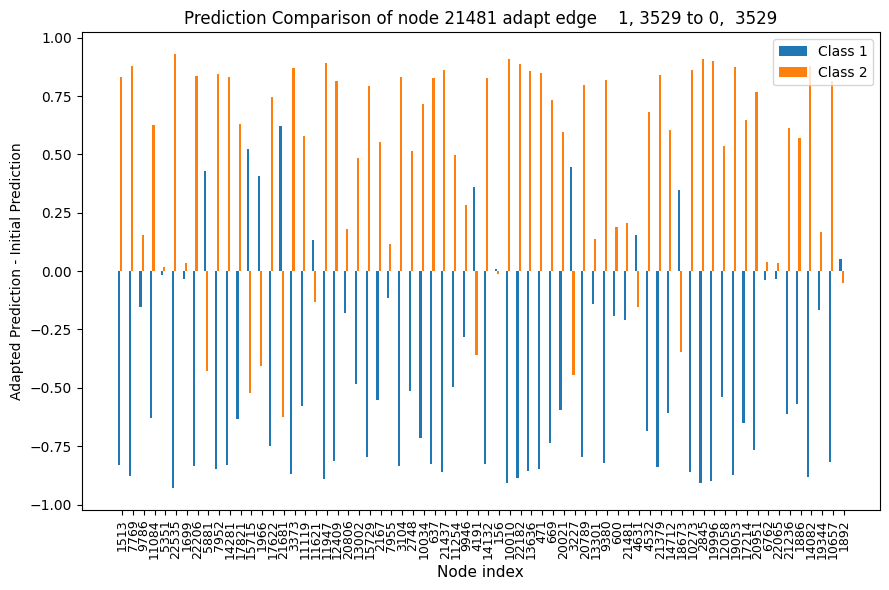

10
pred_after7955adapt_tensor([  0, 642])_1.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]
 [9

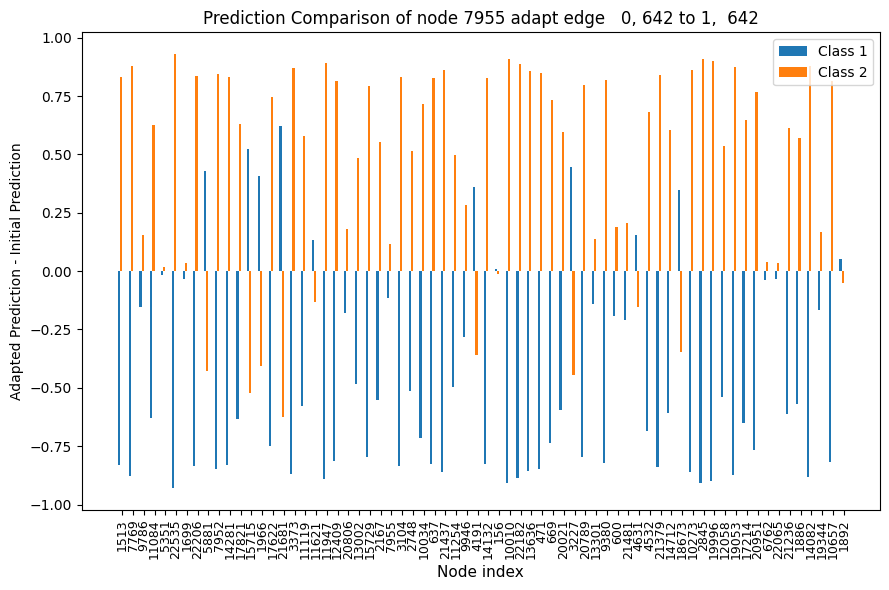

11
pred_after7955adapt_tensor([  1, 642])_3.pt
Prediction Score before:  [[9.54562902e-01 4.54370752e-02]
 [9.95614290e-01 4.38568974e-03]
 [9.20283318e-01 7.97166750e-02]
 [9.99349654e-01 6.50355825e-04]
 [9.66122746e-01 3.38772461e-02]
 [2.44273022e-01 7.55726993e-01]
 [9.78370667e-01 2.16292683e-02]
 [9.99301910e-01 6.98134536e-04]
 [8.60840321e-01 1.39159709e-01]
 [6.16233125e-02 9.38376665e-01]
 [9.47109222e-01 5.28907888e-02]
 [9.91639867e-03 9.90083575e-01]
 [9.90967453e-01 9.03257634e-03]
 [8.40865076e-01 1.59134895e-01]
 [9.95542467e-01 4.45757527e-03]
 [9.29408610e-01 7.05913678e-02]
 [6.81315541e-01 3.18684459e-01]
 [9.94071305e-01 5.92862349e-03]
 [9.89253223e-01 1.07467910e-02]
 [9.99972939e-01 2.70747751e-05]
 [8.96504402e-01 1.03495590e-01]
 [8.63057911e-01 1.36942104e-01]
 [9.77712870e-01 2.22871043e-02]
 [9.88878846e-01 1.11211473e-02]
 [8.99847448e-01 1.00152560e-01]
 [9.70069051e-01 2.99309865e-02]
 [9.89394605e-01 1.06054367e-02]
 [9.72810149e-01 2.71898508e-02]
 [9

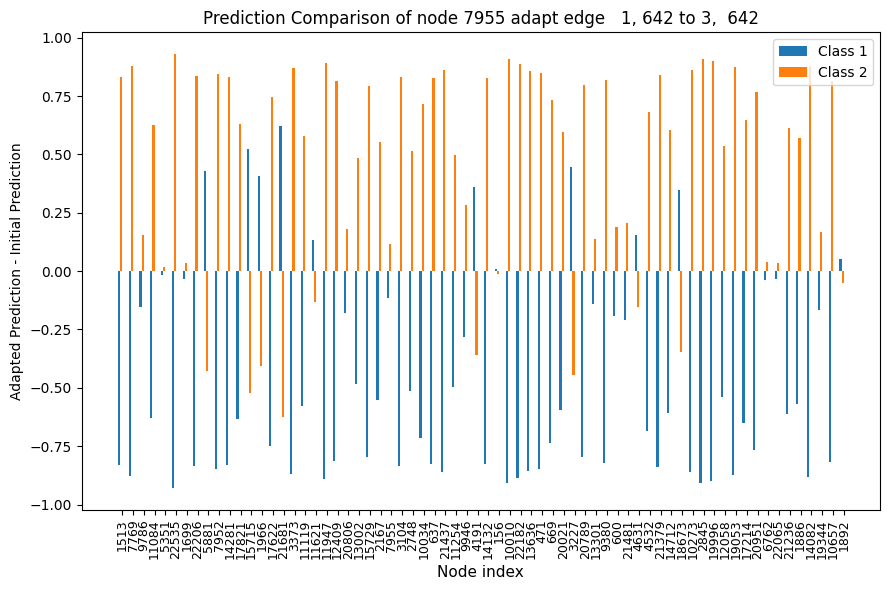

In [53]:
path = 'out/MUTAG/RGAT_emb/'+model+'/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(68)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    #plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    #plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=9)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=10)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()